# Generar 'X' e 'y' para todos los experimentos
<p>Como datos para las X se toma la media de los 17 canales de:</p>
<ul>
    <li>X_1: PSD de la banda delta (1~4Hz)</li>
    <li>X_2: PSD de la banda theta (4~8Hz)</li>
    <li>X_3: PSD de la banda alpha (8~14Hz)</li>
    <li>X_4: PSD de la banda beta (14~31Hz)</li>
</ul>

In [1]:
import mne
from mne.externals.pymatreader import read_mat

from read import read_features

import numpy as np

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

import matplotlib
import matplotlib.pyplot as plt

import pandas as pd

In [2]:
# Las que mejores graficas tienen
#features_files = ['4_20151105_noon.mat', '4_20151107_noon.mat', '5_20141108_noon.mat','12_20150928_noon.mat','14_20151014_night.mat', '18_20150926_noon.mat', '21_20151016_noon.mat']

features_files = ['1_20151124_noon_2.csv', '2_20151106_noon.csv', '3_20151024_noon.csv','4_20151105_noon.csv', '4_20151107_noon.csv',
            '5_20141108_noon.csv', '5_20151012_night.csv', '6_20151121_noon.csv','7_20151015_night.csv', '8_20151022_noon.csv', 
            '9_20151017_night.csv', '10_20151125_noon.csv', '11_20151024_night.csv', '12_20150928_noon.csv', '13_20150929_noon.csv',
            '14_20151014_night.csv','15_20151126_night.csv', '16_20151128_night.csv', '17_20150925_noon.csv', '18_20150926_noon.csv',
            '19_20151114_noon.csv', '20_20151129_night.csv', '21_20151016_noon.csv']

# features_files = ['21_20151016_noon.csv']

X_all = {} # psd
X_all_eog = {} # psd + eog
y_all = {} # datos perclos raw

for experiment in features_files:
    
    ''' EOG parpadeos por epoch'''
    mat_data = read_mat(f'./SEED-VIG/Raw_Data/{experiment[:-4]}.mat')
    
    sfreq = mat_data['EOG']['eog_config']['current_sample_rate']
    samples = mat_data['EOG']['eog_h']*1e-6 
    samples = np.vstack((samples, mat_data['EOG']['eog_v']*1e-6))

    ch_names = ['EOG_H', 'EOG_V']
    ch_types = ["eog"]*len(ch_names)

    info = mne.create_info(ch_names=ch_names, sfreq=sfreq, ch_types=ch_types)

    info.set_montage('standard_1020')
    
    raw = mne.io.RawArray(samples, info, verbose=False)
    
    # Busqueda del treshold para el parpadeo
    # En los 5 primeros segundos del experimento, buscamos el percentil 2.5 y calculamos su valor absoluto como threshold para detectar parpadeos
    threshold = abs(np.percentile(raw.get_data()[1][:5*1000], 2.5))
    
    blinks = mne.preprocessing.find_eog_events(raw, filter_length='10s', thresh=threshold, verbose=False)
    blinks = blinks.T[0]
    
    n_samples = 885
    dur_sample = 8 # segs
    len_sample = 8*125
    
    blinks_per_sample = []
    for i in range(n_samples):
        blinks_per_sample.append([])
        
    for val in blinks:
        blinks_per_sample[val//len_sample].append(val)
    
    n_blinks_per_sample = [0]*n_samples
        
    for i in range(885):
        n_blinks_per_sample[i] = len(blinks_per_sample[i])
        
    scaler = MinMaxScaler(feature_range=(0, 1))
    n_blinks_per_sample = np.array(n_blinks_per_sample)
    n_blinks_per_sample = scaler.fit_transform(n_blinks_per_sample.reshape(-1,1))
    
    
    ''' PSD '''
    mat_data = read_mat(f'./SEED-VIG/EEG_Feature_5Bands/{experiment[:-4]}.mat')
    perclos_data = read_mat(f'./SEED-VIG/perclos_labels/{experiment[:-4]}.mat')
    y = np.array(perclos_data['perclos'])

    n_channels = 17
    psd_data = mat_data['psd_movingAve']
    perclos = []
    psd_delta = []
    psd_theta = []
    psd_alpha = []
    psd_beta = []
    psd_gamma = []
    start = 0
    end = 885
    for t in range(start, end):
        vals= np.zeros(5)

        for i in range(n_channels):
            vals[0] += psd_data[i][t][0]
            vals[1] += psd_data[i][t][1]
            vals[2] += psd_data[i][t][2]
            vals[3] += psd_data[i][t][3]
            vals[4] += psd_data[i][t][4]
        vals /= 17

        perclos.append(y[t])
        psd_delta.append(vals[0])
        psd_theta.append(vals[1])
        psd_alpha.append(vals[2])
        psd_beta.append(vals[3])
        psd_gamma.append(vals[4])

    
    scaler = MinMaxScaler(feature_range=(0, 1))
    psd_delta = np.array(psd_delta)
    psd_delta = scaler.fit_transform(psd_delta.reshape(-1,1))

    scaler = MinMaxScaler(feature_range=(0, 1))
    psd_theta = np.array(psd_theta)
    psd_theta = scaler.fit_transform(psd_theta.reshape(-1,1))

    scaler = MinMaxScaler(feature_range=(0, 1))
    psd_alpha = np.array(psd_alpha)
    psd_alpha = scaler.fit_transform(psd_alpha.reshape(-1,1))

    scaler = MinMaxScaler(feature_range=(0, 1))
    psd_beta = np.array(psd_beta)
    psd_beta = scaler.fit_transform(psd_beta.reshape(-1,1))
    
    scaler = MinMaxScaler(feature_range=(0, 1))
    psd_gamma = np.array(psd_gamma)
    psd_gamma = scaler.fit_transform(psd_gamma.reshape(-1,1))

    X = psd_delta
    X = np.hstack((X, psd_theta))
    X = np.hstack((X, psd_alpha))
    X = np.hstack((X, psd_beta))
    ''' DESCOMENTAR PARA USAR PSD DE GAMMA '''
    X = np.hstack((X, psd_gamma))
    
    X_all[f'{experiment[:-4]}'] = X # guardamos los psd
    
    X = np.hstack((X, n_blinks_per_sample))
    
    X_all_eog[f'{experiment[:-4]}'] = X # guardamos psd + eog
    
    y_all[f'{experiment[:-4]}'] = y # guardamos perclos raw
    
print(f'Generados los diccionarios X_all e y_all')

Generados los diccionarios X_all e y_all


In [3]:
print(X_all_eog['1_20151124_noon_2'].shape)

for key in X_all:
    print(key)

(885, 6)
1_20151124_noon_2
2_20151106_noon
3_20151024_noon
4_20151105_noon
4_20151107_noon
5_20141108_noon
5_20151012_night
6_20151121_noon
7_20151015_night
8_20151022_noon
9_20151017_night
10_20151125_noon
11_20151024_night
12_20150928_noon
13_20150929_noon
14_20151014_night
15_20151126_night
16_20151128_night
17_20150925_noon
18_20150926_noon
19_20151114_noon
20_20151129_night
21_20151016_noon


# Busqueda de hyperparametros y muestra de los resultados

## Funciones para la busqueda y el plot

In [4]:
from sklearn.model_selection import RandomizedSearchCV

from sklearn.model_selection import StratifiedShuffleSplit

from sklearn.model_selection import train_test_split

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

from scipy.stats import uniform, randint, loguniform, gamma

def find_and_test_best_model_reg(X, y, model, space, cv=10, n_iter=100, scoring=None):
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
    
    search = RandomizedSearchCV(model, space, n_iter=n_iter, scoring=scoring, n_jobs=-1, cv=cv, random_state=42)
    result = search.fit(X_train, y_train)
    
    print(f"Best Model:")
    print(f"\tScore: {result.best_score_:.4f}")
    print(f"\tHyperparameters: {result.best_params_}")
    
    print('\nResults with X_test:')
    best_model = result.best_estimator_
    final_predictions = best_model.predict(X_test)
    # Por si los valores son mayores de 1 o menores que 0
    final_predictions = np.clip(final_predictions, 0, 1)
    
    rmse = np.sqrt(mean_squared_error(y_test, final_predictions))
    print(f"\tRMSE: {rmse:.4f}")
    
    # represents the proportion of variance (of y) that has been explained by the independent variables in the model
    r2 = r2_score(y_test, final_predictions)
    print(f"\tr^2: {r2:.4f}")
    
    return best_model, rmse, r2

def plot_results_reg(X, y, model):
    plt.figure(figsize=(20, 8))
    plt.plot(y, color="black", label="real", zorder=0)
    predictions = model.predict(X)
    predictions = np.clip(predictions, 0, 1)
    plt.plot(predictions, color="red", label="predicted")
    plt.xlabel('Epoch')
    plt.ylabel('% PERCLOS')
    plt.legend(loc='best')
    plt.show()

# <a href="https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVR.html">SVM-r</a>

In [44]:
from sklearn.svm import SVR

### Mean, STD, var, p05, ...

In [45]:
csv_dict = {
    'sujeto': [],
    'rmse': [],
    'cc': [],
    "r2": []
}

for file in features_files:
    
    X, y = read_features(f'./features/{file[:-4]}.csv')
    #X, y = read_features(file, features=[0, 1])

    scaler = MinMaxScaler(feature_range=(0, 1))
    X_minmax = scaler.fit_transform(X)

    scaler = StandardScaler()
    X_standar = scaler.fit_transform(X)

    key = file[:-4]
    print(f"Experiment: {key}")
    model = SVR()

    space = dict()
    
    space['kernel'] = ['linear', 'rbf']
    space['gamma'] = ['scale', 'auto']
    space['tol'] = uniform(1e-5, 1e-1)
    space['C'] = randint(1, 500)
    space['epsilon'] = uniform(0.01, 0.5)
    space['shrinking'] = [True, False]

    best_model, rmse, r2 = find_and_test_best_model_reg(X_minmax, y, model, space, cv=10,  n_iter=35)
    
    csv_dict['sujeto'].append(key)
    csv_dict['rmse'].append(rmse)
    csv_dict['cc'].append(np.sqrt(r2))
    csv_dict['r2'].append(r2)

#     plot_results_reg(X_minmax, y, best_model)
    
df = pd.DataFrame(csv_dict)
df.to_csv('./results_reg/SVM_r-EEG.csv', index=False)

Experiment: 1_20151124_noon_2
Best Model:
	Score: 0.7595
	Hyperparameters: {'C': 265, 'epsilon': 0.0179831261101071, 'gamma': 'auto', 'kernel': 'rbf', 'shrinking': False, 'tol': 0.044025249373960136}

Results with X_test:
	RMSE: 0.1258
	r^2: 0.7963
Experiment: 2_20151106_noon
Best Model:
	Score: 0.0486
	Hyperparameters: {'C': 65, 'epsilon': 0.017818203370596968, 'gamma': 'scale', 'kernel': 'rbf', 'shrinking': True, 'tol': 0.019881568153417243}

Results with X_test:
	RMSE: 0.1602
	r^2: 0.0519
Experiment: 3_20151024_noon
Best Model:
	Score: 0.3944
	Hyperparameters: {'C': 265, 'epsilon': 0.0179831261101071, 'gamma': 'auto', 'kernel': 'rbf', 'shrinking': False, 'tol': 0.044025249373960136}

Results with X_test:
	RMSE: 0.1251
	r^2: 0.5157
Experiment: 4_20151105_noon
Best Model:
	Score: 0.2442
	Hyperparameters: {'C': 28, 'epsilon': 0.11922021860841679, 'gamma': 'auto', 'kernel': 'rbf', 'shrinking': False, 'tol': 0.053944224191565075}

Results with X_test:
	RMSE: 0.1754
	r^2: 0.2144
Experimen

KeyboardInterrupt: 

### PSD

In [46]:
key = '21_20151016_noon'

csv_dict = {
    'sujeto': [],
    'rmse': [],
    'cc': [],
    "r2": []
}

for key in X_all:
    print(f"Experiment: {key}")
    model = SVR()

    space = dict()
    
    space['kernel'] = ['linear', 'rbf', 'sigmoid']
    space['gamma'] = ['scale', 'auto']
    space['tol'] = uniform(1e-5, 1e-1)
    space['C'] = randint(1, 500)
    space['epsilon'] = uniform(0.01, 0.5)
    space['shrinking'] = [True, False]

    best_model, rmse, r2 = find_and_test_best_model_reg(X_all[key], y_all[key], model, space, cv=10,  n_iter=25)
    
    csv_dict['sujeto'].append(key)
    csv_dict['rmse'].append(rmse)
    csv_dict['cc'].append(np.sqrt(r2))
    csv_dict['r2'].append(r2)
    
    #plot_results_reg(X_all[key], y_all[key], best_model)
    
df = pd.DataFrame(csv_dict)
df.to_csv('./results_reg/SVM_r-PSD.csv', index=False)

Experiment: 1_20151124_noon_2
Best Model:
	Score: 0.9233
	Hyperparameters: {'C': 100, 'epsilon': 0.08143340896097039, 'gamma': 'scale', 'kernel': 'rbf', 'shrinking': True, 'tol': 0.09700098521619943}

Results with X_test:
	RMSE: 0.0842
	r^2: 0.9087
Experiment: 2_20151106_noon
Best Model:
	Score: 0.4740
	Hyperparameters: {'C': 100, 'epsilon': 0.08143340896097039, 'gamma': 'scale', 'kernel': 'rbf', 'shrinking': True, 'tol': 0.09700098521619943}

Results with X_test:
	RMSE: 0.1051
	r^2: 0.5922
Experiment: 3_20151024_noon
Best Model:
	Score: 0.7129
	Hyperparameters: {'C': 100, 'epsilon': 0.08143340896097039, 'gamma': 'scale', 'kernel': 'rbf', 'shrinking': True, 'tol': 0.09700098521619943}

Results with X_test:
	RMSE: 0.0854
	r^2: 0.7745
Experiment: 4_20151105_noon
Best Model:
	Score: 0.5206
	Hyperparameters: {'C': 100, 'epsilon': 0.08143340896097039, 'gamma': 'scale', 'kernel': 'rbf', 'shrinking': True, 'tol': 0.09700098521619943}

Results with X_test:
	RMSE: 0.1031
	r^2: 0.7285
Experiment

### PSD+EOG

In [47]:
key = '21_20151016_noon'

csv_dict = {
    'sujeto': [],
    'rmse': [],
    'cc': [],
    "r2": []
}

for key in X_all:
    print(f"Experiment: {key}")
    model = SVR()

    space = dict()
    
    space['kernel'] = ['linear', 'rbf', 'sigmoid']
    space['gamma'] = ['scale', 'auto']
    space['tol'] = uniform(1e-5, 1e-1)
    space['C'] = randint(1, 500)
    space['epsilon'] = uniform(0.01, 0.5)
    space['shrinking'] = [True, False]

    best_model, rmse, r2 = find_and_test_best_model_reg(X_all_eog[key], y_all[key], model, space, cv=10,  n_iter=25)
    
    csv_dict['sujeto'].append(key)
    csv_dict['rmse'].append(rmse)
    csv_dict['cc'].append(np.sqrt(r2))
    csv_dict['r2'].append(r2)
    
    #plot_results_reg(X_all_eog[key], y_all[key], best_model)
    
df = pd.DataFrame(csv_dict)
df.to_csv('./results_reg/SVM_r-PSD+EOG.csv', index=False)

Experiment: 1_20151124_noon_2
Best Model:
	Score: 0.9095
	Hyperparameters: {'C': 100, 'epsilon': 0.08143340896097039, 'gamma': 'scale', 'kernel': 'rbf', 'shrinking': True, 'tol': 0.09700098521619943}

Results with X_test:
	RMSE: 0.0893
	r^2: 0.8974
Experiment: 2_20151106_noon
Best Model:
	Score: 0.6093
	Hyperparameters: {'C': 100, 'epsilon': 0.08143340896097039, 'gamma': 'scale', 'kernel': 'rbf', 'shrinking': True, 'tol': 0.09700098521619943}

Results with X_test:
	RMSE: 0.1063
	r^2: 0.5826
Experiment: 3_20151024_noon
Best Model:
	Score: 0.7381
	Hyperparameters: {'C': 100, 'epsilon': 0.08143340896097039, 'gamma': 'scale', 'kernel': 'rbf', 'shrinking': True, 'tol': 0.09700098521619943}

Results with X_test:
	RMSE: 0.0878
	r^2: 0.7617
Experiment: 4_20151105_noon
Best Model:
	Score: 0.4744
	Hyperparameters: {'C': 100, 'epsilon': 0.08143340896097039, 'gamma': 'scale', 'kernel': 'rbf', 'shrinking': True, 'tol': 0.09700098521619943}

Results with X_test:
	RMSE: 0.1376
	r^2: 0.5162
Experiment

# <a href="https://scikit-learn.org/stable/modules/neighbors.html#nearest-neighbors-regression">K Nearest Neighbors (KNN)</a>

In [48]:
from sklearn.neighbors import KNeighborsRegressor

### Mean, STD, var, p05, ...

In [49]:
csv_dict = {
    'sujeto': [],
    'rmse': [],
    'cc': [],
    "r2": []
}

for file in features_files:
    
    X, y = read_features(f'./features/{file[:-4]}.csv')
    #X, y = read_features(file, features=[0, 1])

    scaler = MinMaxScaler(feature_range=(0, 1))
    X_minmax = scaler.fit_transform(X)

    scaler = StandardScaler()
    X_standar = scaler.fit_transform(X)

    key = file[:-4]
    print(f"Experiment: {key}")
    model = KNeighborsRegressor(n_jobs=-1)

    space = dict()
    space['n_neighbors'] = randint(3, 25)
    space['weights'] = ['uniform', 'distance']
    space['algorithm'] = ['auto', 'ball_tree', 'kd_tree', 'brute']
    space['leaf_size'] = randint(15, 45)
    space['p'] = [1, 2]

    best_model, rmse, r2 = find_and_test_best_model_reg(X_minmax, y, model, space, cv=10,  n_iter=20)
    
    csv_dict['sujeto'].append(key)
    csv_dict['rmse'].append(rmse)
    csv_dict['cc'].append(np.sqrt(r2))
    csv_dict['r2'].append(r2)

#     plot_results_reg(X_minmax, y, best_model)
    
df = pd.DataFrame(csv_dict)
df.to_csv('./results_reg/KNN-EEG.csv', index=False)

Experiment: 1_20151124_noon_2
Best Model:
	Score: 0.7837
	Hyperparameters: {'algorithm': 'kd_tree', 'leaf_size': 35, 'n_neighbors': 11, 'p': 1, 'weights': 'distance'}

Results with X_test:
	RMSE: 0.1492
	r^2: 0.7137
Experiment: 2_20151106_noon
Best Model:
	Score: 0.1563
	Hyperparameters: {'algorithm': 'kd_tree', 'leaf_size': 34, 'n_neighbors': 17, 'p': 1, 'weights': 'distance'}

Results with X_test:
	RMSE: 0.1455
	r^2: 0.2188
Experiment: 3_20151024_noon
Best Model:
	Score: 0.5266
	Hyperparameters: {'algorithm': 'kd_tree', 'leaf_size': 35, 'n_neighbors': 11, 'p': 1, 'weights': 'distance'}

Results with X_test:
	RMSE: 0.1078
	r^2: 0.6408
Experiment: 4_20151105_noon
Best Model:
	Score: 0.2646
	Hyperparameters: {'algorithm': 'ball_tree', 'leaf_size': 20, 'n_neighbors': 24, 'p': 2, 'weights': 'distance'}

Results with X_test:
	RMSE: 0.1679
	r^2: 0.2797
Experiment: 4_20151107_noon
Best Model:
	Score: 0.3005
	Hyperparameters: {'algorithm': 'kd_tree', 'leaf_size': 35, 'n_neighbors': 11, 'p': 1

### PSD

In [50]:
key = '21_20151016_noon'

csv_dict = {
    'sujeto': [],
    'rmse': [],
    'cc': [],
    "r2": []
}

for key in X_all:
    print(f"Experiment: {key}")
    model = KNeighborsRegressor(n_jobs=-1)

    space = dict()
    space['n_neighbors'] = randint(3, 25)
    space['weights'] = ['uniform', 'distance']
    space['algorithm'] = ['auto', 'ball_tree', 'kd_tree', 'brute']
    space['leaf_size'] = randint(15, 45)
    space['p'] = [1, 2]

    best_model, rmse, r2 = find_and_test_best_model_reg(X_all[key], y_all[key], model, space, cv=10,  n_iter=75)
    
    csv_dict['sujeto'].append(key)
    csv_dict['rmse'].append(rmse)
    csv_dict['cc'].append(np.sqrt(r2))
    csv_dict['r2'].append(r2)
    
    #plot_results_reg(X_all[key], y_all[key], best_model)
    
df = pd.DataFrame(csv_dict)
df.to_csv('./results_reg/KNN-PSD.csv', index=False) 

Experiment: 1_20151124_noon_2
Best Model:
	Score: 0.9544
	Hyperparameters: {'algorithm': 'brute', 'leaf_size': 31, 'n_neighbors': 4, 'p': 1, 'weights': 'distance'}

Results with X_test:
	RMSE: 0.0649
	r^2: 0.9458
Experiment: 2_20151106_noon
Best Model:
	Score: 0.7601
	Hyperparameters: {'algorithm': 'auto', 'leaf_size': 38, 'n_neighbors': 3, 'p': 2, 'weights': 'distance'}

Results with X_test:
	RMSE: 0.0625
	r^2: 0.8557
Experiment: 3_20151024_noon
Best Model:
	Score: 0.7659
	Hyperparameters: {'algorithm': 'kd_tree', 'leaf_size': 34, 'n_neighbors': 6, 'p': 1, 'weights': 'distance'}

Results with X_test:
	RMSE: 0.0707
	r^2: 0.8454
Experiment: 4_20151105_noon
Best Model:
	Score: 0.6645
	Hyperparameters: {'algorithm': 'brute', 'leaf_size': 15, 'n_neighbors': 3, 'p': 1, 'weights': 'distance'}

Results with X_test:
	RMSE: 0.0852
	r^2: 0.8144
Experiment: 4_20151107_noon
Best Model:
	Score: 0.7434
	Hyperparameters: {'algorithm': 'ball_tree', 'leaf_size': 24, 'n_neighbors': 5, 'p': 1, 'weights':

### PSD + EOG

In [51]:
key = '21_20151016_noon'

csv_dict = {
    'sujeto': [],
    'rmse': [],
    'cc': [],
    "r2": []
}

for key in X_all:
    print(f"Experiment: {key}")
    model = KNeighborsRegressor(n_jobs=-1)

    space = dict()
    space['n_neighbors'] = randint(3, 25)
    space['weights'] = ['uniform', 'distance']
    space['algorithm'] = ['auto', 'ball_tree', 'kd_tree', 'brute']
    space['leaf_size'] = randint(15, 45)
    space['p'] = [1, 2]

    best_model, rmse, r2 = find_and_test_best_model_reg(X_all_eog[key], y_all[key], model, space, cv=10,  n_iter=75)
    
    csv_dict['sujeto'].append(key)
    csv_dict['rmse'].append(rmse)
    csv_dict['cc'].append(np.sqrt(r2))
    csv_dict['r2'].append(r2)

    # plot_results_reg(X_all_eog[key], y_all[key], best_model)
    
df = pd.DataFrame(csv_dict)
df.to_csv('./results_reg/KNN-PSD+EOG.csv', index=False) 

Experiment: 1_20151124_noon_2
Best Model:
	Score: 0.9363
	Hyperparameters: {'algorithm': 'kd_tree', 'leaf_size': 34, 'n_neighbors': 6, 'p': 1, 'weights': 'distance'}

Results with X_test:
	RMSE: 0.0794
	r^2: 0.9188
Experiment: 2_20151106_noon
Best Model:
	Score: 0.6677
	Hyperparameters: {'algorithm': 'ball_tree', 'leaf_size': 24, 'n_neighbors': 5, 'p': 1, 'weights': 'distance'}

Results with X_test:
	RMSE: 0.0758
	r^2: 0.7879
Experiment: 3_20151024_noon
Best Model:
	Score: 0.7238
	Hyperparameters: {'algorithm': 'brute', 'leaf_size': 31, 'n_neighbors': 4, 'p': 1, 'weights': 'distance'}

Results with X_test:
	RMSE: 0.0809
	r^2: 0.7973
Experiment: 4_20151105_noon
Best Model:
	Score: 0.6104
	Hyperparameters: {'algorithm': 'kd_tree', 'leaf_size': 34, 'n_neighbors': 17, 'p': 1, 'weights': 'distance'}

Results with X_test:
	RMSE: 0.1083
	r^2: 0.7007
Experiment: 4_20151107_noon
Best Model:
	Score: 0.7077
	Hyperparameters: {'algorithm': 'brute', 'leaf_size': 37, 'n_neighbors': 7, 'p': 1, 'weigh

# <a href="https://scikit-learn.org/stable/modules/tree.html#regression">Decision Trees</a>

In [5]:
from sklearn.tree import DecisionTreeRegressor

### Mean, STD, var, p05, ...

Experiment: 1_20151124_noon_2
Best Model:
	Score: 0.7089
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 59, 'criterion': 'mse'}

Results with X_test:
	RMSE: 0.1647
	r^2: 0.6508


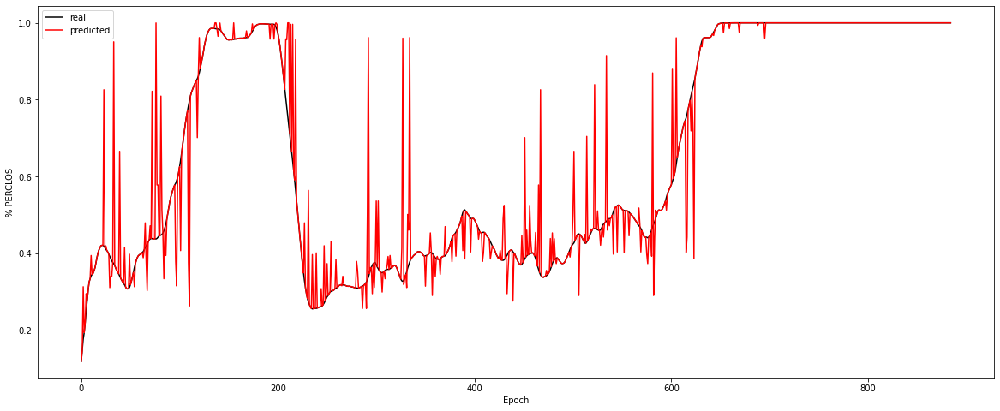

Experiment: 2_20151106_noon
Best Model:
	Score: -0.3480
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 90, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1859
	r^2: -0.2756


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in sqrt


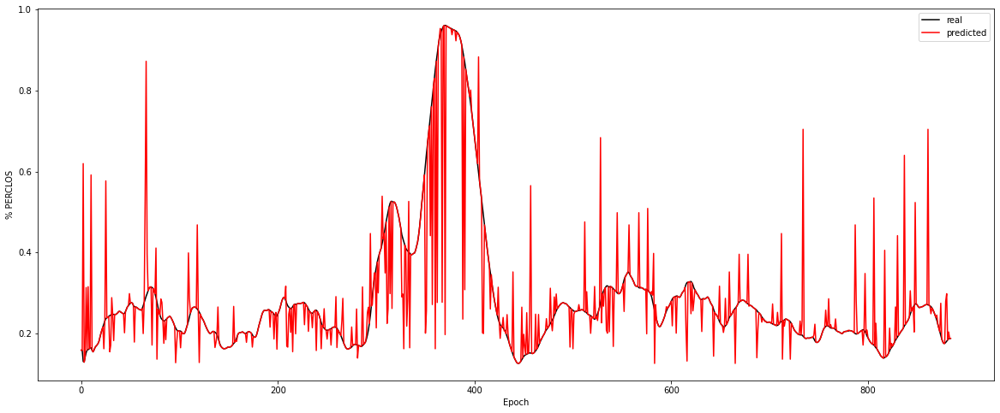

Experiment: 3_20151024_noon
Best Model:
	Score: 0.0813
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 95, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1677
	r^2: 0.1307


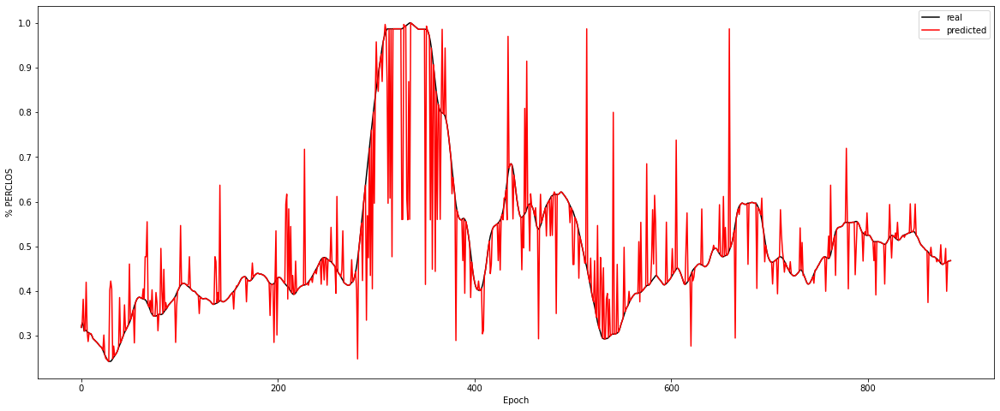

Experiment: 4_20151105_noon
Best Model:
	Score: -0.2624
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 82, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.2146
	r^2: -0.1764


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in sqrt


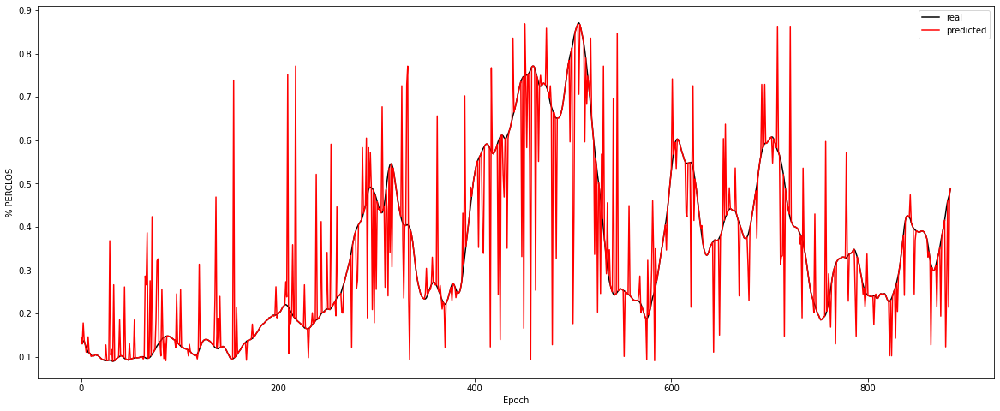

Experiment: 4_20151107_noon
Best Model:
	Score: -0.1803
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 51, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.2547
	r^2: -0.1042


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in sqrt


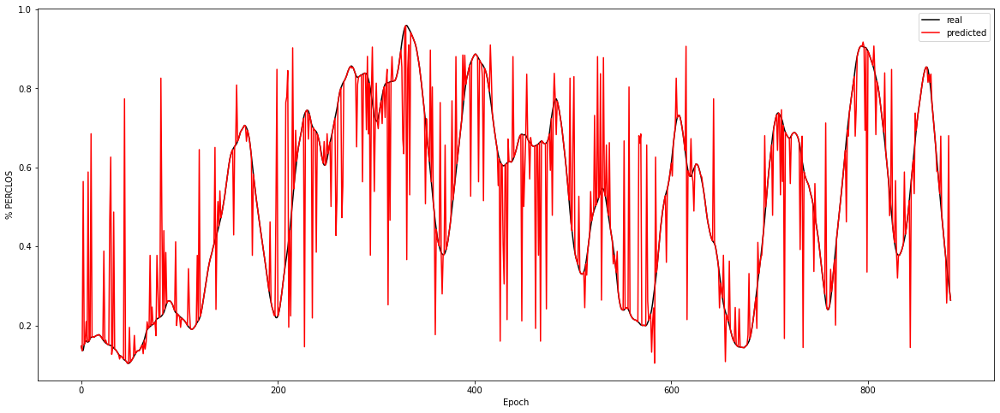

Experiment: 5_20141108_noon
Best Model:
	Score: 0.2772
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 95, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.2738
	r^2: 0.2681


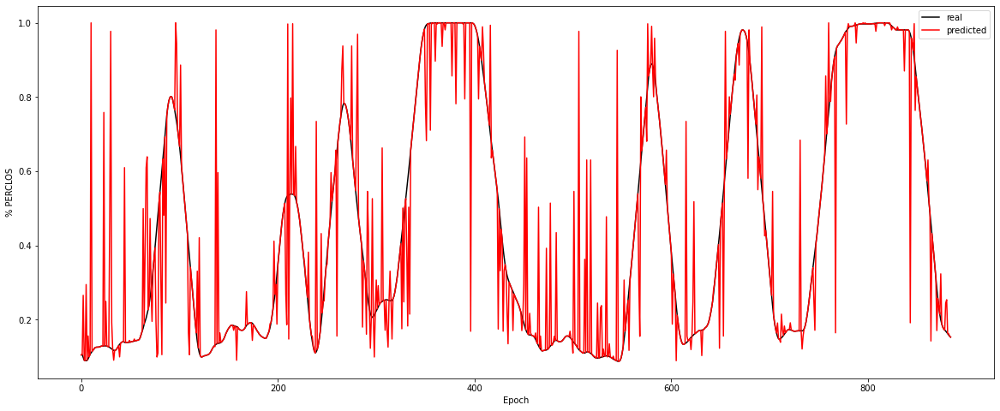

Experiment: 5_20151012_night
Best Model:
	Score: 0.4296
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 82, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.2050
	r^2: 0.4429


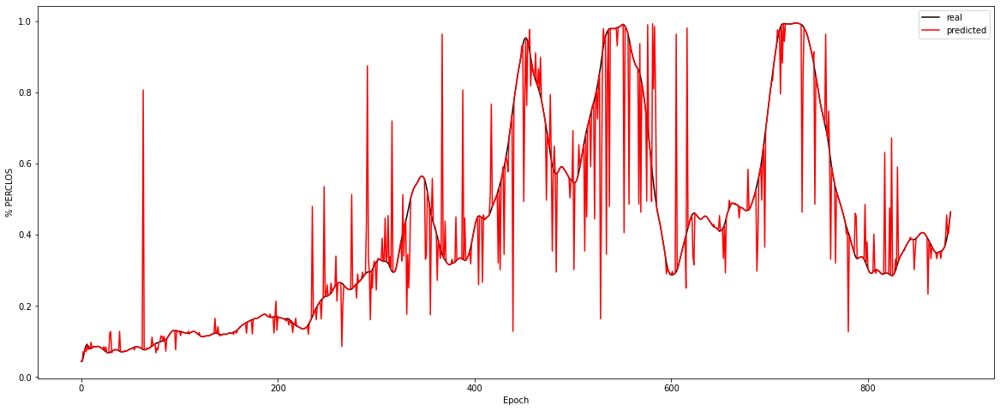

Experiment: 6_20151121_noon
Best Model:
	Score: -0.2333
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 82, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1247
	r^2: 0.0648


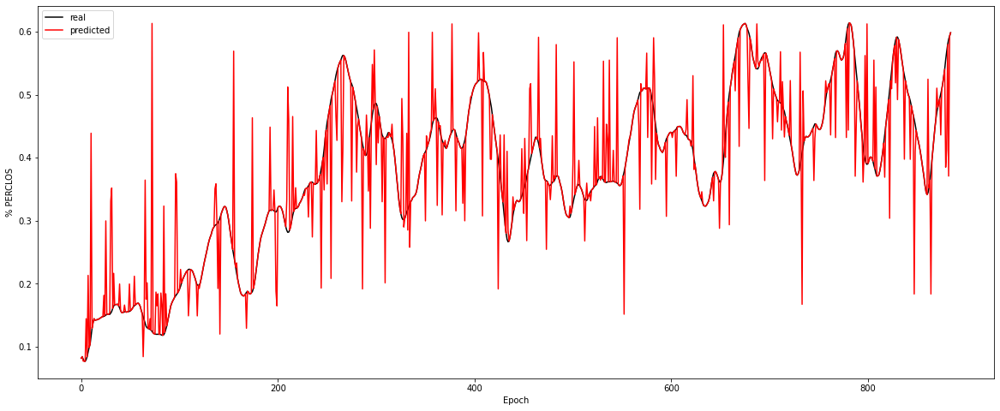

Experiment: 7_20151015_night
Best Model:
	Score: 0.0576
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 82, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1198
	r^2: 0.1048


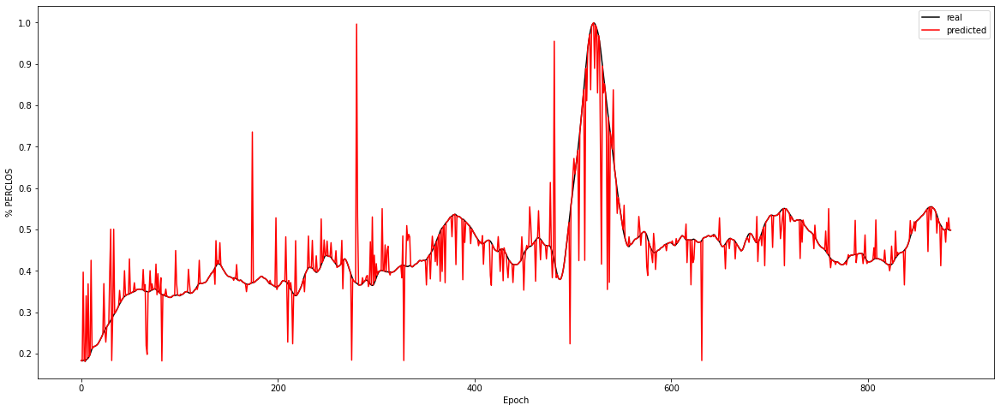

Experiment: 8_20151022_noon
Best Model:
	Score: 0.4806
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 24, 'criterion': 'mse'}

Results with X_test:
	RMSE: 0.1895
	r^2: 0.3055


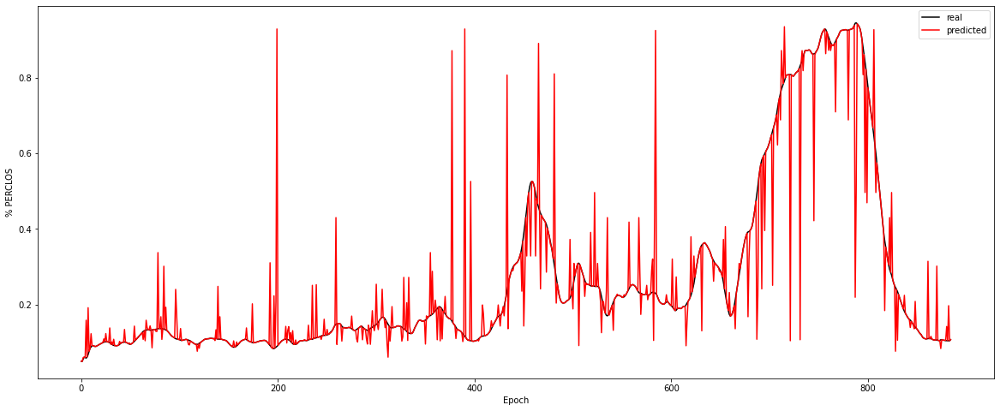

Experiment: 9_20151017_night
Best Model:
	Score: -0.2292
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 24, 'criterion': 'mse'}

Results with X_test:
	RMSE: 0.1459
	r^2: -0.3562


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in sqrt


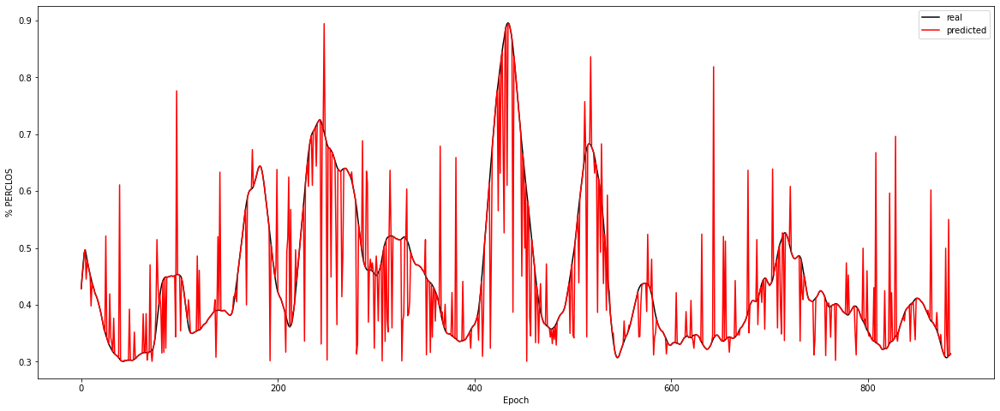

Experiment: 10_20151125_noon
Best Model:
	Score: -0.5402
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 51, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1891
	r^2: -0.6564


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in sqrt


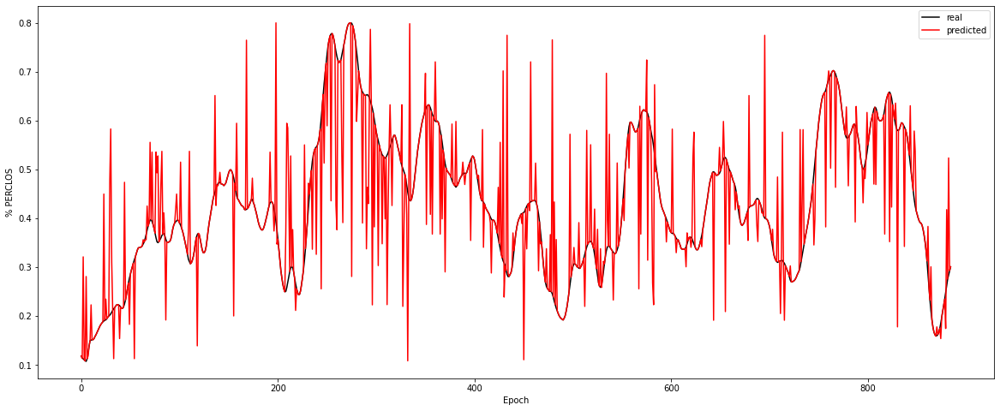

Experiment: 11_20151024_night
Best Model:
	Score: -0.3664
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 90, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1775
	r^2: -0.8068


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in sqrt


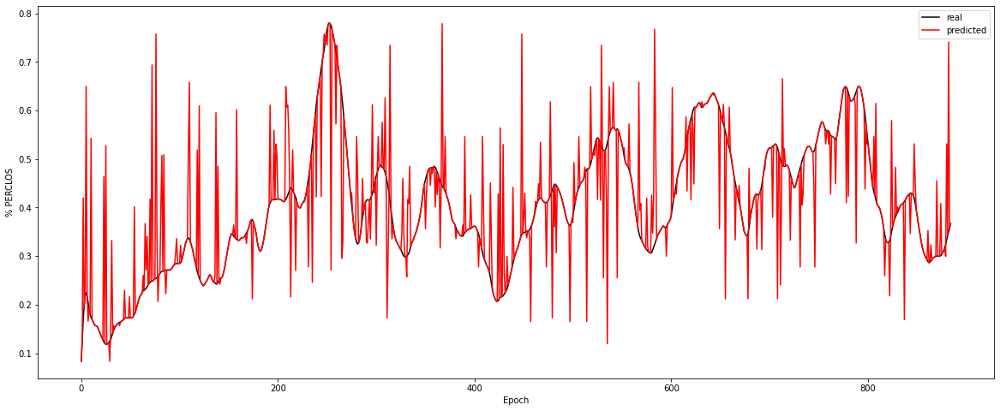

Experiment: 12_20150928_noon
Best Model:
	Score: 0.3732
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 24, 'criterion': 'mse'}

Results with X_test:
	RMSE: 0.2790
	r^2: 0.4648


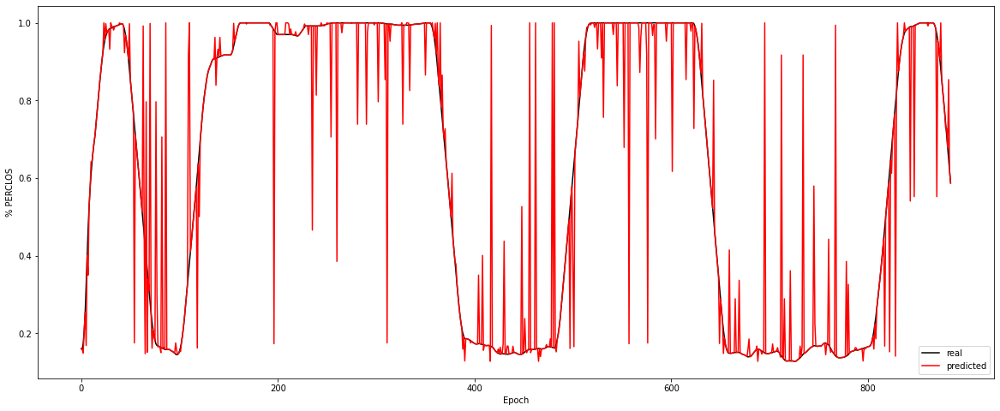

Experiment: 13_20150929_noon
Best Model:
	Score: 0.4512
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 95, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1366
	r^2: 0.5332


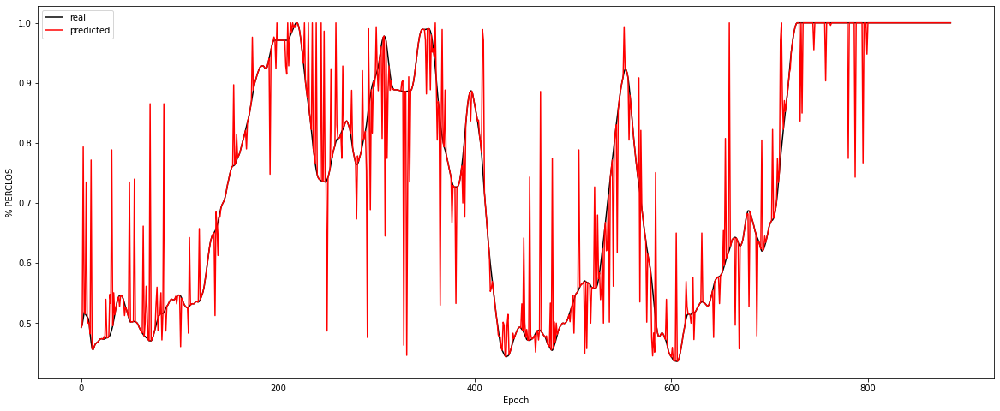

Experiment: 14_20151014_night
Best Model:
	Score: -0.3696
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 82, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.2672
	r^2: -0.3459


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in sqrt


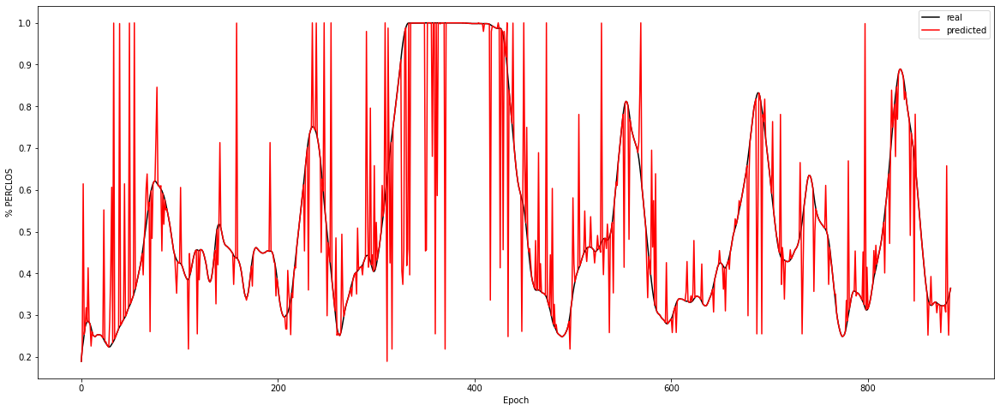

Experiment: 15_20151126_night
Best Model:
	Score: -0.0516
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 95, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1990
	r^2: -0.3307


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in sqrt


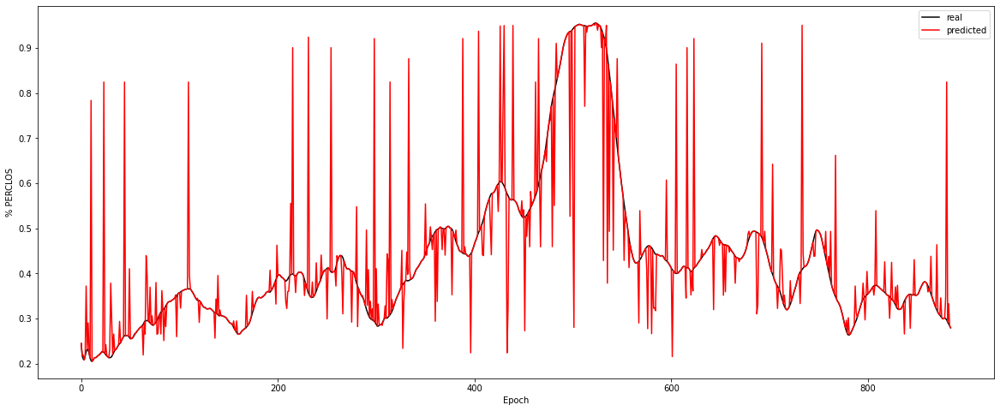

Experiment: 16_20151128_night
Best Model:
	Score: 0.1587
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 24, 'criterion': 'mse'}

Results with X_test:
	RMSE: 0.2899
	r^2: 0.2166


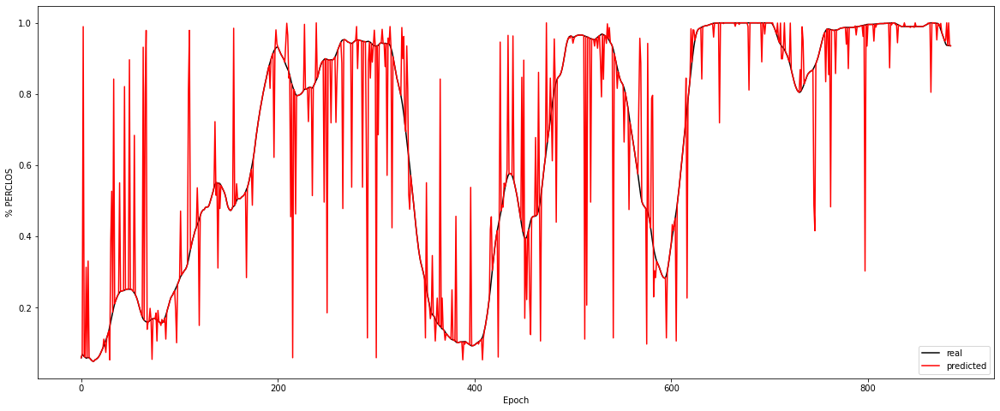

Experiment: 17_20150925_noon
Best Model:
	Score: 0.3435
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 95, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1775
	r^2: 0.1599


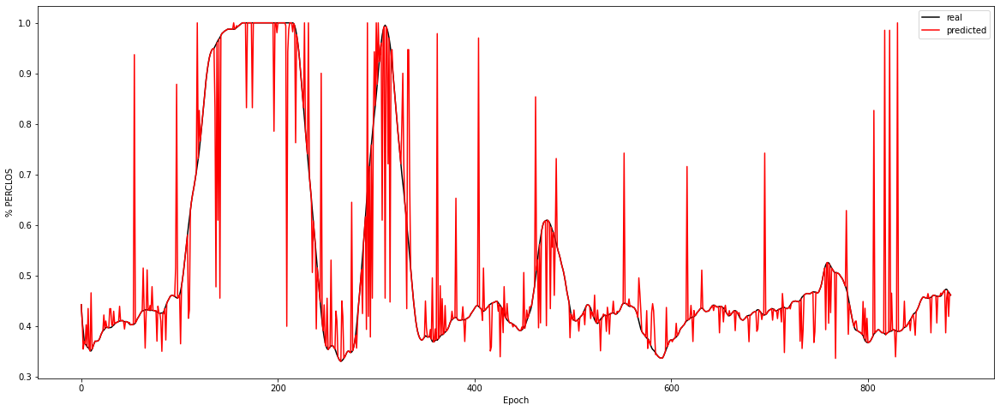

Experiment: 18_20150926_noon
Best Model:
	Score: 0.6831
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 82, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.2034
	r^2: 0.6611


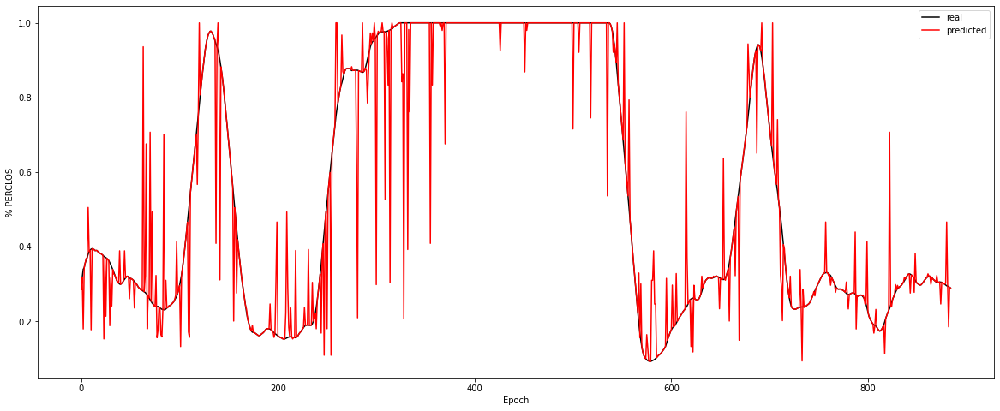

Experiment: 19_20151114_noon
Best Model:
	Score: 0.0570
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 82, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1078
	r^2: 0.1384


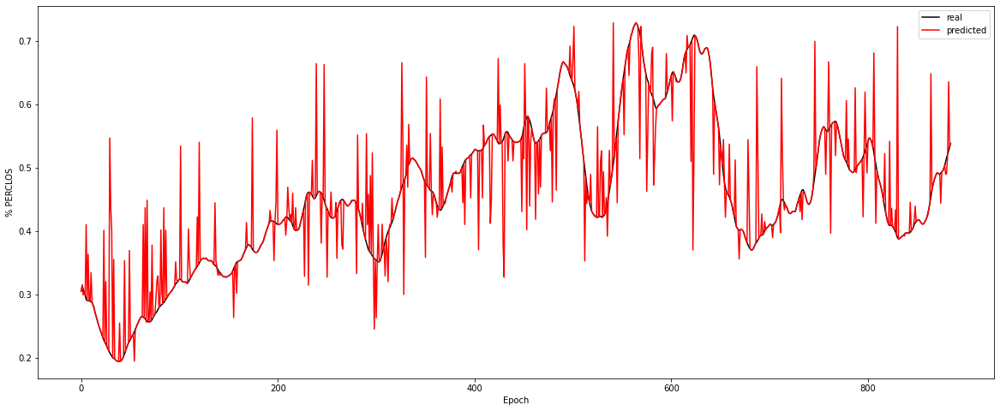

Experiment: 20_20151129_night
Best Model:
	Score: 0.2999
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 95, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.3265
	r^2: 0.1931


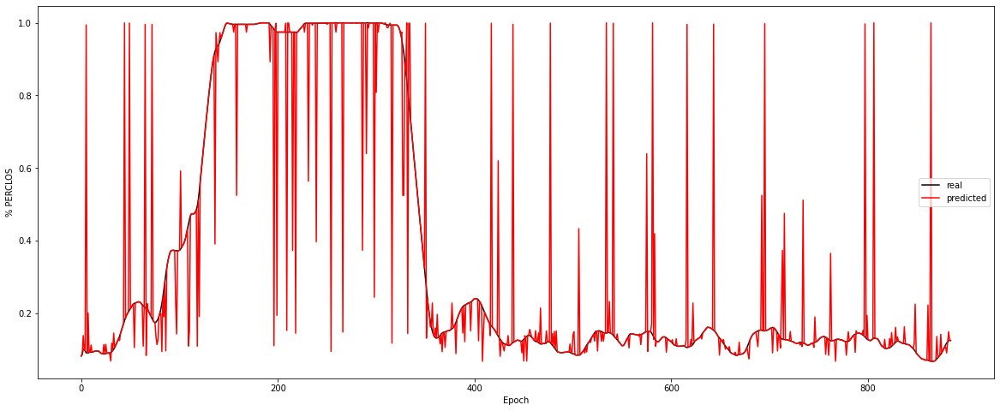

Experiment: 21_20151016_noon
Best Model:
	Score: 0.0012
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 95, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.3290
	r^2: -0.0258


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:35: RuntimeWarning: invalid value encountered in sqrt


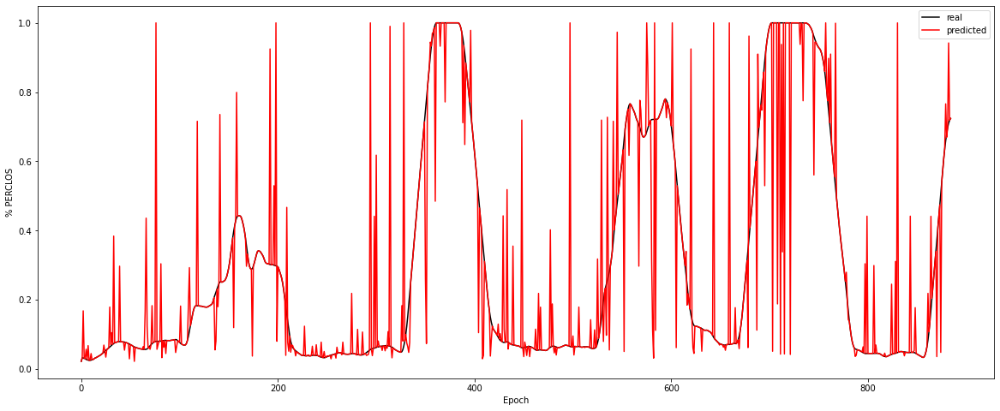

In [53]:
csv_dict = {
    'sujeto': [],
    'rmse': [],
    'cc': [],
    "r2": []
}

for file in features_files:
    
    X, y = read_features(f'./features/{file[:-4]}.csv')
    #X, y = read_features(file, features=[0, 1])

    scaler = MinMaxScaler(feature_range=(0, 1))
    X_minmax = scaler.fit_transform(X)

    scaler = StandardScaler()
    X_standar = scaler.fit_transform(X)

    key = file[:-4]
    print(f"Experiment: {key}")
    model = DecisionTreeRegressor(random_state=42)

    space = dict()
    space['criterion'] = ['mse', 'friedman_mse']
    space['splitter'] = ["best", "random"]
    space['max_depth'] = [None] + np.array(range(5, 100)).tolist()
    space['min_samples_split'] = [2]
    space['min_samples_leaf'] = [1]
    space['max_features'] = ["auto", "sqrt", "log2"]

    best_model, rmse, r2 = find_and_test_best_model_reg(X_minmax, y, model, space, cv=10,  n_iter=10)
    
    csv_dict['sujeto'].append(key)
    csv_dict['rmse'].append(rmse)
    csv_dict['cc'].append(np.sqrt(r2))
    csv_dict['r2'].append(r2)

    plot_results_reg(X_minmax, y, best_model)
    
df = pd.DataFrame(csv_dict)
df.to_csv('./results_reg/DT-EEG.csv', index=False)

### PSD

Experiment: 1_20151124_noon_2
Best Model:
	Score: 0.9228
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 21, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.0962
	r^2: 0.8809


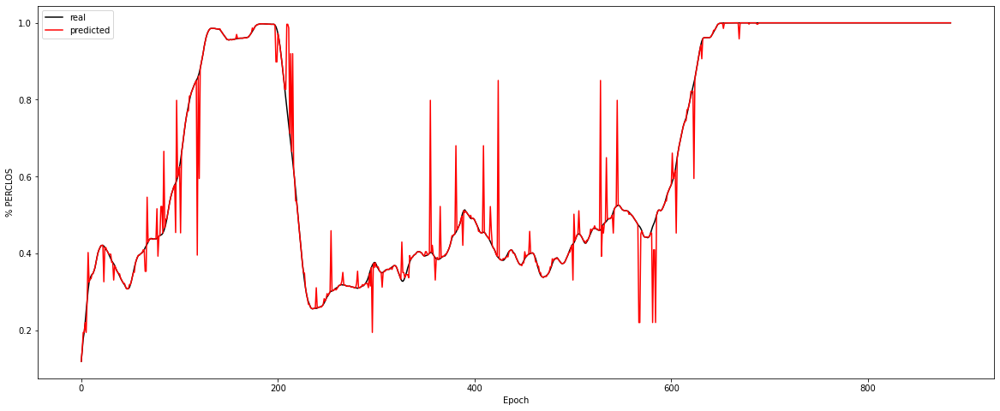

Experiment: 2_20151106_noon
Best Model:
	Score: 0.5835
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 15, 'criterion': 'mae'}

Results with X_test:
	RMSE: 0.1114
	r^2: 0.5415


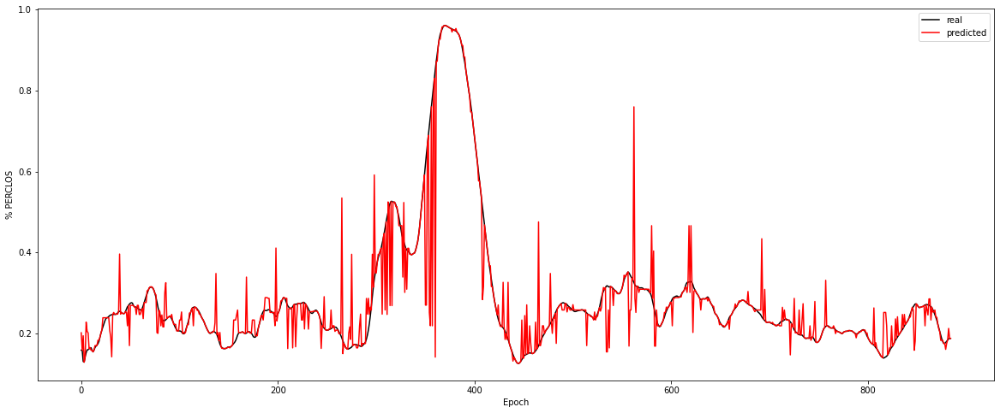

Experiment: 3_20151024_noon
Best Model:
	Score: 0.5827
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 76, 'criterion': 'mse'}

Results with X_test:
	RMSE: 0.1258
	r^2: 0.5101


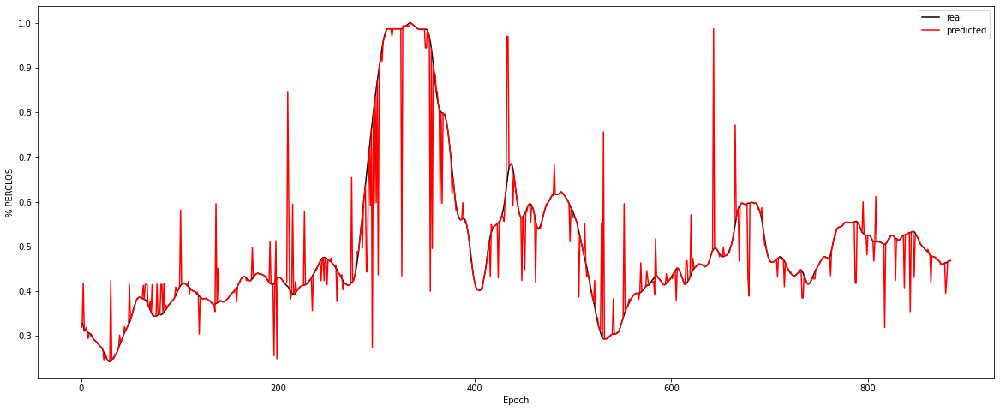

Experiment: 4_20151105_noon
Best Model:
	Score: 0.4677
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 7, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1239
	r^2: 0.6080


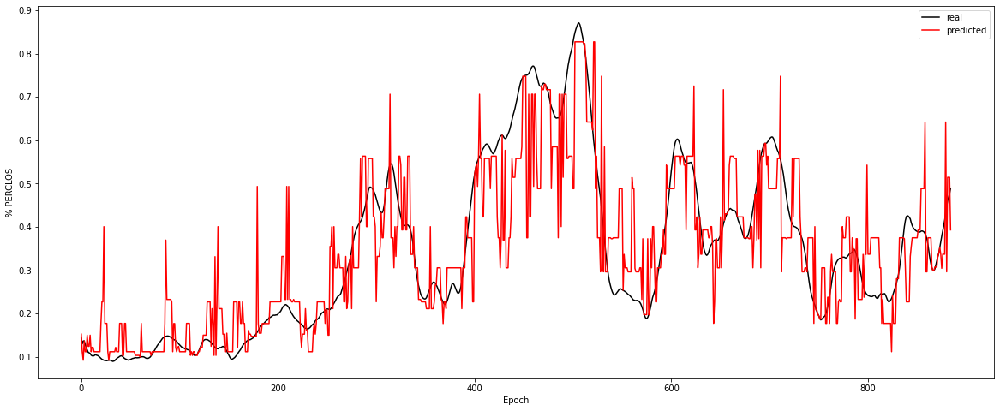

Experiment: 4_20151107_noon
Best Model:
	Score: 0.6072
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 7, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1663
	r^2: 0.5293


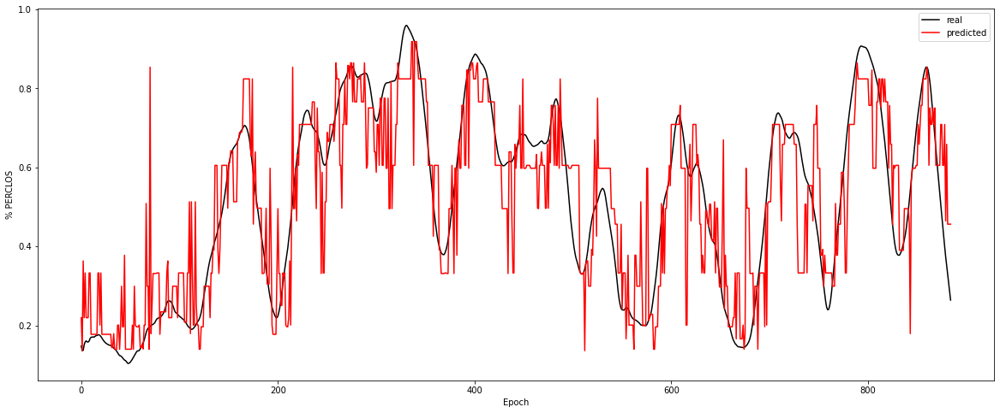

Experiment: 5_20141108_noon
Best Model:
	Score: 0.7548
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 21, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1834
	r^2: 0.6718


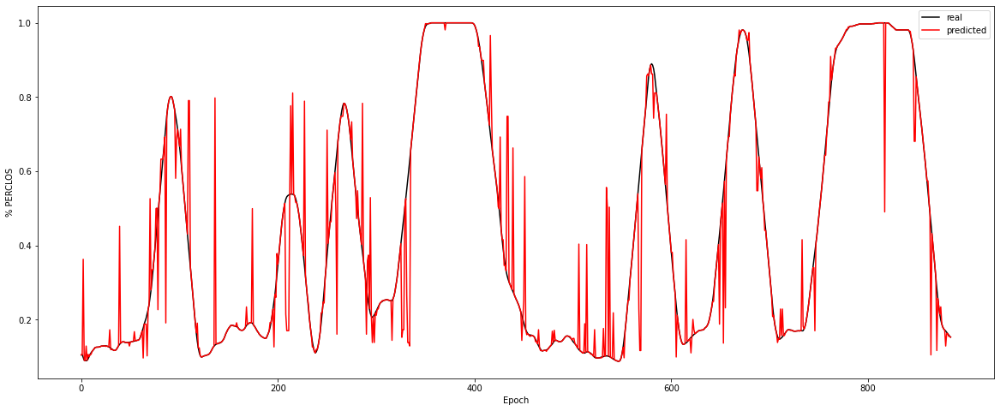

Experiment: 5_20151012_night
Best Model:
	Score: 0.7529
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 76, 'criterion': 'mse'}

Results with X_test:
	RMSE: 0.1113
	r^2: 0.8357


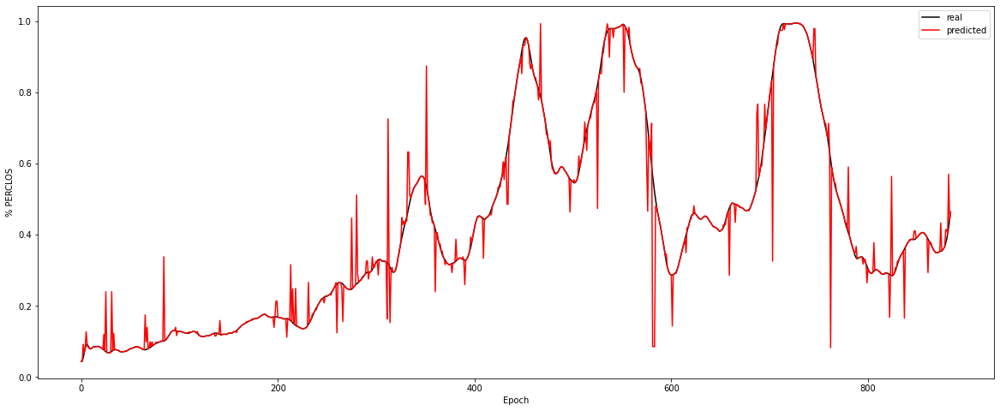

Experiment: 6_20151121_noon
Best Model:
	Score: 0.3212
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 49, 'criterion': 'mae'}

Results with X_test:
	RMSE: 0.1007
	r^2: 0.3900


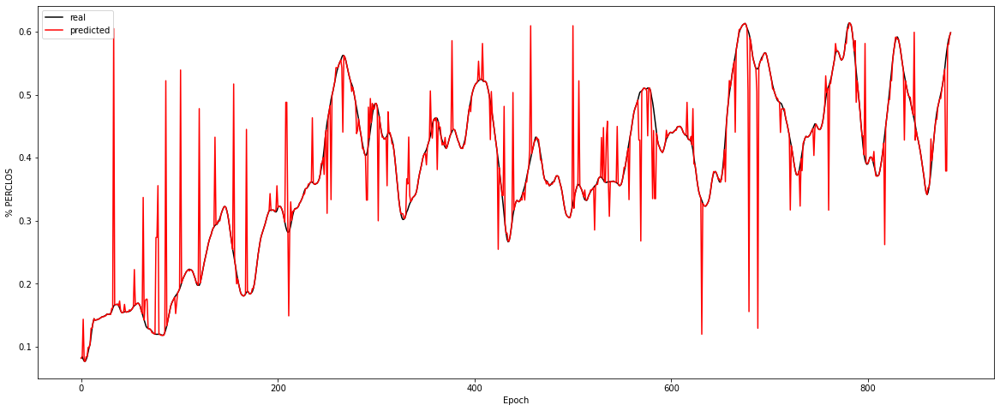

Experiment: 7_20151015_night
Best Model:
	Score: 0.6010
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 8, 'criterion': 'mse'}

Results with X_test:
	RMSE: 0.0642
	r^2: 0.7428


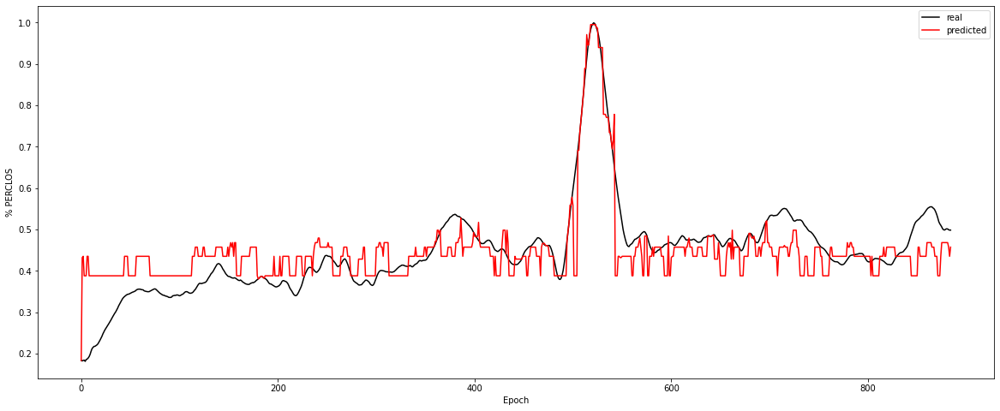

Experiment: 8_20151022_noon
Best Model:
	Score: 0.9061
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 21, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.0744
	r^2: 0.8929


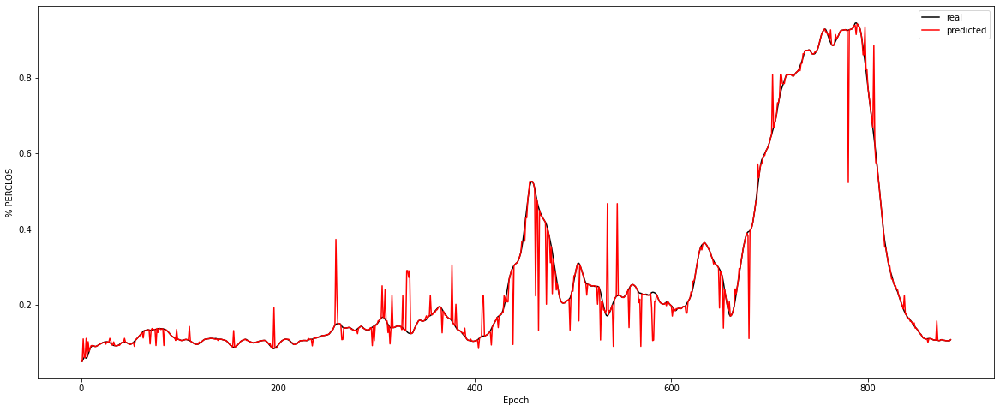

Experiment: 9_20151017_night
Best Model:
	Score: 0.5765
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 15, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.0782
	r^2: 0.6102


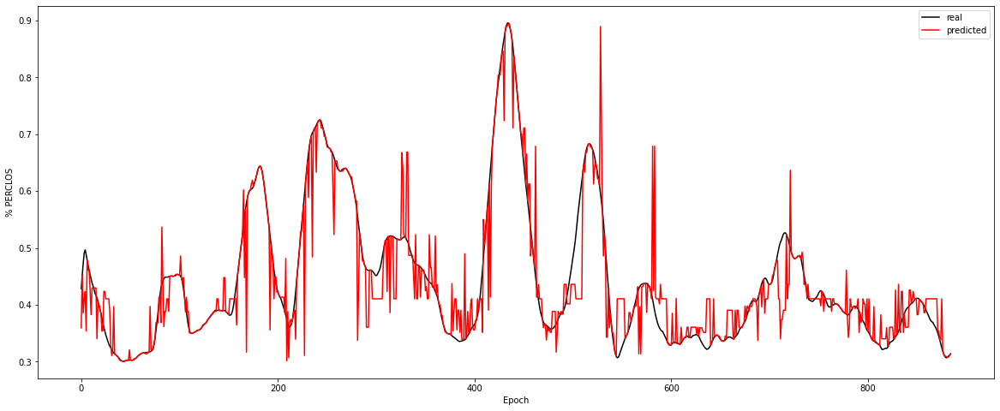

Experiment: 10_20151125_noon
Best Model:
	Score: 0.4367
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 7, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1231
	r^2: 0.2986


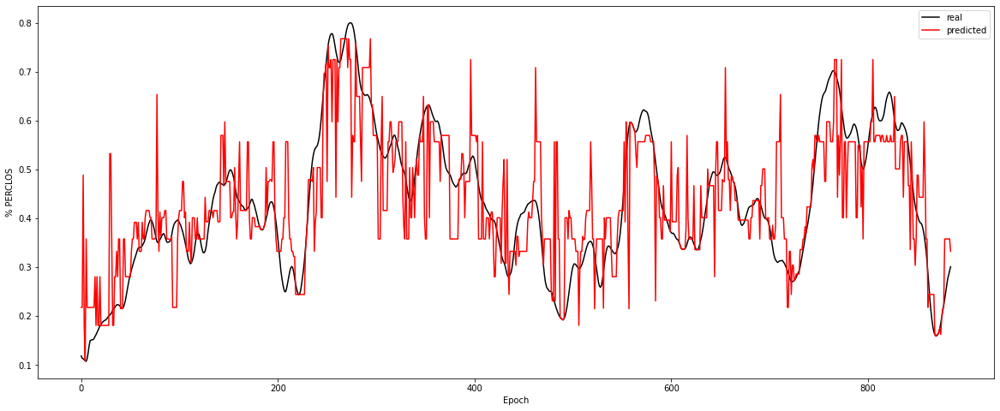

Experiment: 11_20151024_night
Best Model:
	Score: 0.4533
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 21, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.0978
	r^2: 0.4523


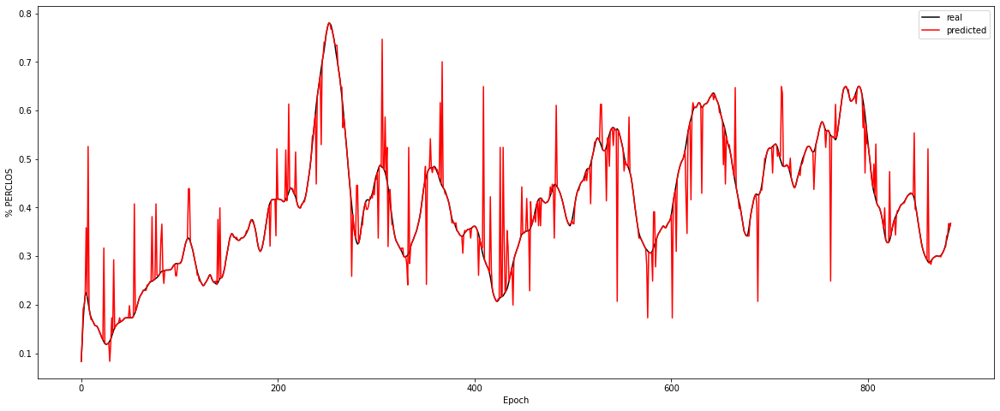

Experiment: 12_20150928_noon
Best Model:
	Score: 0.9172
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 76, 'criterion': 'mse'}

Results with X_test:
	RMSE: 0.1241
	r^2: 0.8942


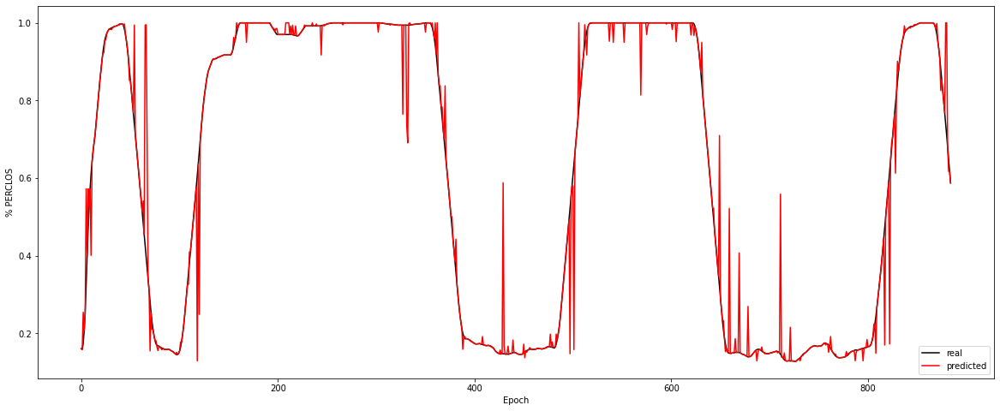

Experiment: 13_20150929_noon
Best Model:
	Score: 0.8486
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 7, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.0706
	r^2: 0.8754


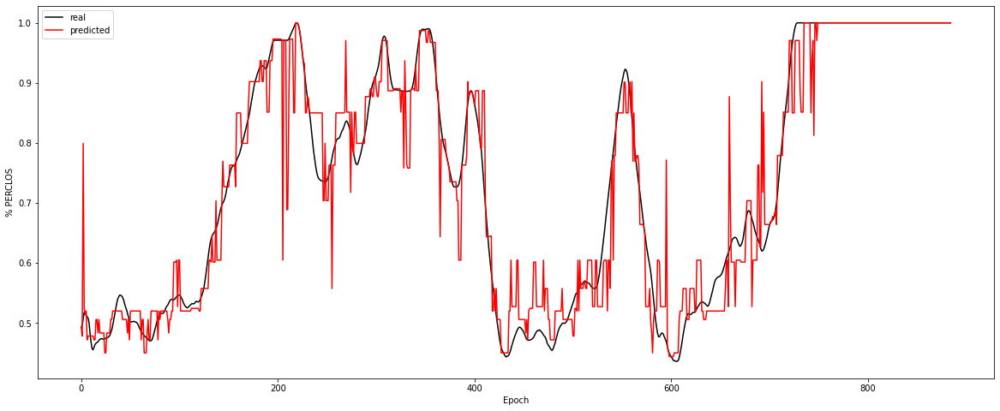

Experiment: 14_20151014_night
Best Model:
	Score: 0.6489
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 7, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1314
	r^2: 0.6744


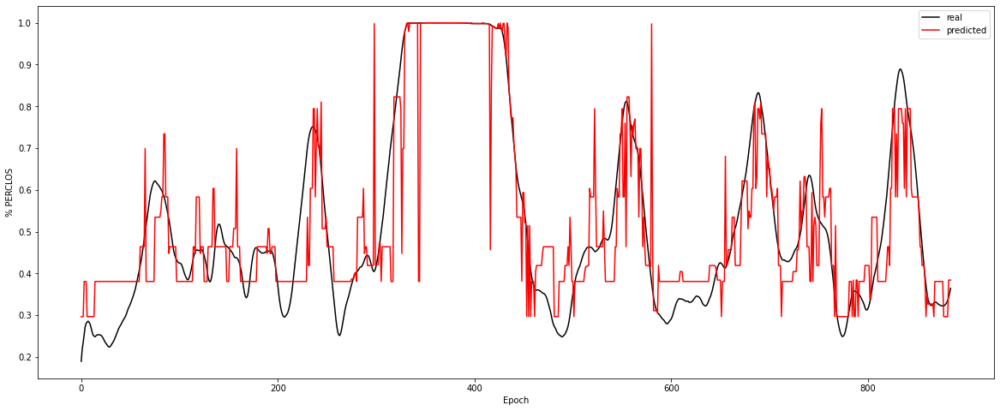

Experiment: 15_20151126_night
Best Model:
	Score: 0.8188
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 41, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.0918
	r^2: 0.7168


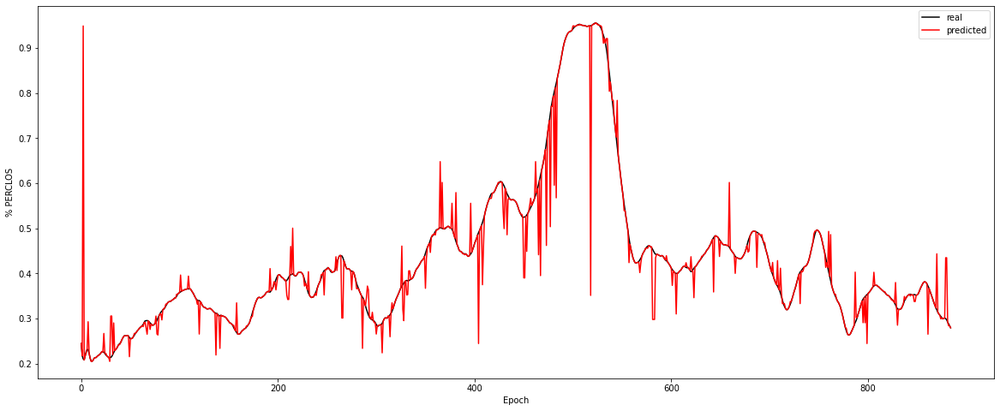

Experiment: 16_20151128_night
Best Model:
	Score: 0.8548
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 21, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.0915
	r^2: 0.9219


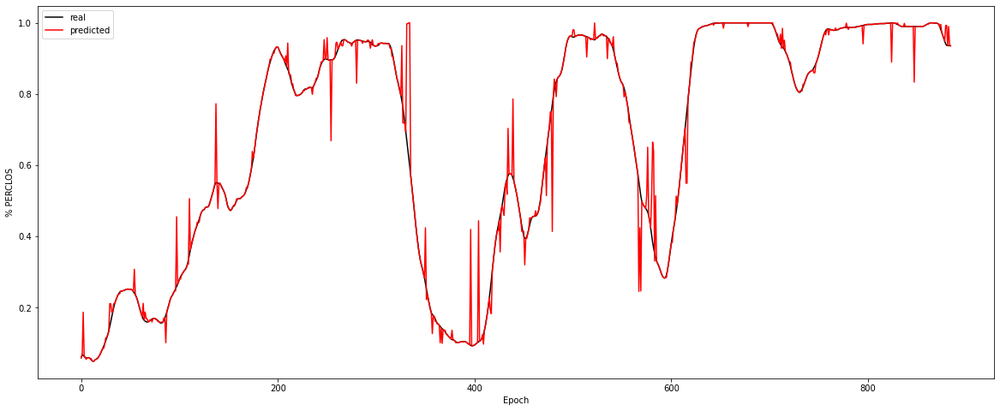

Experiment: 17_20150925_noon
Best Model:
	Score: 0.8397
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 74, 'criterion': 'mae'}

Results with X_test:
	RMSE: 0.0944
	r^2: 0.7623


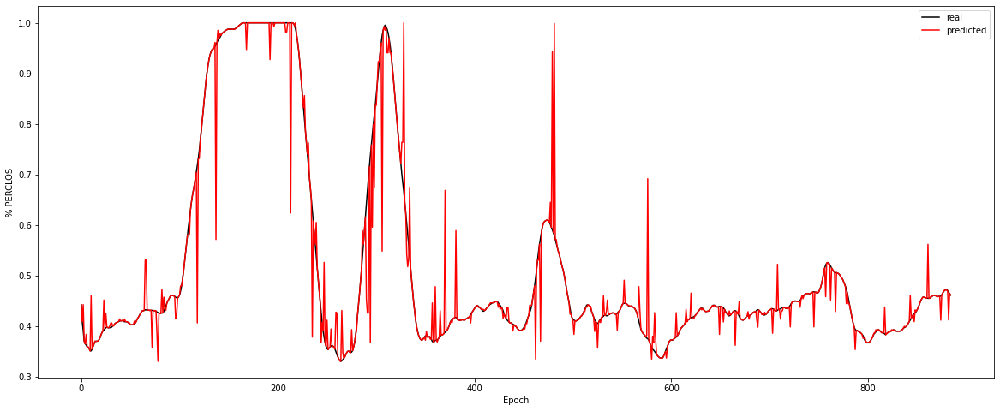

Experiment: 18_20150926_noon
Best Model:
	Score: 0.9177
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 23, 'criterion': 'mae'}

Results with X_test:
	RMSE: 0.0896
	r^2: 0.9342


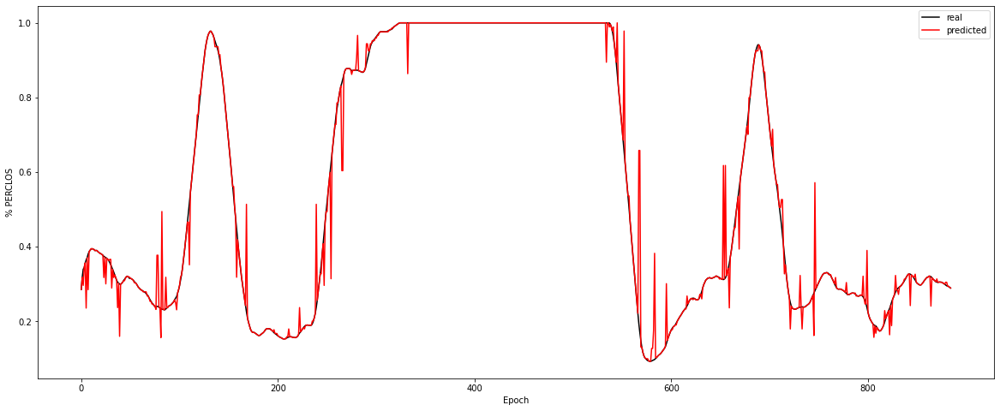

Experiment: 19_20151114_noon
Best Model:
	Score: 0.5856
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 25, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.0881
	r^2: 0.4254


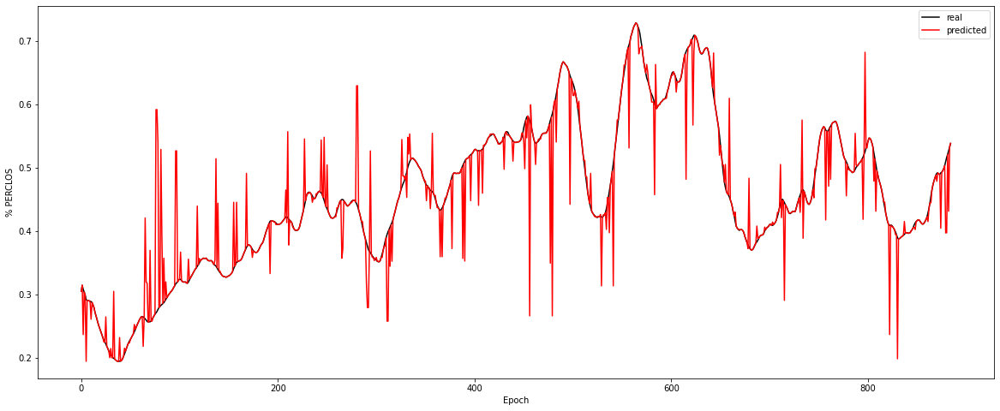

Experiment: 20_20151129_night
Best Model:
	Score: 0.5473
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 76, 'criterion': 'mse'}

Results with X_test:
	RMSE: 0.2488
	r^2: 0.5315


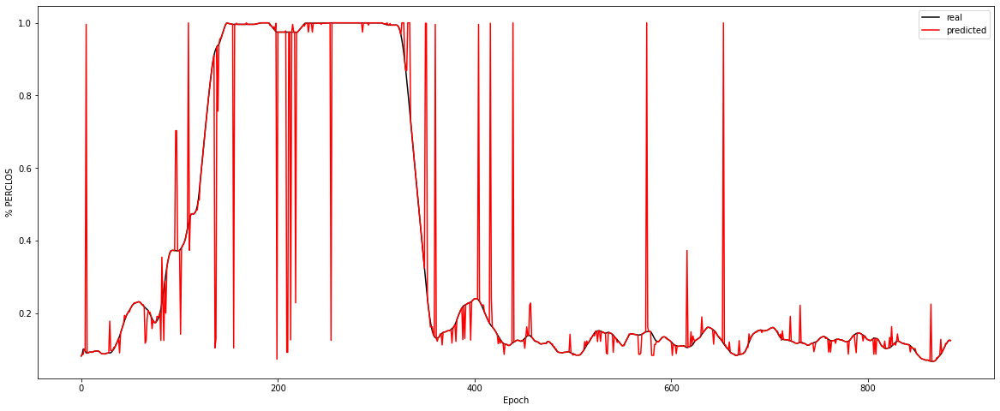

Experiment: 21_20151016_noon
Best Model:
	Score: 0.7456
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 88, 'criterion': 'mse'}

Results with X_test:
	RMSE: 0.1287
	r^2: 0.8430


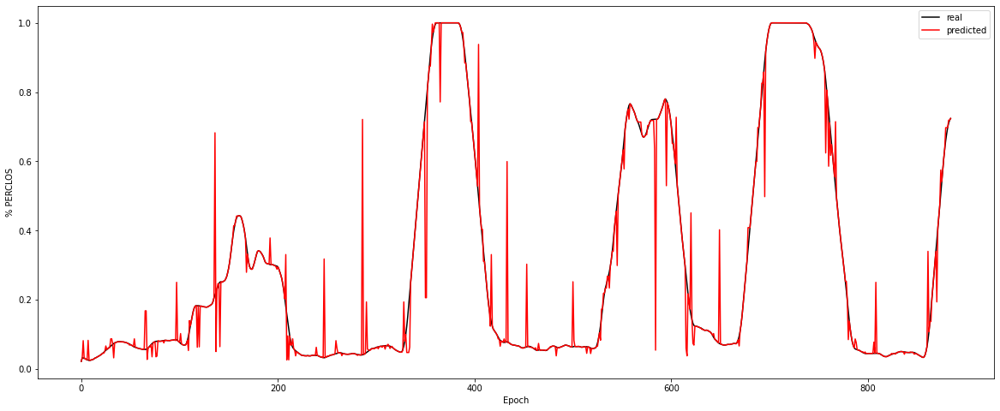

In [6]:
key = '21_20151016_noon'

csv_dict = {
    'sujeto': [],
    'rmse': [],
    'cc': [],
    "r2": []
}

for key in X_all:
    print(f"Experiment: {key}")
    model = DecisionTreeRegressor(random_state=42)

    space = dict()
    space['criterion'] = ['mse', 'friedman_mse', 'mae', 'poisson']
    space['splitter'] = ["best", "random"]
    space['max_depth'] = [None] + np.array(range(5, 100)).tolist()
    space['min_samples_split'] = [2]
    space['min_samples_leaf'] = [1]
    space['max_features'] = ["auto", "sqrt", "log2"]

    best_model, rmse, r2 = find_and_test_best_model_reg(X_all[key], y_all[key], model, space, cv=10,  n_iter=100)
    
    csv_dict['sujeto'].append(key)
    csv_dict['rmse'].append(rmse)
    csv_dict['cc'].append(np.sqrt(r2))
    csv_dict['r2'].append(r2)

    plot_results_reg(X_all[key], y_all[key], best_model)
# df = pd.DataFrame(csv_dict)
# df.to_csv('./results_reg/DT-PSD.csv', index=False) 

### PSD+EOG

Experiment: 1_20151124_noon_2
Best Model:
	Score: 0.9036
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 20, 'criterion': 'mse'}

Results with X_test:
	RMSE: 0.1093
	r^2: 0.8464


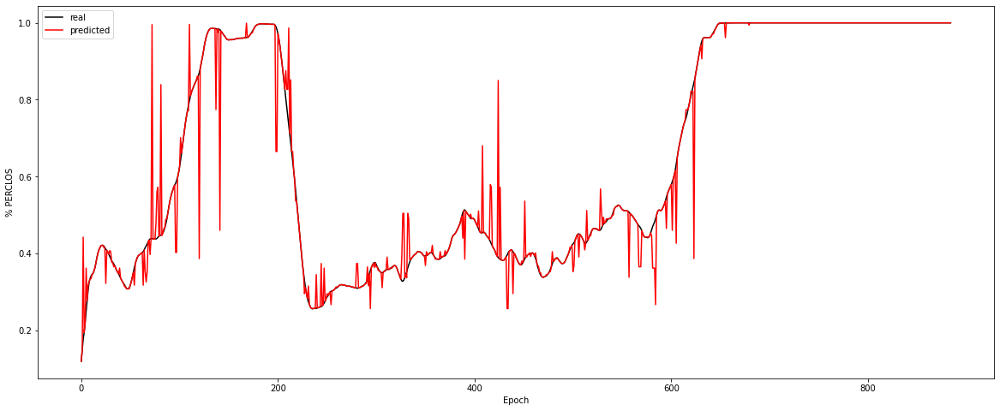

Experiment: 2_20151106_noon
Best Model:
	Score: 0.5477
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 76, 'criterion': 'mse'}

Results with X_test:
	RMSE: 0.1219
	r^2: 0.4513


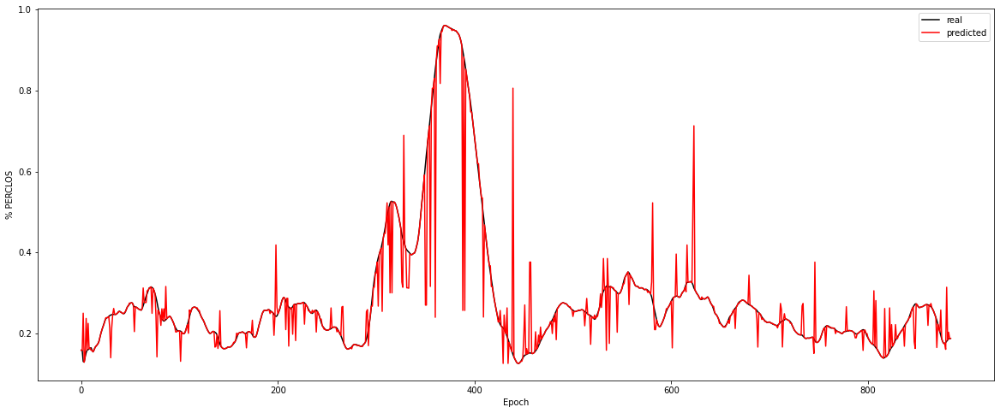

Experiment: 3_20151024_noon
Best Model:
	Score: 0.5999
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 21, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.0932
	r^2: 0.7312


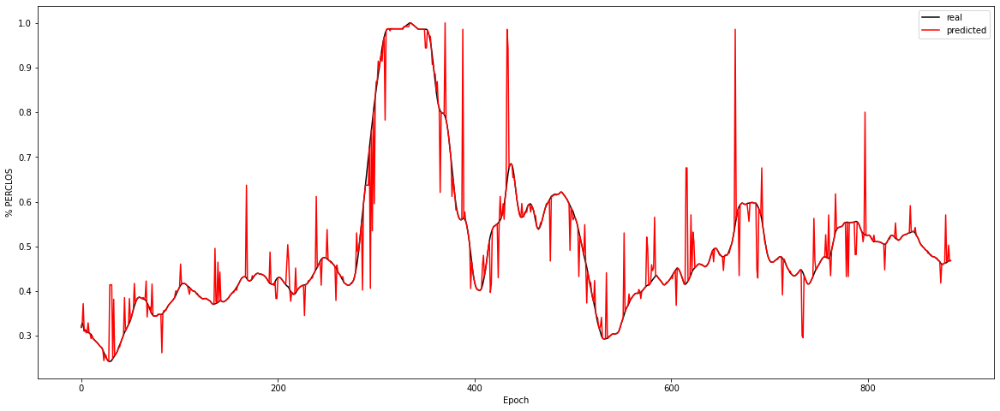

Experiment: 4_20151105_noon
Best Model:
	Score: 0.4877
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 5, 'criterion': 'mae'}

Results with X_test:
	RMSE: 0.1369
	r^2: 0.5214


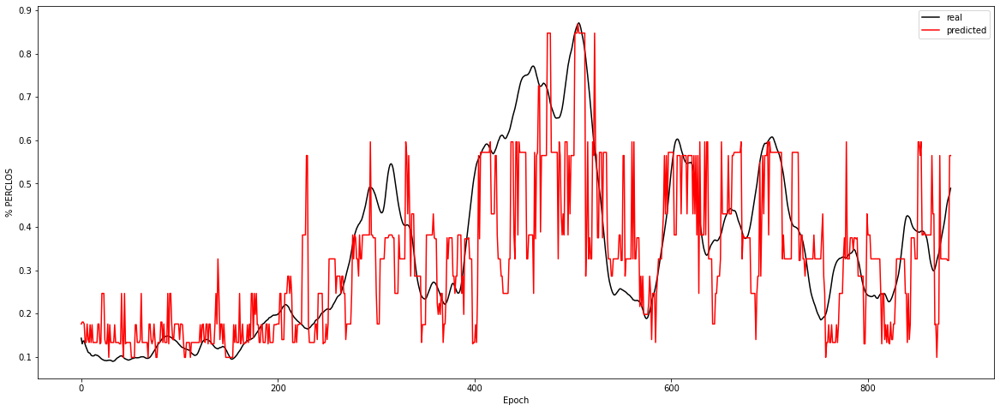

Experiment: 4_20151107_noon
Best Model:
	Score: 0.5655
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 7, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1594
	r^2: 0.5675


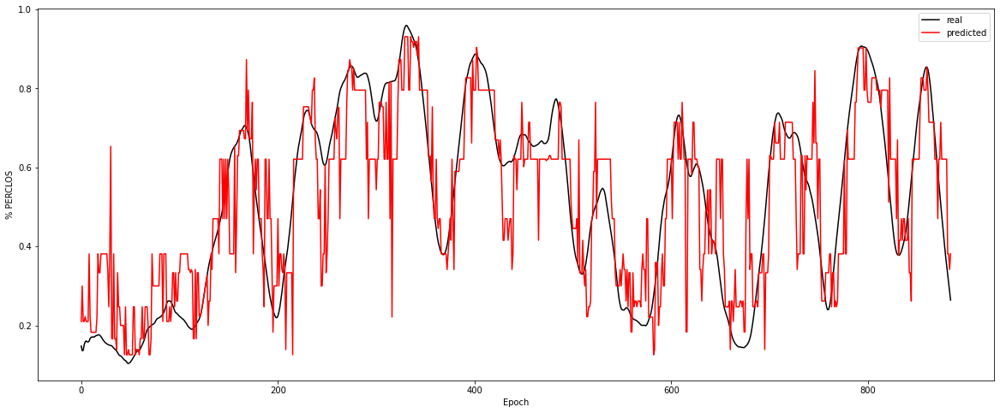

Experiment: 5_20141108_noon
Best Model:
	Score: 0.7521
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 7, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1833
	r^2: 0.6722


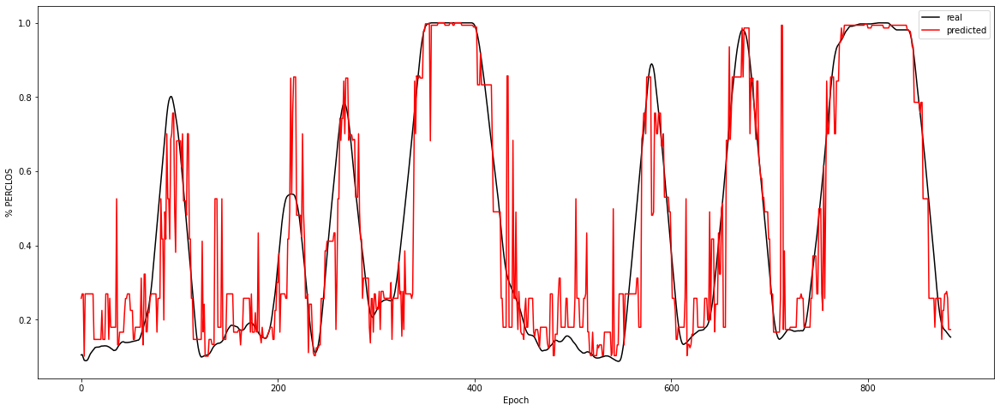

Experiment: 5_20151012_night
Best Model:
	Score: 0.7286
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 41, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1432
	r^2: 0.7282


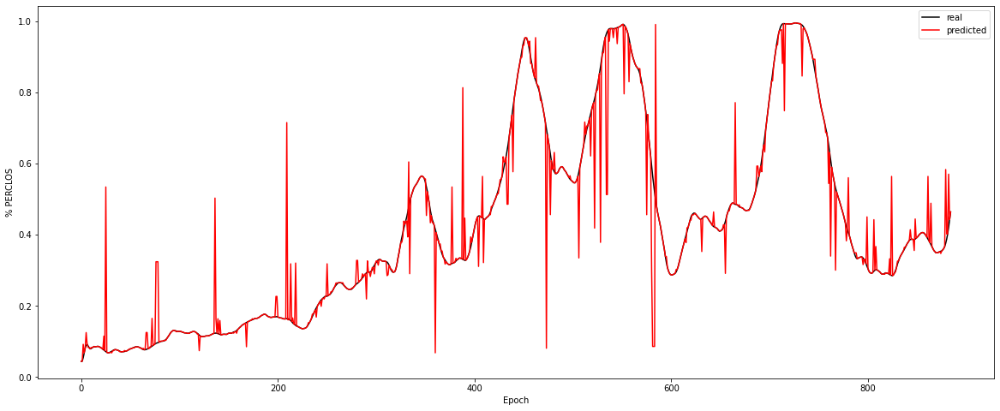

Experiment: 6_20151121_noon
Best Model:
	Score: 0.2395
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 41, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1012
	r^2: 0.3842


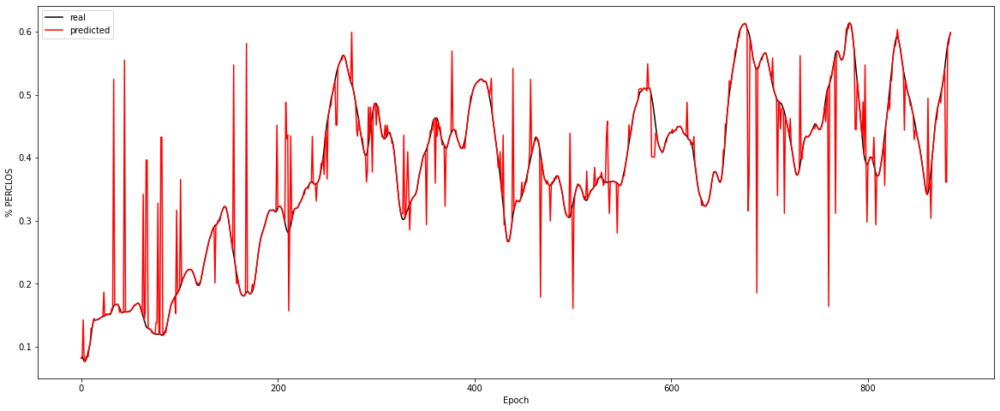

Experiment: 7_20151015_night
Best Model:
	Score: 0.6443
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 5, 'criterion': 'mae'}

Results with X_test:
	RMSE: 0.0641
	r^2: 0.7437


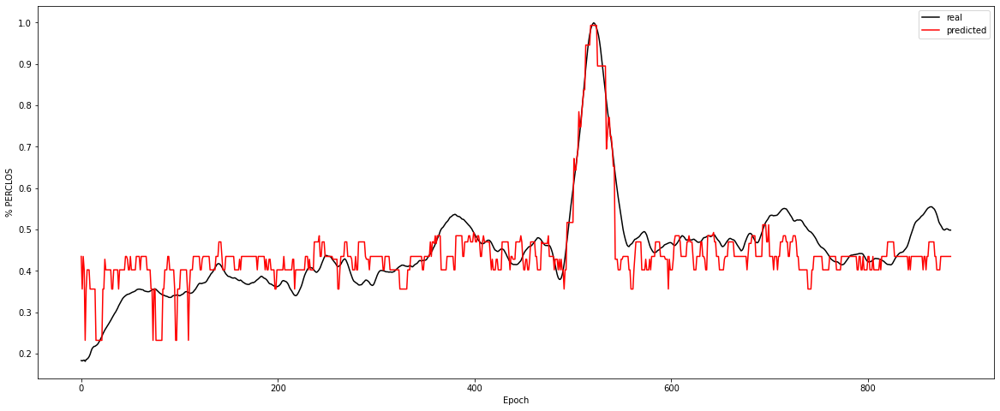

Experiment: 8_20151022_noon
Best Model:
	Score: 0.9020
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 41, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.0743
	r^2: 0.8932


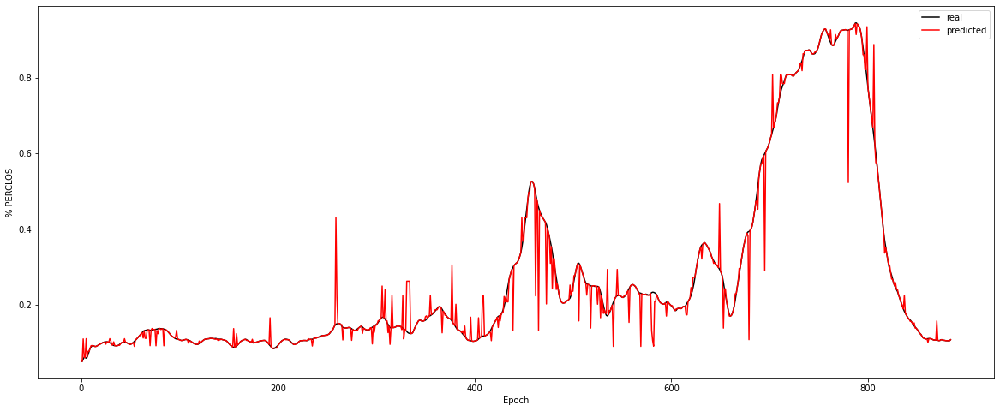

Experiment: 9_20151017_night
Best Model:
	Score: 0.4936
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 7, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.0822
	r^2: 0.5697


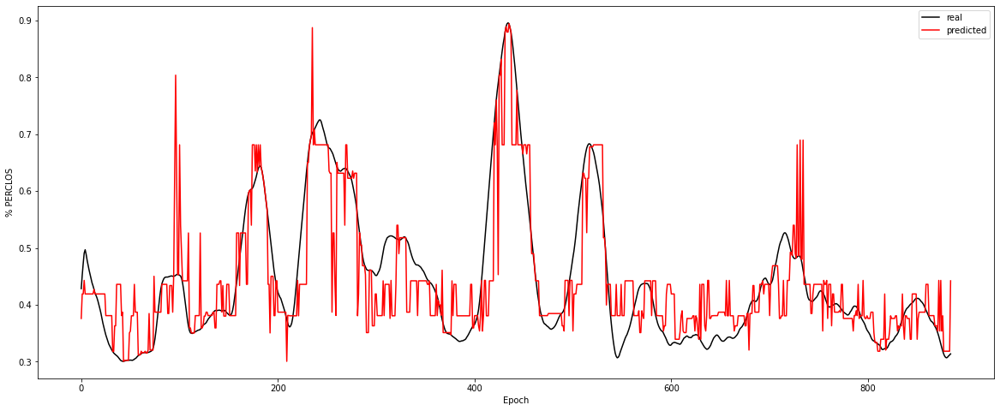

Experiment: 10_20151125_noon
Best Model:
	Score: 0.3593
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 76, 'criterion': 'mse'}

Results with X_test:
	RMSE: 0.1095
	r^2: 0.4448


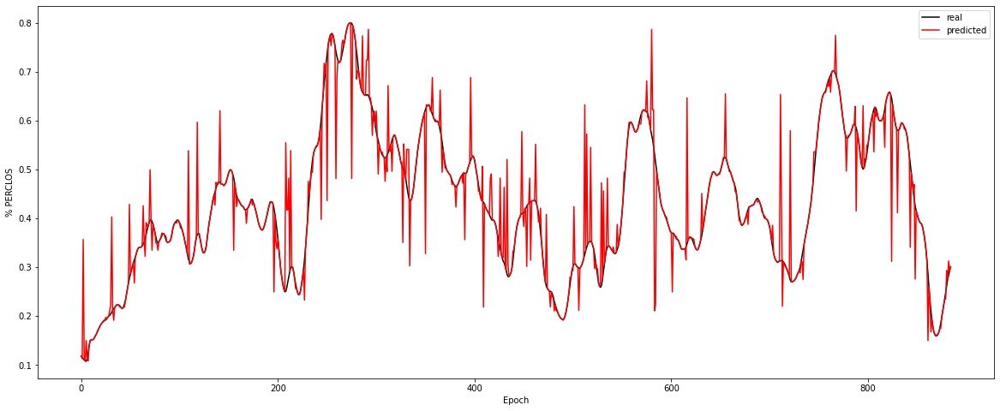

Experiment: 11_20151024_night
Best Model:
	Score: 0.4247
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 11, 'criterion': 'mse'}

Results with X_test:
	RMSE: 0.1044
	r^2: 0.3752


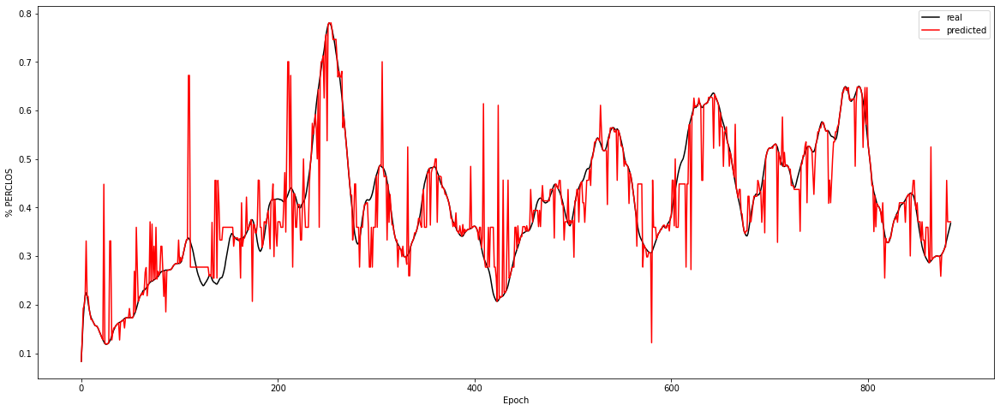

Experiment: 12_20150928_noon
Best Model:
	Score: 0.9049
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 7, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1300
	r^2: 0.8839


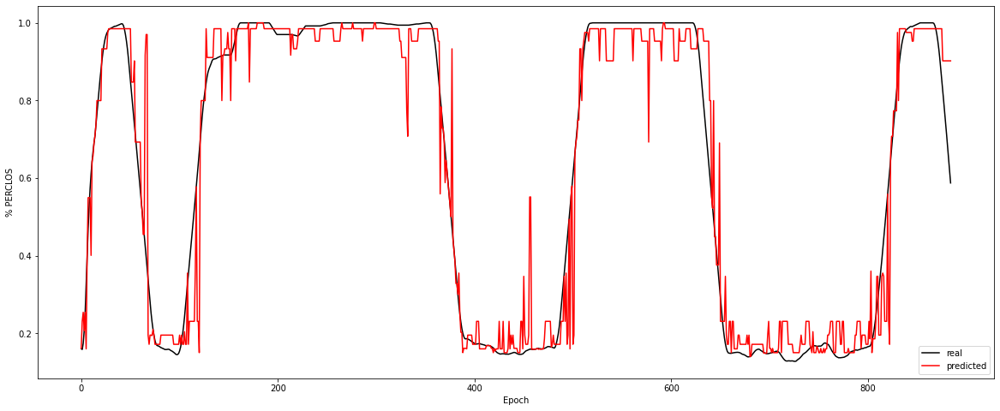

Experiment: 13_20150929_noon
Best Model:
	Score: 0.8400
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 49, 'criterion': 'mae'}

Results with X_test:
	RMSE: 0.0873
	r^2: 0.8093


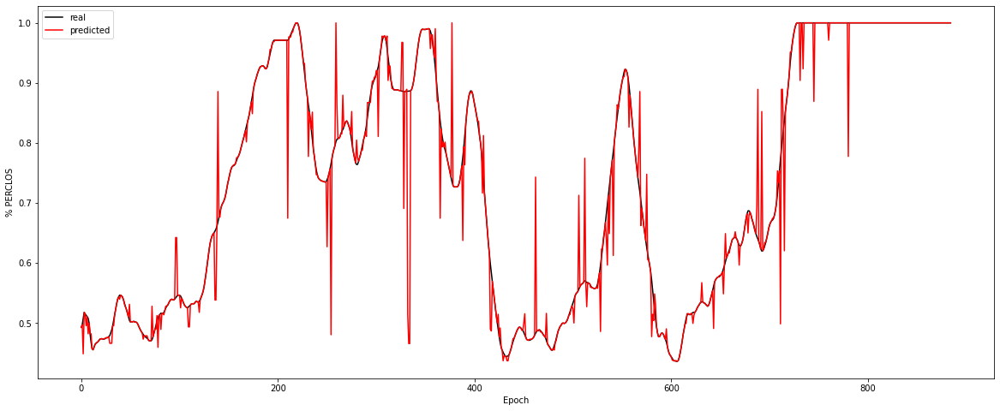

Experiment: 14_20151014_night
Best Model:
	Score: 0.6315
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 7, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1398
	r^2: 0.6318


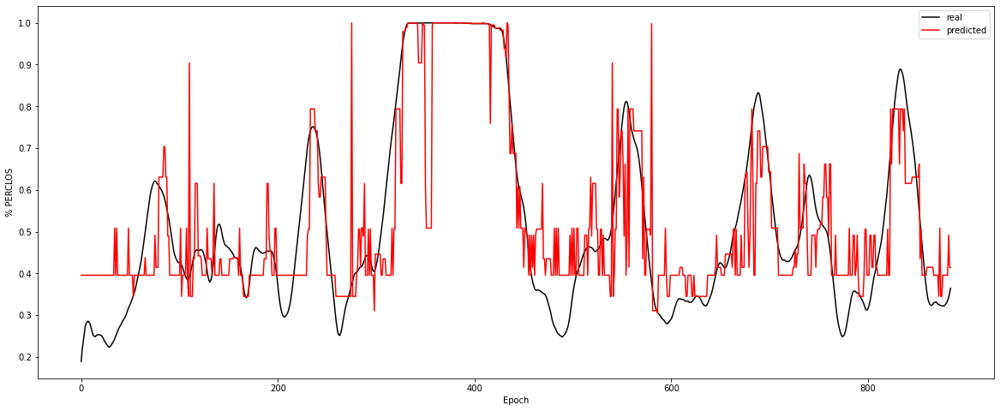

Experiment: 15_20151126_night
Best Model:
	Score: 0.8239
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 15, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.0790
	r^2: 0.7903


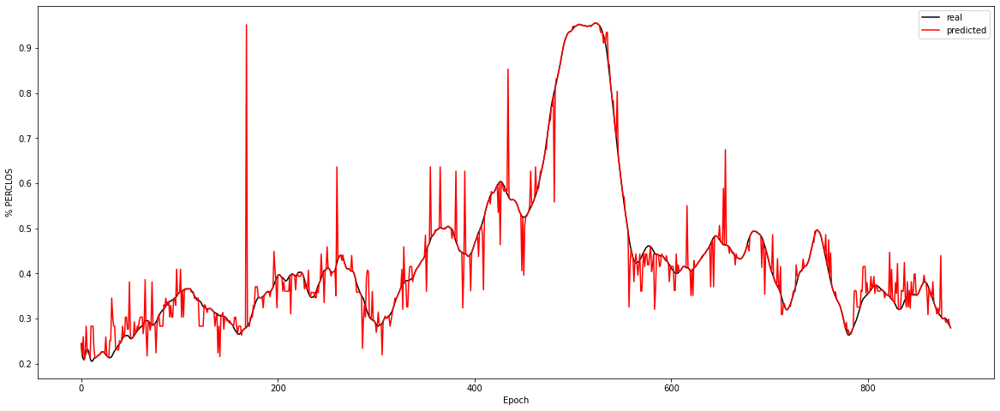

Experiment: 16_20151128_night
Best Model:
	Score: 0.8565
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 76, 'criterion': 'mse'}

Results with X_test:
	RMSE: 0.0938
	r^2: 0.9180


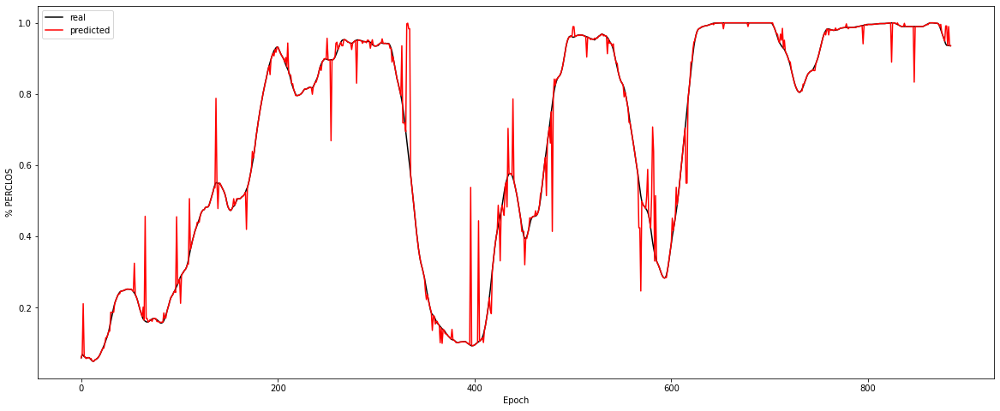

Experiment: 17_20150925_noon
Best Model:
	Score: 0.8164
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 15, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.0990
	r^2: 0.7385


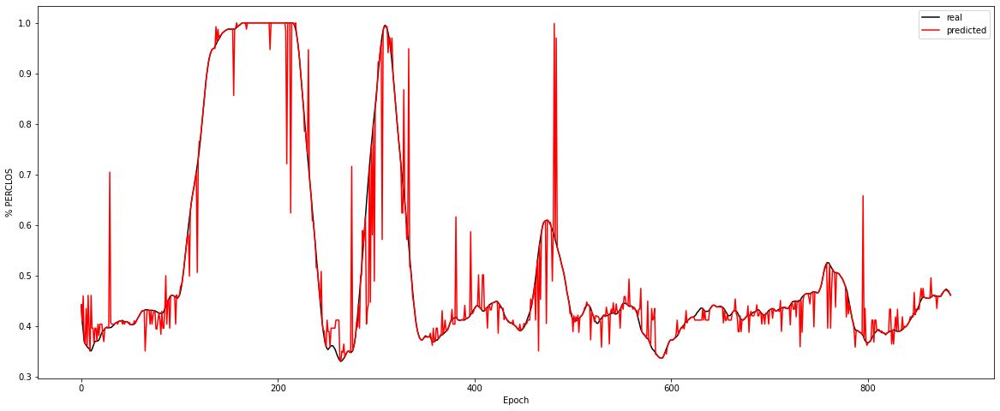

Experiment: 18_20150926_noon
Best Model:
	Score: 0.9205
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 21, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1202
	r^2: 0.8815


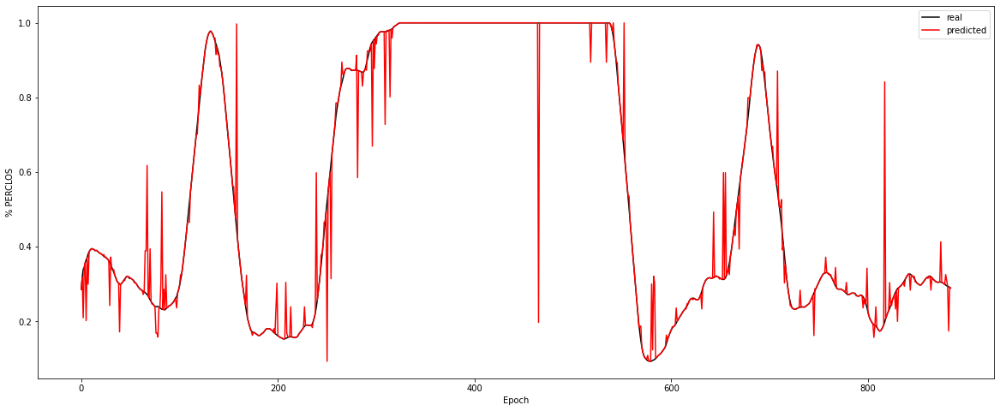

Experiment: 19_20151114_noon
Best Model:
	Score: 0.5518
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 7, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.0767
	r^2: 0.5640


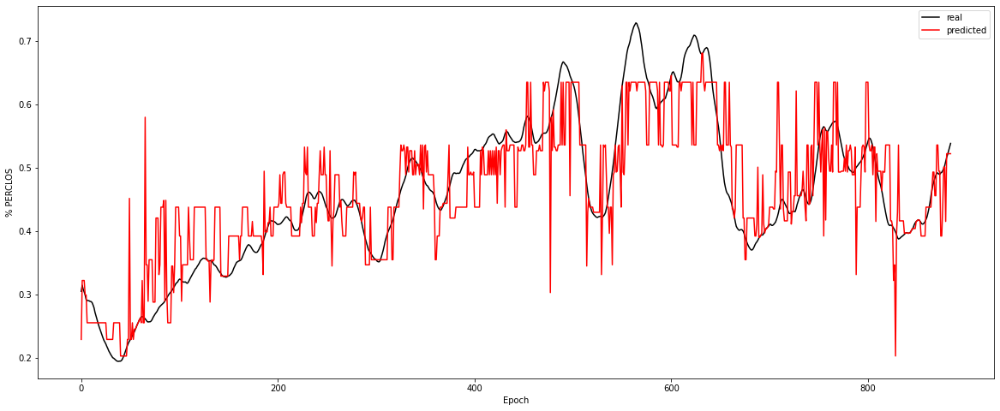

Experiment: 20_20151129_night
Best Model:
	Score: 0.5513
	Hyperparameters: {'splitter': 'best', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 21, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1674
	r^2: 0.7879


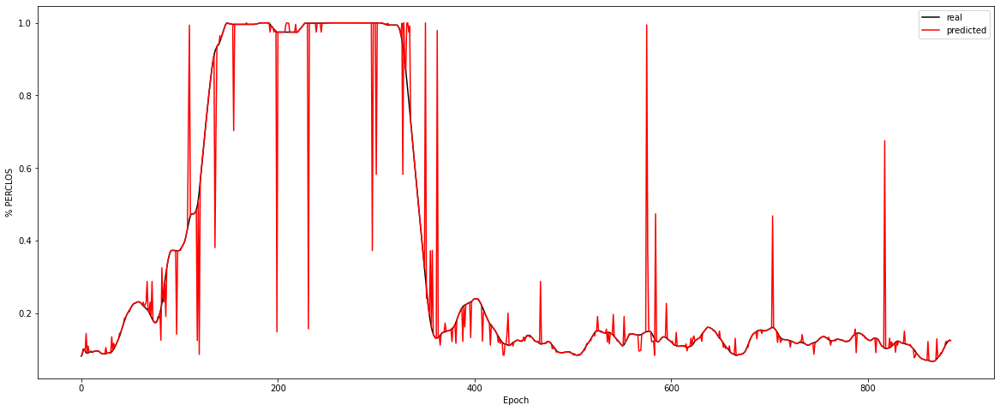

Experiment: 21_20151016_noon
Best Model:
	Score: 0.7244
	Hyperparameters: {'splitter': 'random', 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 15, 'criterion': 'friedman_mse'}

Results with X_test:
	RMSE: 0.1748
	r^2: 0.7104


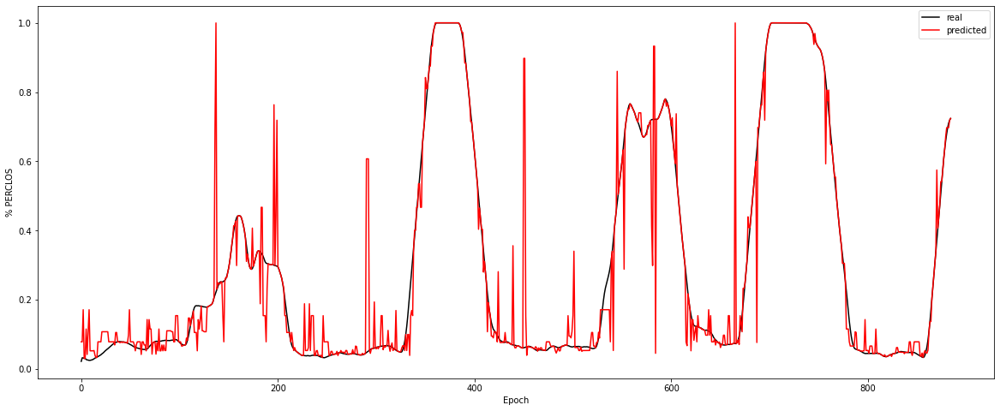

In [7]:
csv_dict = {
    'sujeto': [],
    'rmse': [],
    'cc': [],
    "r2": []
}

for key in X_all:
    print(f"Experiment: {key}")
    model = DecisionTreeRegressor(random_state=42)

    space = dict()
    space['criterion'] = ['mse', 'friedman_mse', 'mae', 'poisson']
    space['splitter'] = ["best", "random"]
    space['max_depth'] = [None] + np.array(range(5, 100)).tolist()
    space['min_samples_split'] = [2]
    space['min_samples_leaf'] = [1]
    space['max_features'] = ["auto", "sqrt", "log2"]

    best_model, rmse, r2 = find_and_test_best_model_reg(X_all_eog[key], y_all[key], model, space, cv=10,  n_iter=100)
    
    csv_dict['sujeto'].append(key)
    csv_dict['rmse'].append(rmse)
    csv_dict['cc'].append(np.sqrt(r2))
    csv_dict['r2'].append(r2)

    plot_results_reg(X_all_eog[key], y_all[key], best_model)
# df = pd.DataFrame(csv_dict)
# df.to_csv('./results_reg/DT-PSD+EOG.csv', index=False) 

# <a href="https://scikit-learn.org/stable/modules/gaussian_process.html#gaussian-process-regression-gpr">Gaussian Processes</a>

In [6]:
from sklearn.gaussian_process import GaussianProcessRegressor

### Mean, STD, var, p05, ...

Experiment: 1_20151124_noon_2
Best Model:
	Score: 0.1590
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2252
	r^2: 0.3476


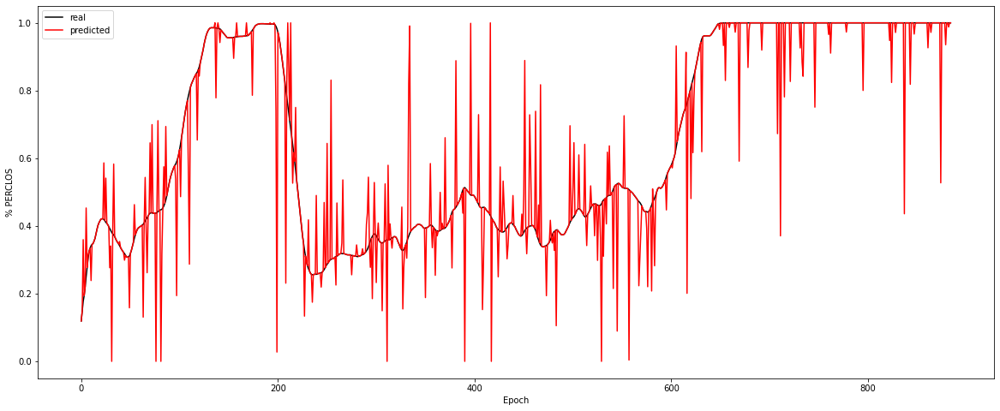

Experiment: 2_20151106_noon
Best Model:
	Score: -5.1690
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2351
	r^2: -1.0417


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in sqrt


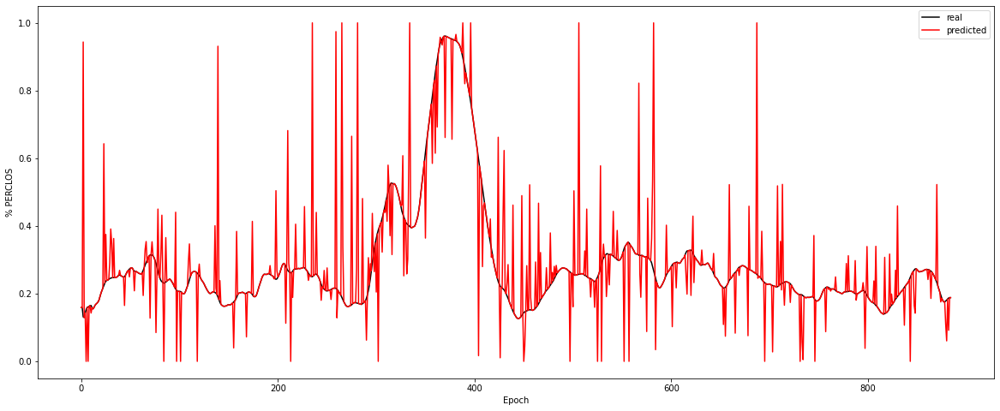

Experiment: 3_20151024_noon
Best Model:
	Score: 0.1272
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1512
	r^2: 0.2926


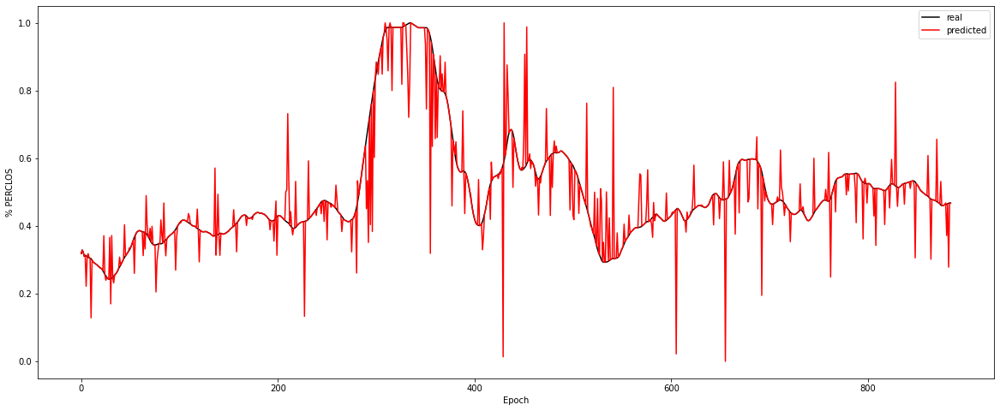

Experiment: 4_20151105_noon
Best Model:
	Score: -0.2111
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2121
	r^2: -0.1493


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in sqrt


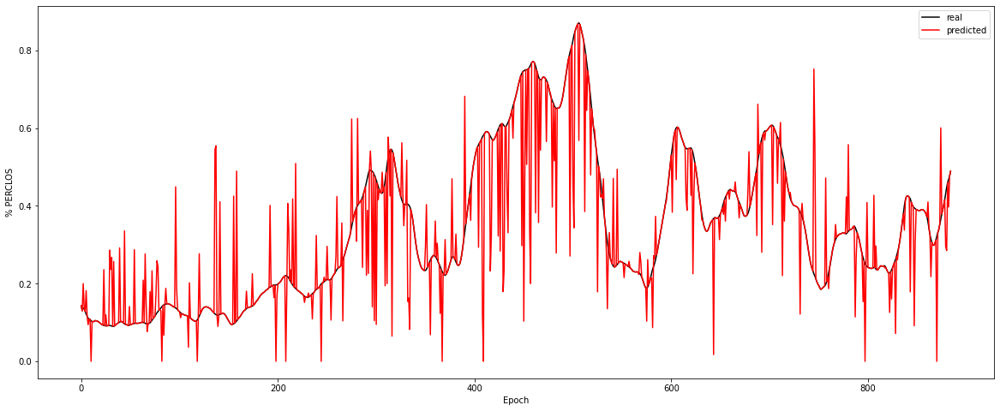

Experiment: 4_20151107_noon
Best Model:
	Score: -0.0259
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2376
	r^2: 0.0392


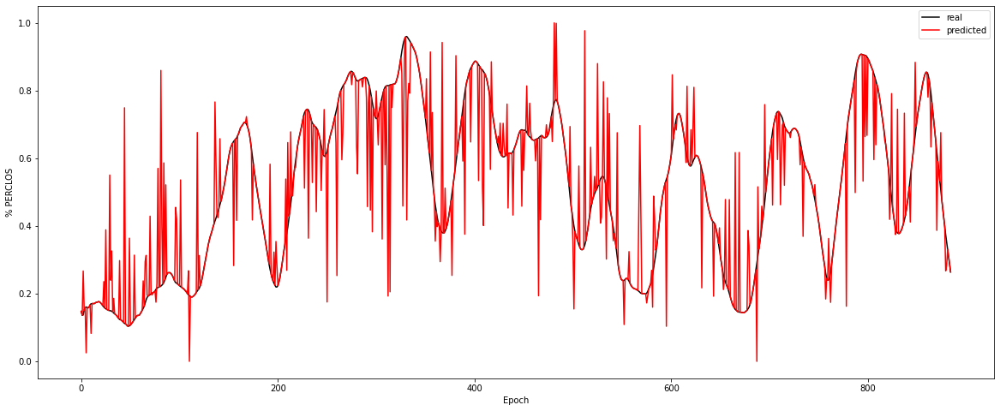

Experiment: 5_20141108_noon
Best Model:
	Score: 0.1305
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2680
	r^2: 0.2986


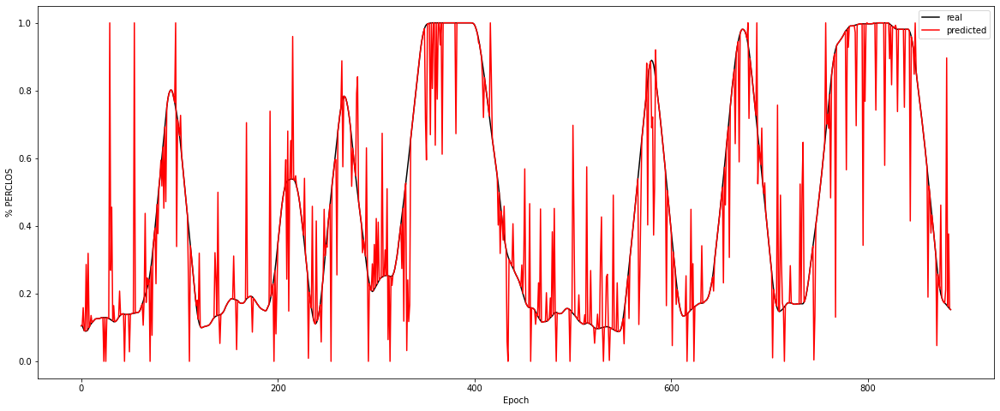

Experiment: 5_20151012_night
Best Model:
	Score: 0.4223
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1671
	r^2: 0.6298


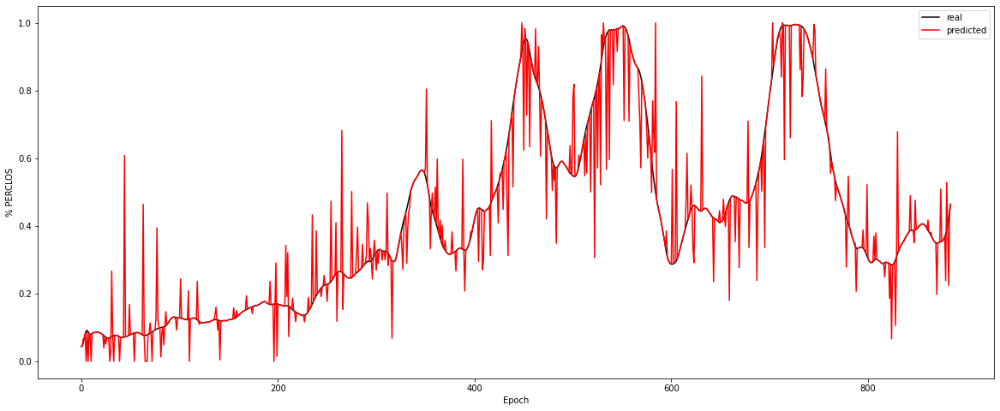

Experiment: 6_20151121_noon
Best Model:
	Score: -2.3798
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2021
	r^2: -1.4574


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in sqrt


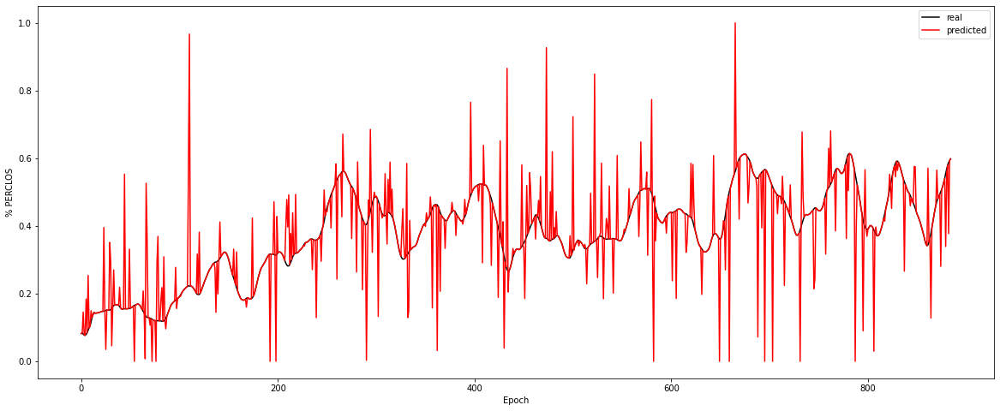

Experiment: 7_20151015_night
Best Model:
	Score: -0.7151
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1212
	r^2: 0.0838


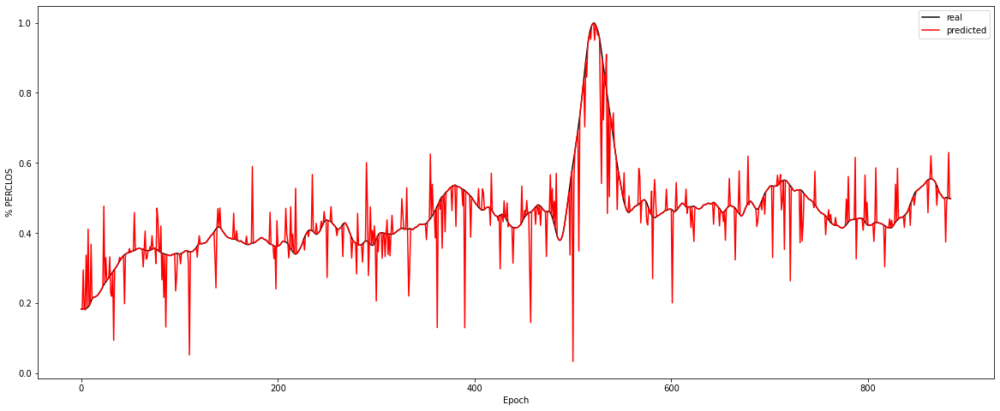

Experiment: 8_20151022_noon
Best Model:
	Score: 0.4786
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1463
	r^2: 0.5861


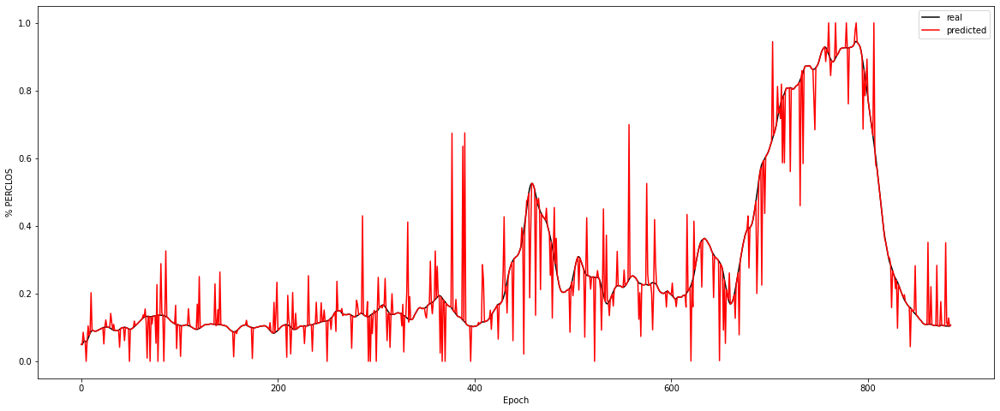

Experiment: 9_20151017_night
Best Model:
	Score: -3.9741
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2194
	r^2: -2.0679


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in sqrt


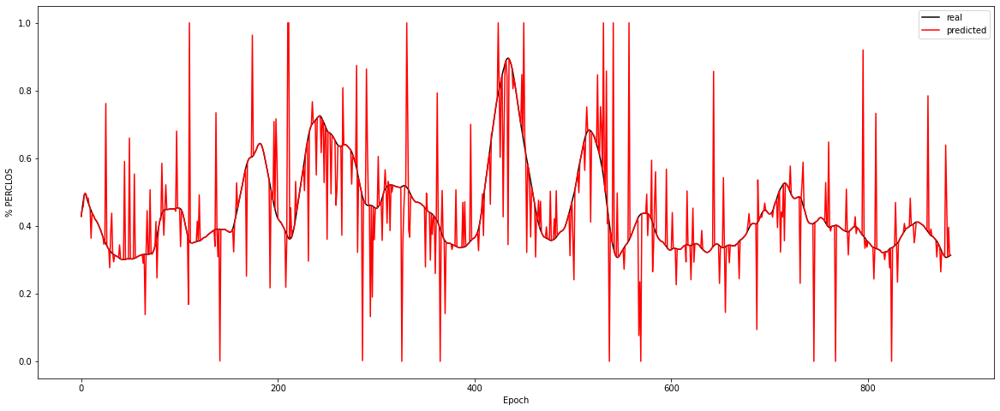

Experiment: 10_20151125_noon
Best Model:
	Score: -0.7821
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1675
	r^2: -0.2991


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in sqrt


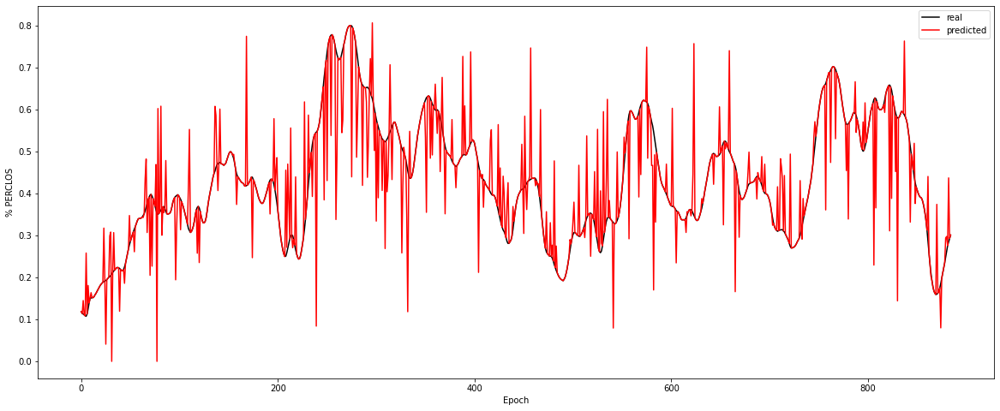

Experiment: 11_20151024_night
Best Model:
	Score: -0.4996
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1480
	r^2: -0.2548


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in sqrt


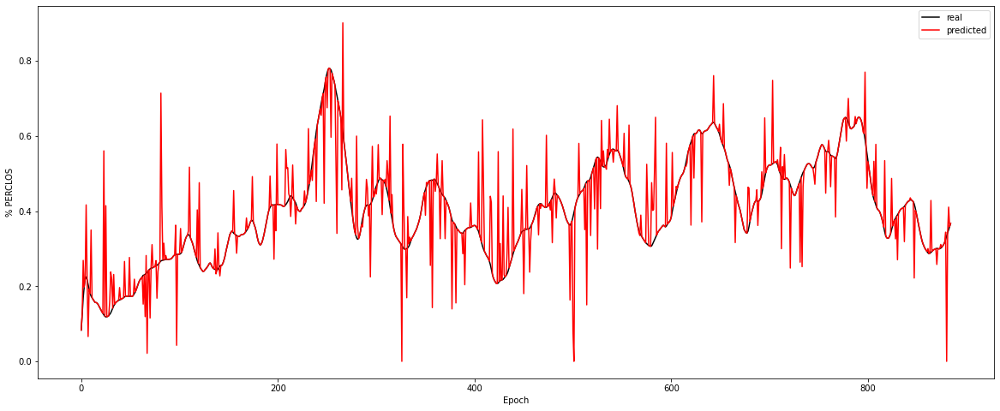

Experiment: 12_20150928_noon
Best Model:
	Score: 0.1721
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2791
	r^2: 0.4646


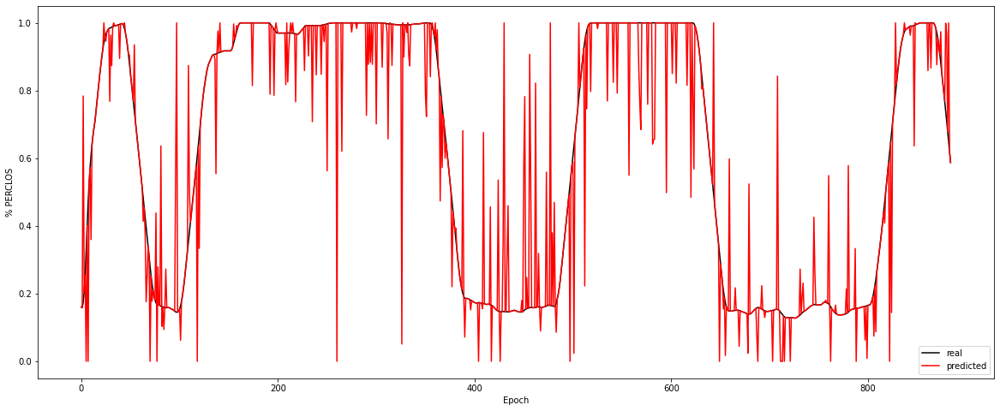

Experiment: 13_20150929_noon
Best Model:
	Score: 0.3217
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1349
	r^2: 0.5446


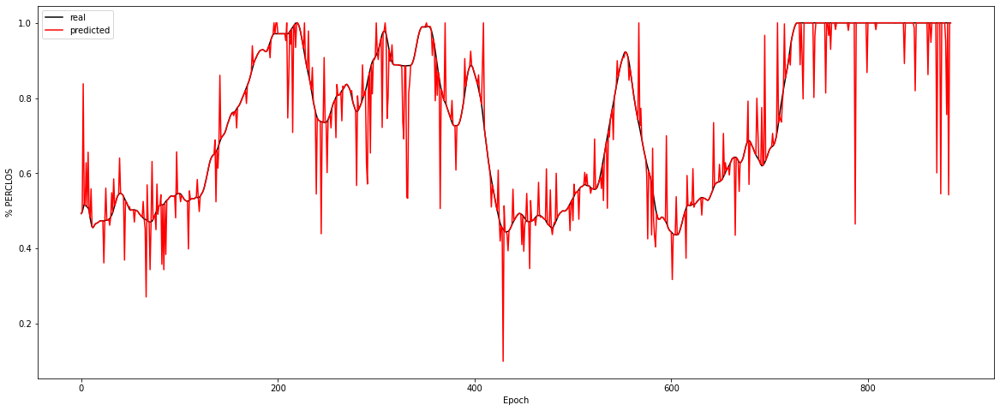

Experiment: 14_20151014_night
Best Model:
	Score: -1.9906
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.3047
	r^2: -0.7497


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in sqrt


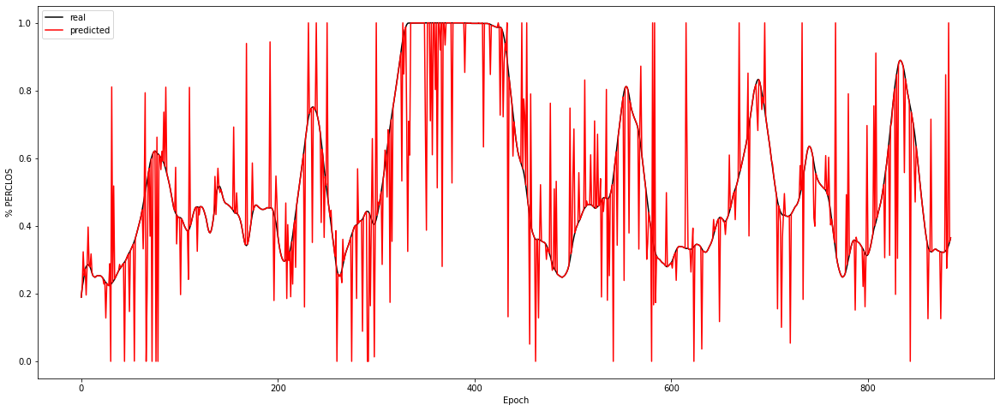

Experiment: 15_20151126_night
Best Model:
	Score: -0.9681
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2043
	r^2: -0.4019


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in sqrt


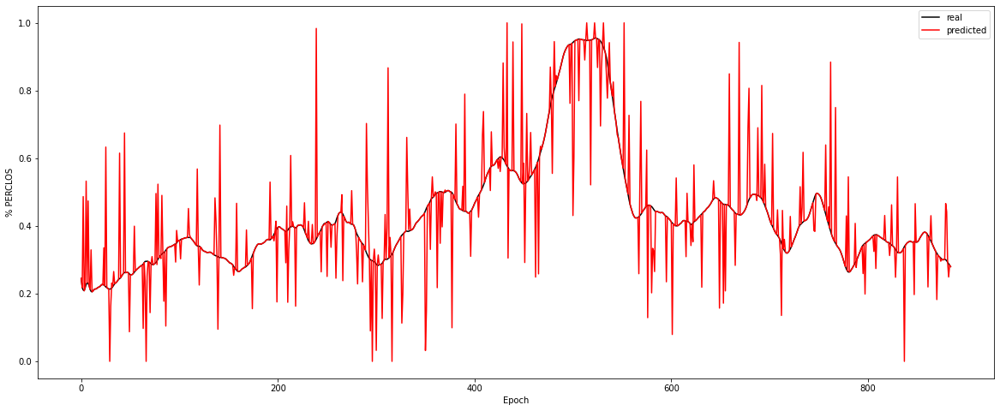

Experiment: 16_20151128_night
Best Model:
	Score: -0.1265
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2856
	r^2: 0.2400


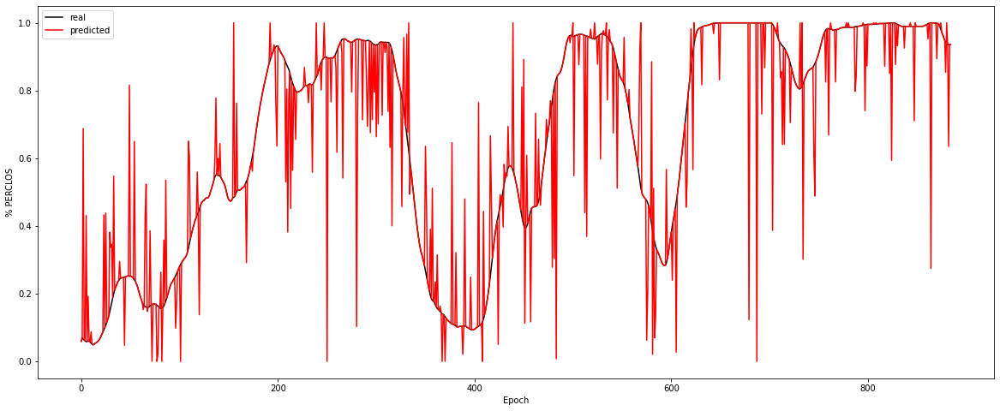

Experiment: 17_20150925_noon
Best Model:
	Score: 0.4071
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1668
	r^2: 0.2582


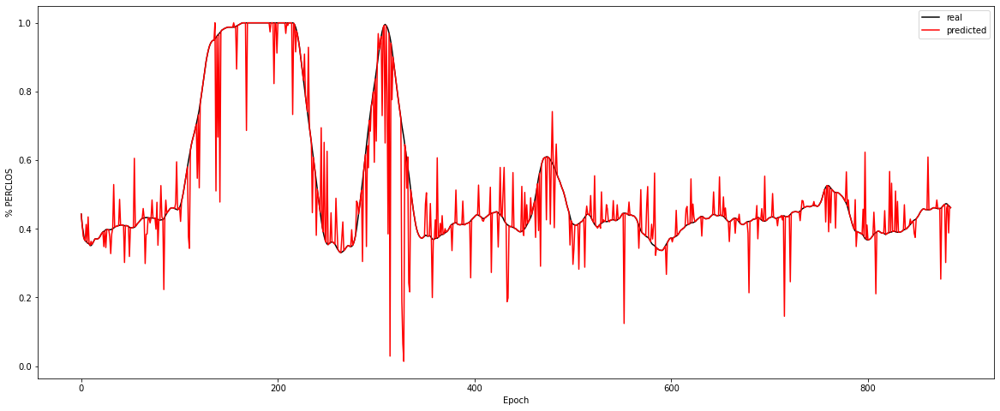

Experiment: 18_20150926_noon
Best Model:
	Score: 0.0832
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2689
	r^2: 0.4074


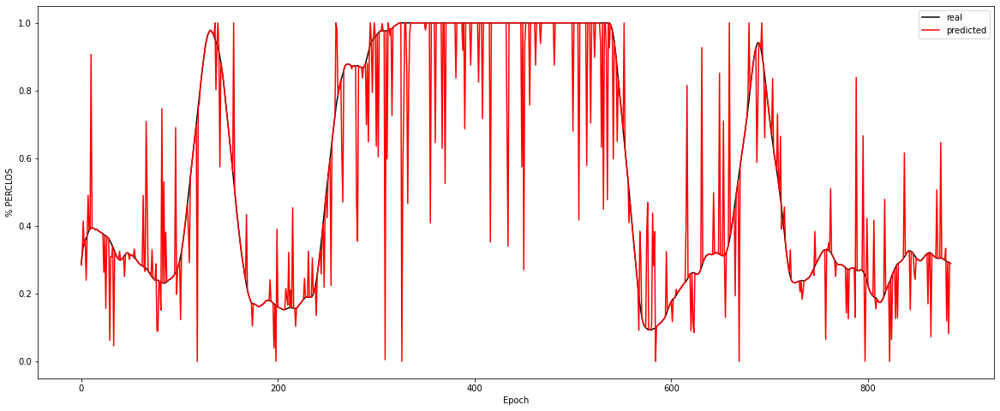

Experiment: 19_20151114_noon
Best Model:
	Score: 0.1274
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1016
	r^2: 0.2350


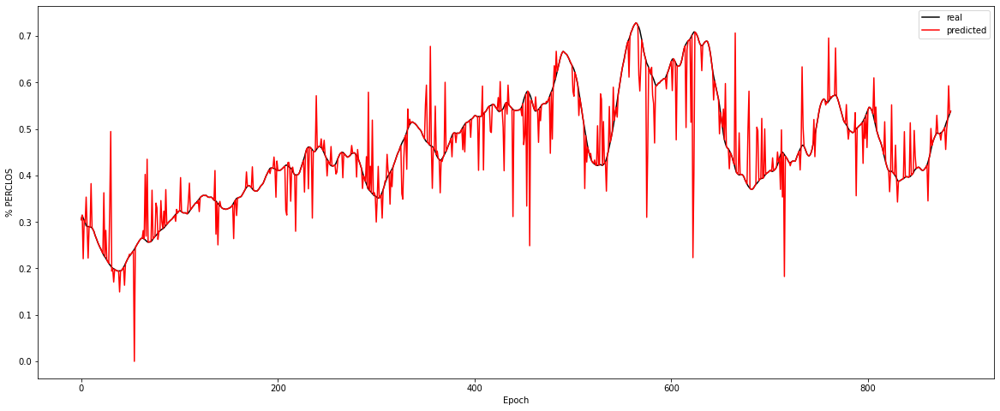

Experiment: 20_20151129_night
Best Model:
	Score: 0.5727
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2440
	r^2: 0.5494


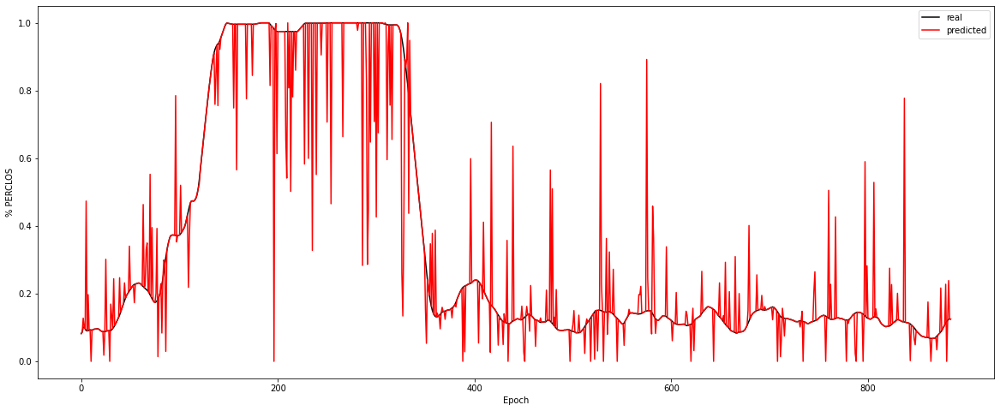

Experiment: 21_20151016_noon
Best Model:
	Score: -1.9315
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.3471
	r^2: -0.1413


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:32: RuntimeWarning: invalid value encountered in sqrt


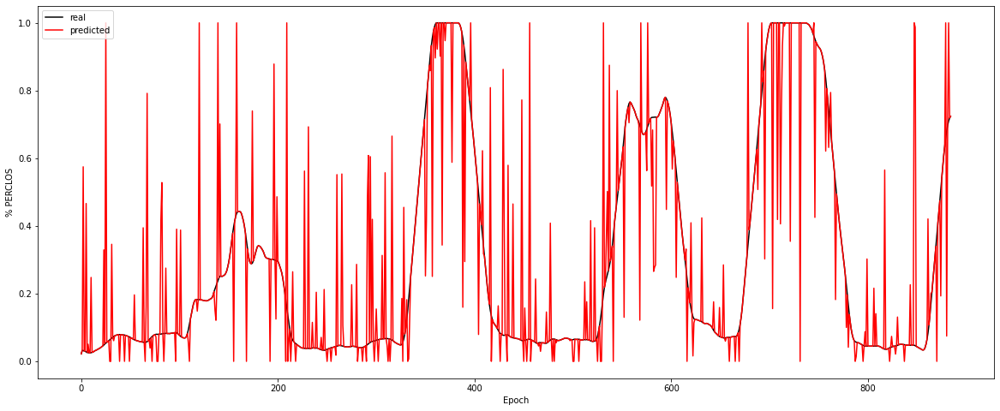

In [41]:
csv_dict = {
    'sujeto': [],
    'rmse': [],
    'cc': [],
    "r2": []
}

for file in features_files:
    
    X, y = read_features(f'./features/{file[:-4]}.csv')
    #X, y = read_features(file, features=[0, 1])

    scaler = MinMaxScaler(feature_range=(0, 1))
    X_minmax = scaler.fit_transform(X)

    scaler = StandardScaler()
    X_standar = scaler.fit_transform(X)

    key = file[:-4]
    print(f"Experiment: {key}")
    model = GaussianProcessRegressor(random_state=42)

    space = dict()
    #space['alpha'] = uniform(5e-9, 5e-11) #[5e-8, 1e-9, 5e-9, 1e-10, 5e-10, 1e-11, 5e-11]
    space['optimizer'] = ["fmin_l_bfgs_b"]
    space['n_restarts_optimizer'] = randint(0, 10)

    best_model, rmse, r2 = find_and_test_best_model_reg(X_minmax, y, model, space, cv=10,  n_iter=20)
    
    csv_dict['sujeto'].append(key)
    csv_dict['rmse'].append(rmse)
    csv_dict['cc'].append(np.sqrt(r2))
    csv_dict['r2'].append(r2)

    plot_results_reg(X_minmax, y, best_model)
    
df = pd.DataFrame(csv_dict)
df.to_csv('./results_reg/GP-EEG.csv', index=False)

### PSD

Experiment: 1_20151124_noon_2
Best Model:
	Score: 0.1785
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1004
	r^2: 0.8702


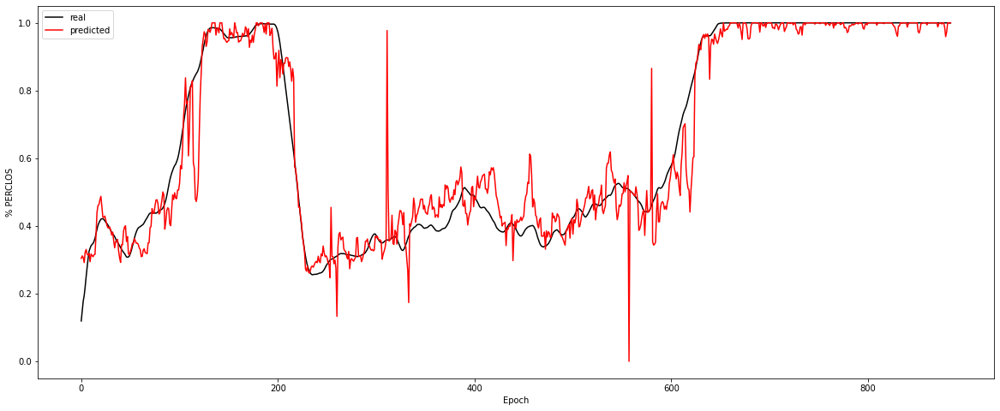

Experiment: 2_20151106_noon
Best Model:
	Score: -789.3031
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1257
	r^2: 0.4170


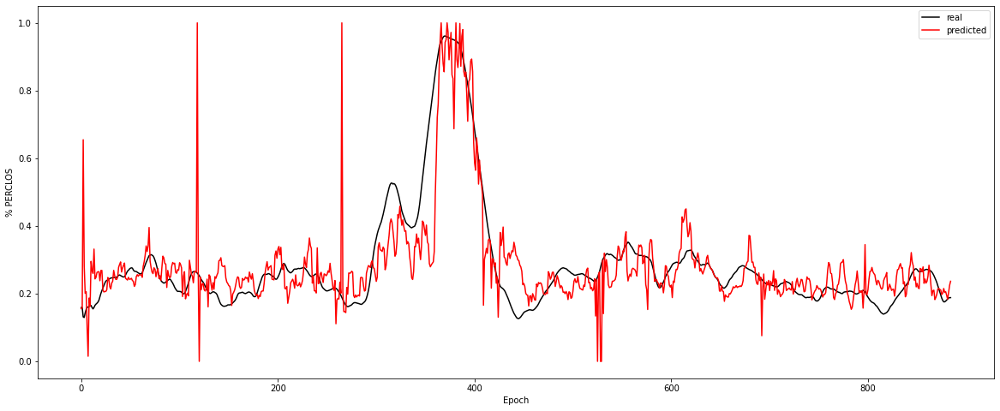

Experiment: 3_20151024_noon
Best Model:
	Score: -36.7857
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1000
	r^2: 0.6907


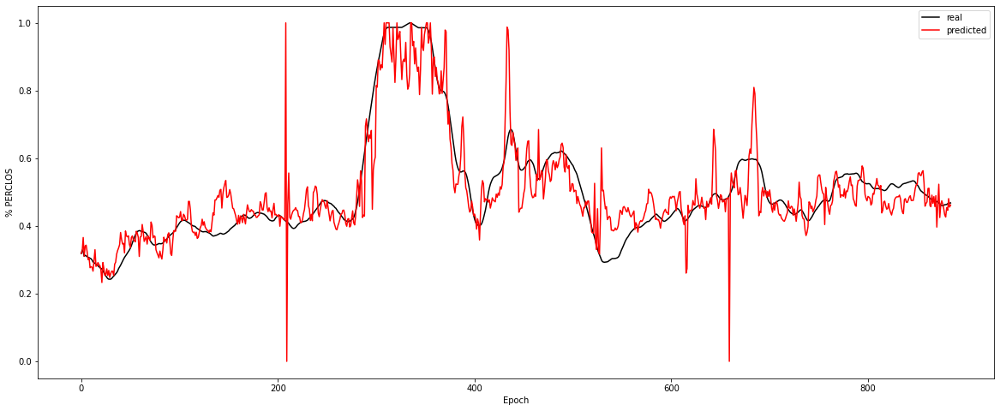

Experiment: 4_20151105_noon
Best Model:
	Score: -227.8924
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1600
	r^2: 0.3461


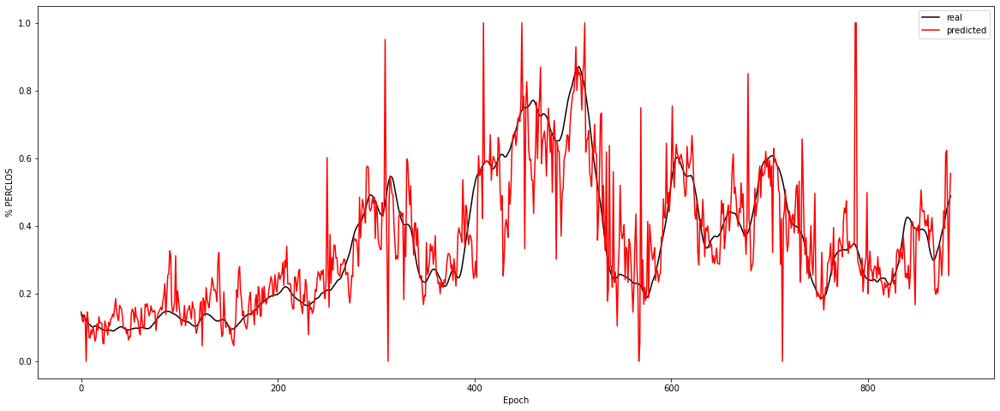

Experiment: 4_20151107_noon
Best Model:
	Score: -49.3916
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1817
	r^2: 0.4379


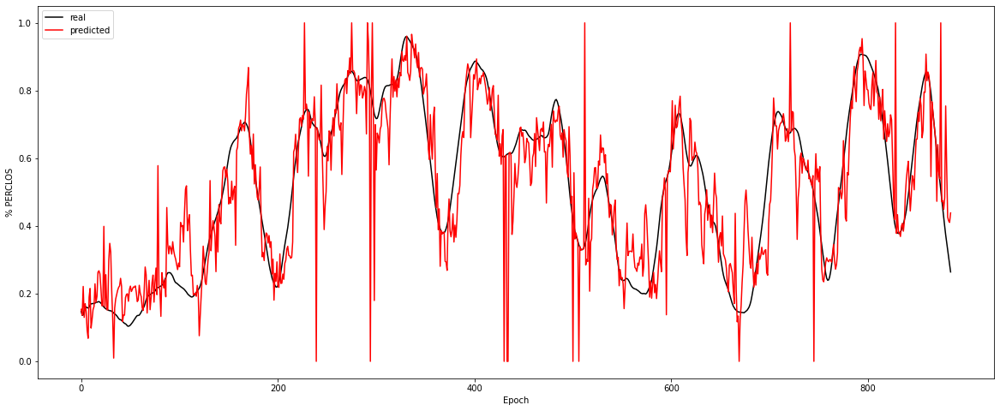

Experiment: 5_20141108_noon
Best Model:
	Score: -13.4136
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1669
	r^2: 0.7282


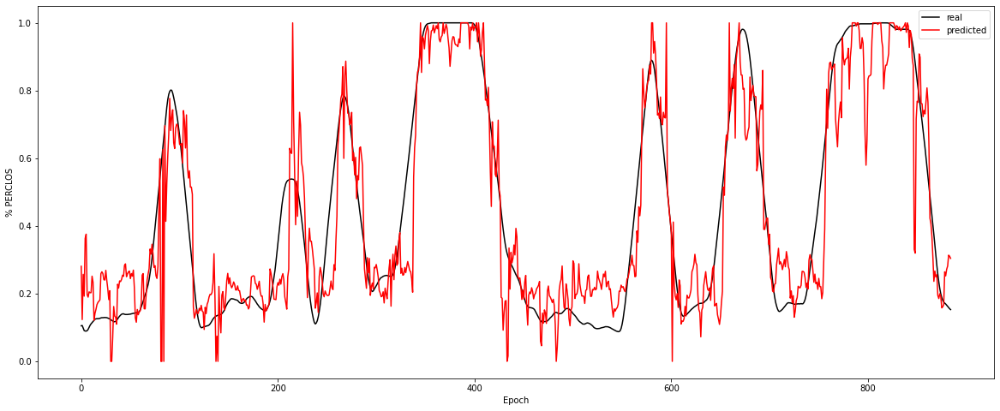

Experiment: 5_20151012_night
Best Model:
	Score: -7.6547
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1308
	r^2: 0.7732


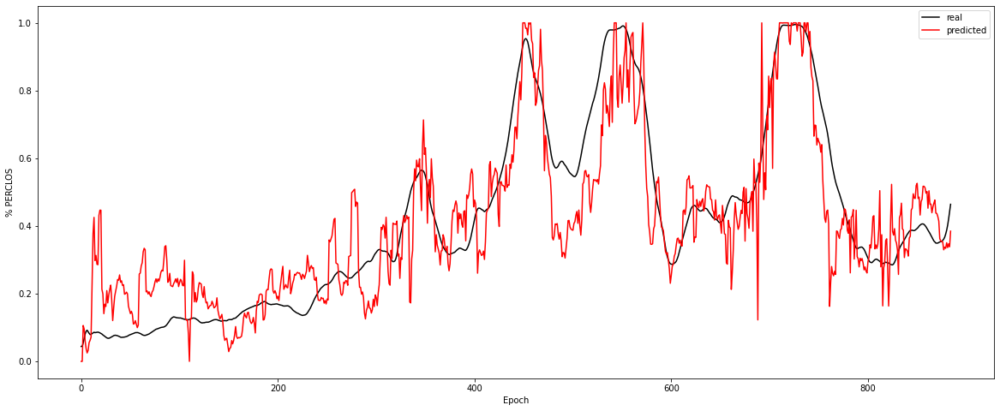

Experiment: 6_20151121_noon
Best Model:
	Score: -6.3658
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1236
	r^2: 0.0814


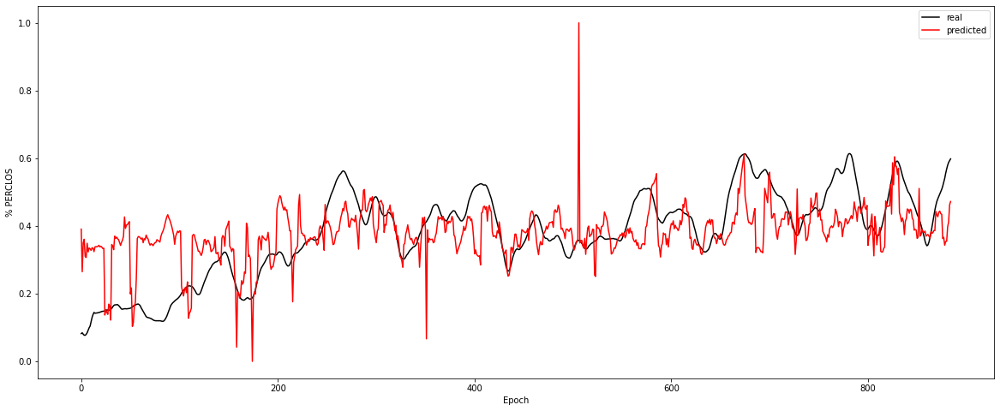

Experiment: 7_20151015_night
Best Model:
	Score: -246.4448
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1180
	r^2: 0.1318


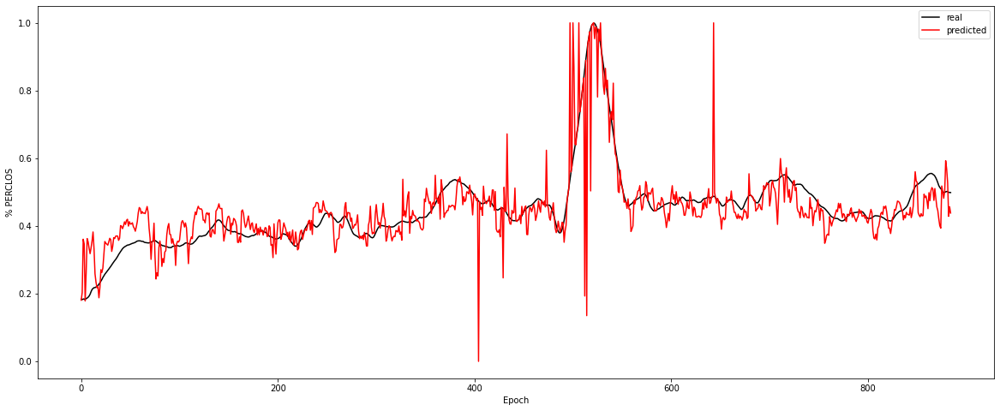

Experiment: 8_20151022_noon
Best Model:
	Score: -37.6008
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1807
	r^2: 0.3683


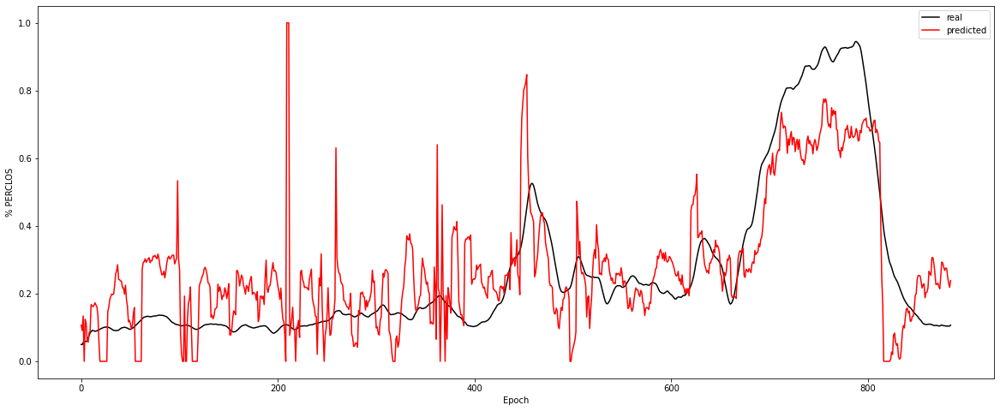

Experiment: 9_20151017_night
Best Model:
	Score: -292.3153
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1224
	r^2: 0.0452


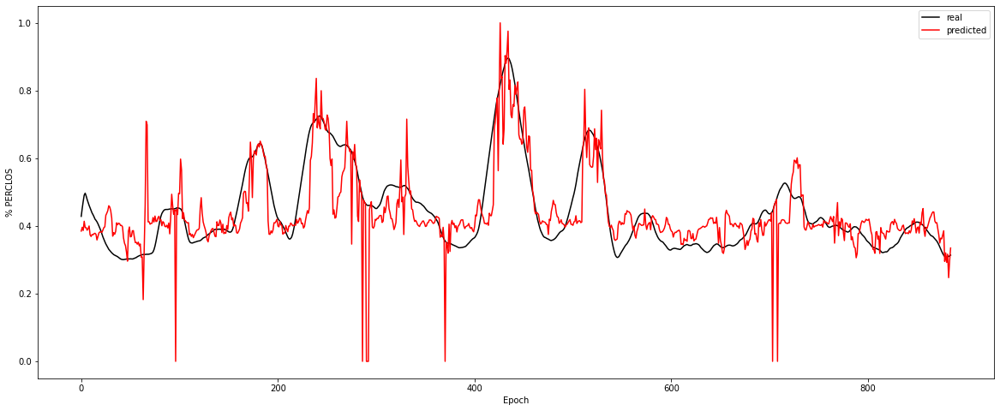

Experiment: 10_20151125_noon
Best Model:
	Score: -45.7412
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1185
	r^2: 0.3494


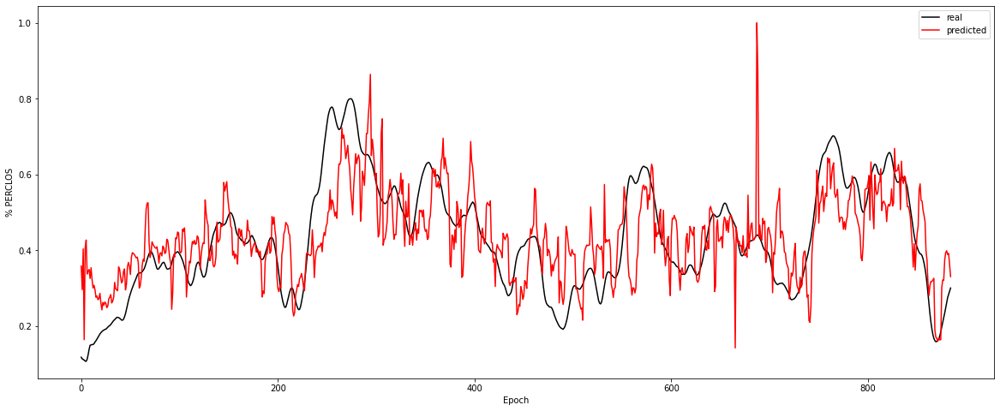

Experiment: 11_20151024_night
Best Model:
	Score: -2345.4390
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.0993
	r^2: 0.4352


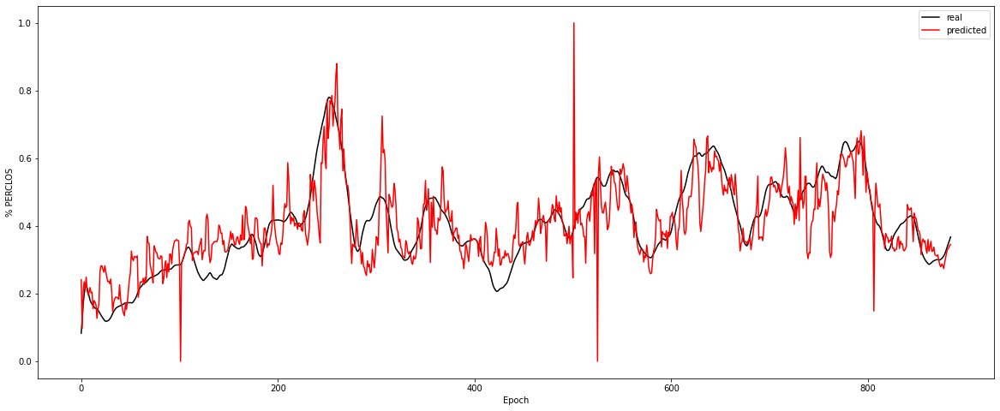

Experiment: 12_20150928_noon
Best Model:
	Score: -7.6414
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1601
	r^2: 0.8237


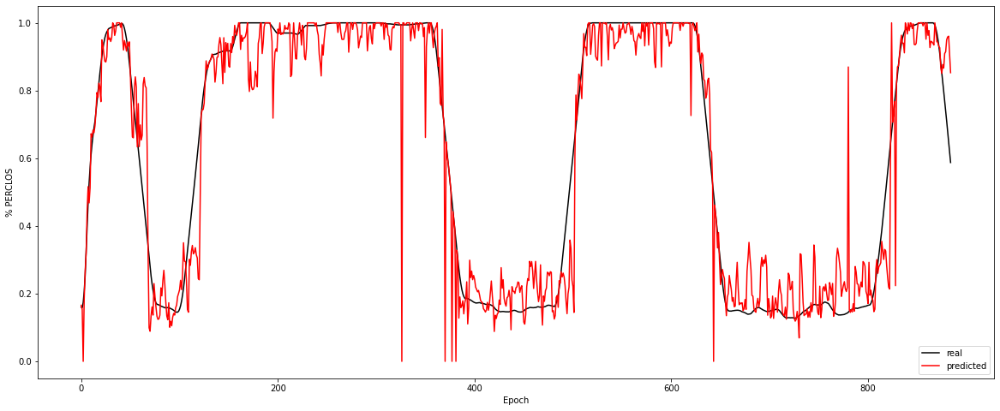

Experiment: 13_20150929_noon
Best Model:
	Score: -28.4117
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.0919
	r^2: 0.7890


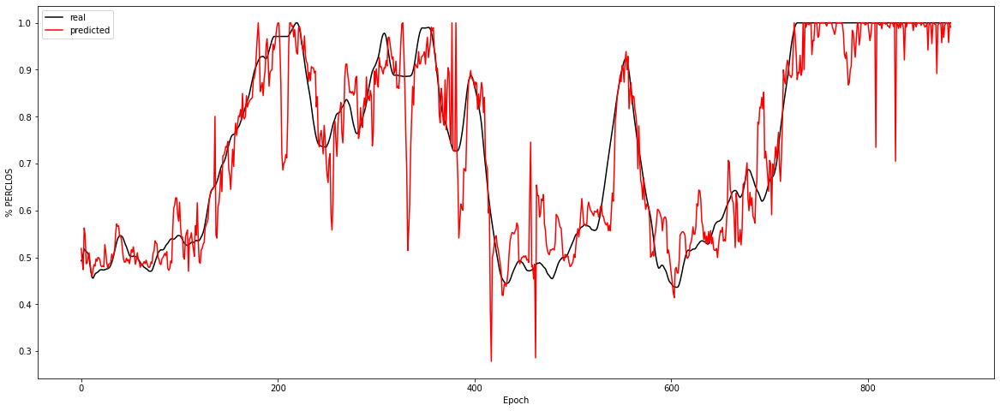

Experiment: 14_20151014_night
Best Model:
	Score: -8477.6457
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1879
	r^2: 0.3347


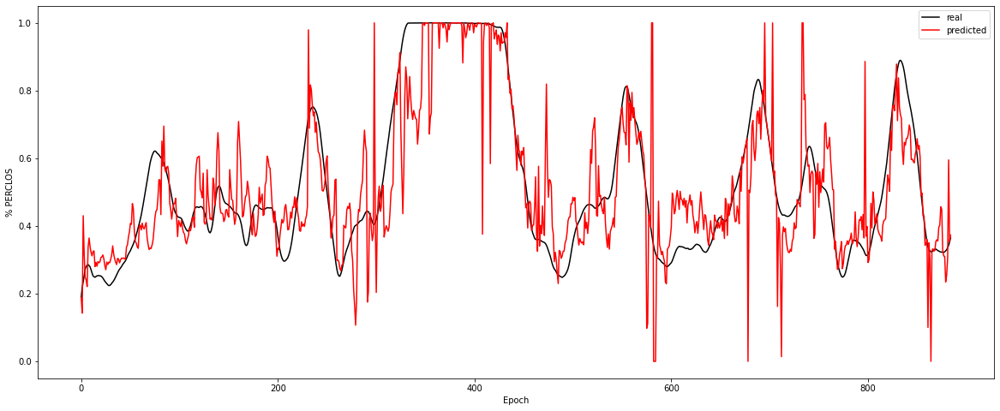

Experiment: 15_20151126_night
Best Model:
	Score: -16.0654
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.0729
	r^2: 0.8213


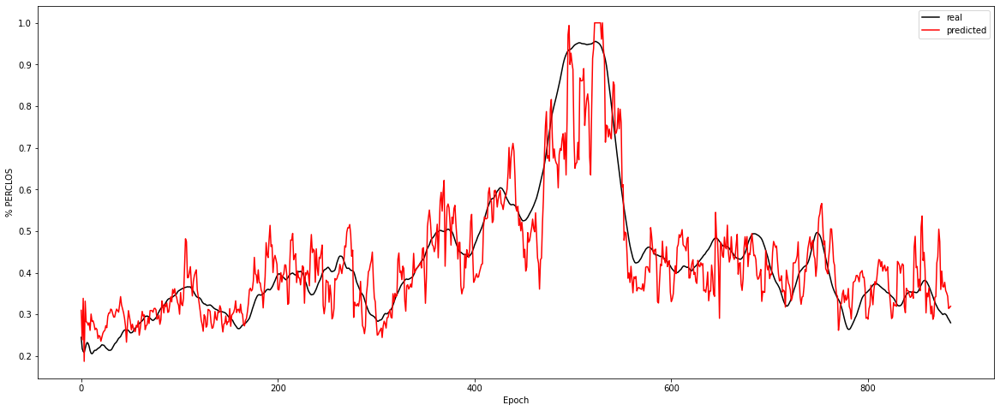

Experiment: 16_20151128_night
Best Model:
	Score: -0.2652
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1173
	r^2: 0.8717


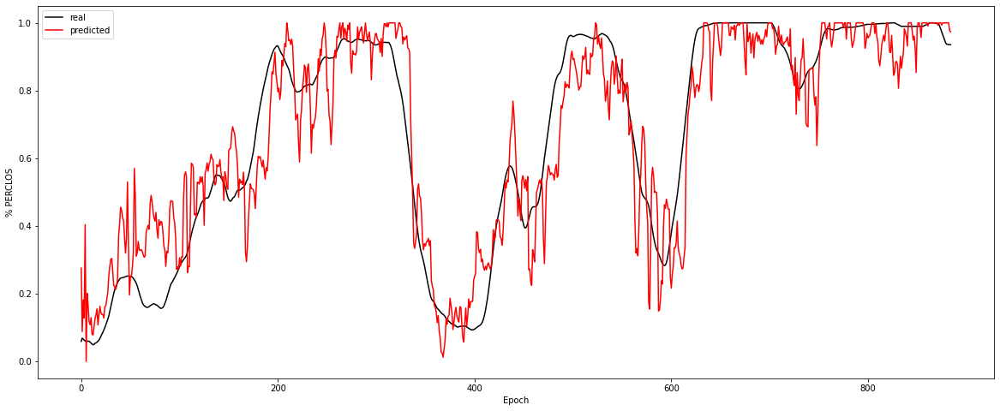

Experiment: 17_20150925_noon
Best Model:
	Score: -1183.5343
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1062
	r^2: 0.6992


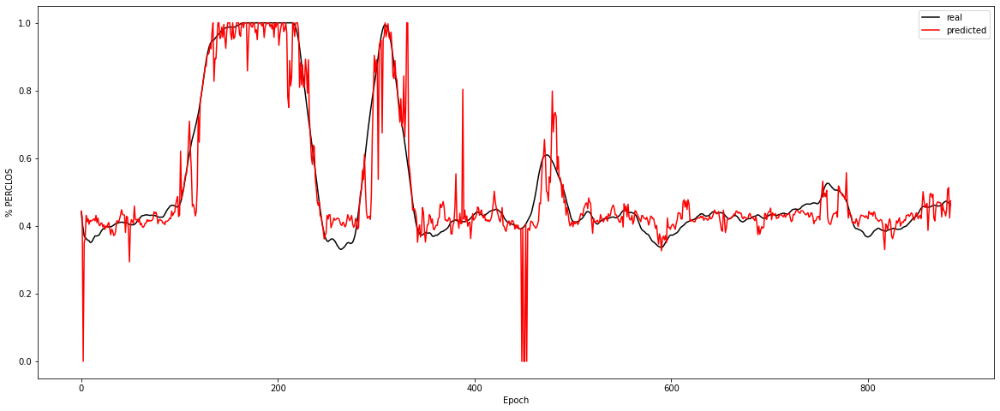

Experiment: 18_20150926_noon
Best Model:
	Score: -112729.7046
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1358
	r^2: 0.8490


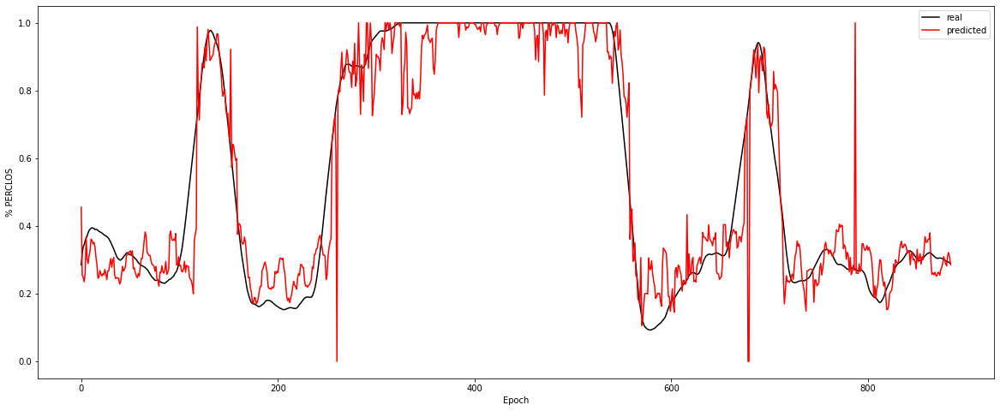

Experiment: 19_20151114_noon
Best Model:
	Score: -8.3987
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.0790
	r^2: 0.5376


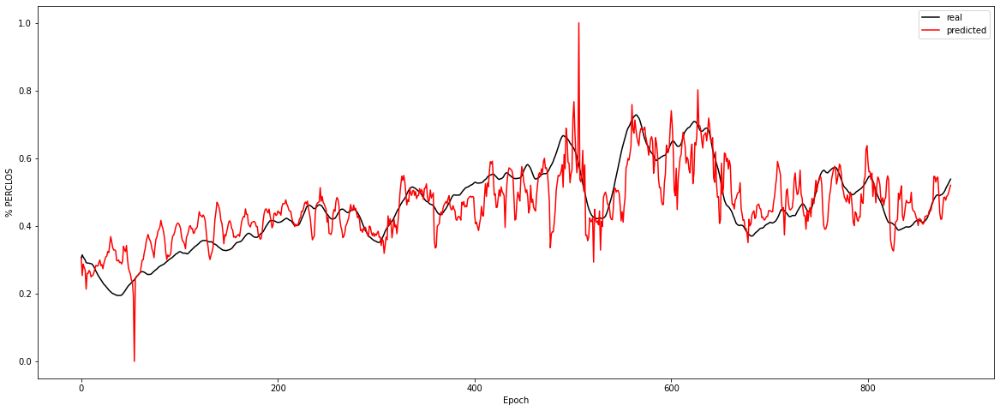

Experiment: 20_20151129_night
Best Model:
	Score: -72.9552
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2424
	r^2: 0.5552


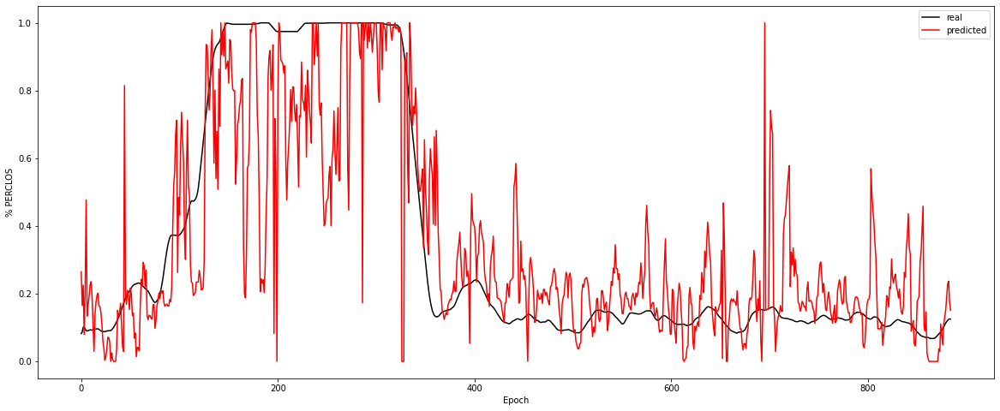

Experiment: 21_20151016_noon
Best Model:
	Score: -131.4062
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1499
	r^2: 0.7871


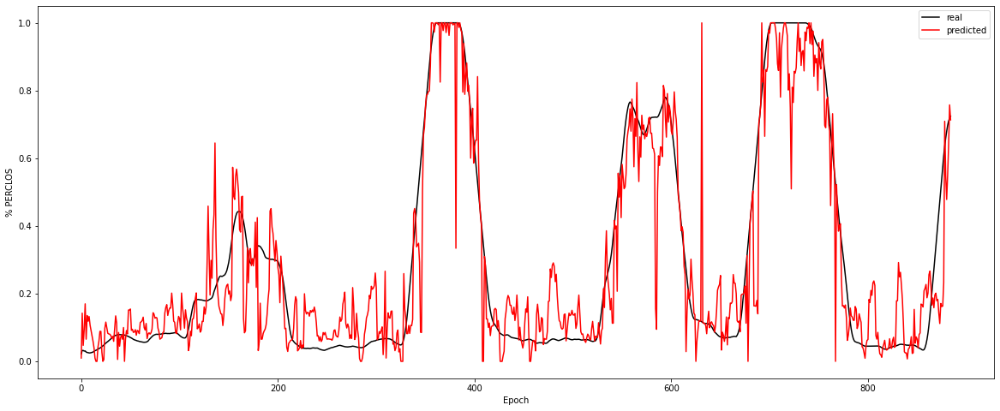

In [42]:
key = '21_20151016_noon'

csv_dict = {
    'sujeto': [],
    'rmse': [],
    'cc': [],
    "r2": []
}

for key in X_all:
    print(f"Experiment: {key}")
    model = GaussianProcessRegressor(random_state=42)

    space = dict()
    #space['alpha'] = uniform(5e-9, 5e-11) #[5e-8, 1e-9, 5e-9, 1e-10, 5e-10, 1e-11, 5e-11]
    space['optimizer'] = ["fmin_l_bfgs_b"]
    space['n_restarts_optimizer'] = randint(0, 10)

    best_model, rmse, r2 = find_and_test_best_model_reg(X_all[key], y_all[key], model, space, cv=10,  n_iter=20)
    
    csv_dict['sujeto'].append(key)
    csv_dict['rmse'].append(rmse)
    csv_dict['cc'].append(np.sqrt(r2))
    csv_dict['r2'].append(r2)

    plot_results_reg(X_all[key], y_all[key], best_model)
df = pd.DataFrame(csv_dict)
df.to_csv('./results_reg/GP-PSD.csv', index=False)

### PSD + EOG

Experiment: 1_20151124_noon_2
Best Model:
	Score: -66.7027
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1410
	r^2: 0.7440


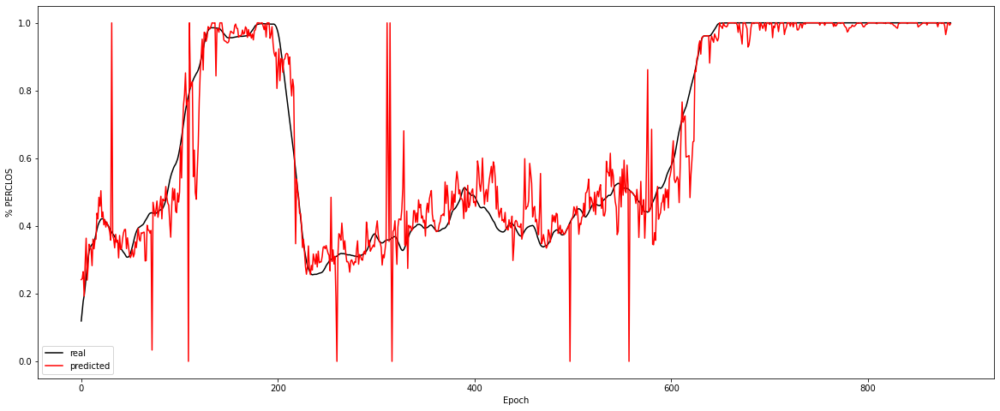

Experiment: 2_20151106_noon
Best Model:
	Score: -10969.4984
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1584
	r^2: 0.0731


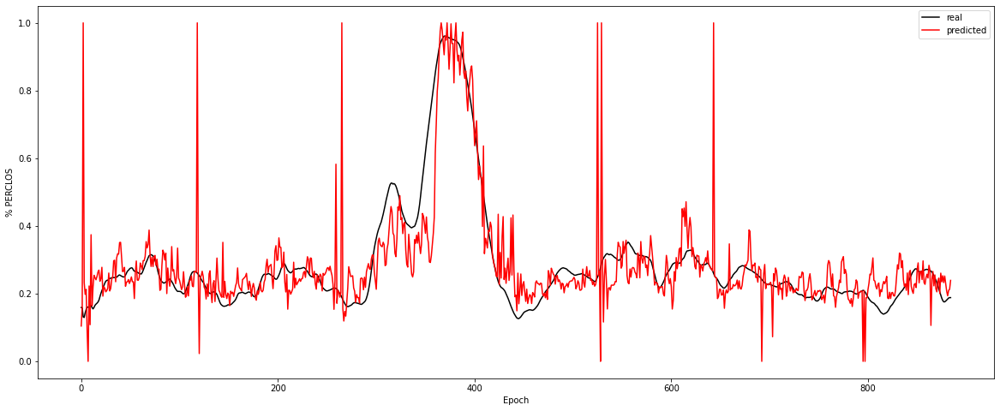

Experiment: 3_20151024_noon
Best Model:
	Score: -140.5309
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1284
	r^2: 0.4902


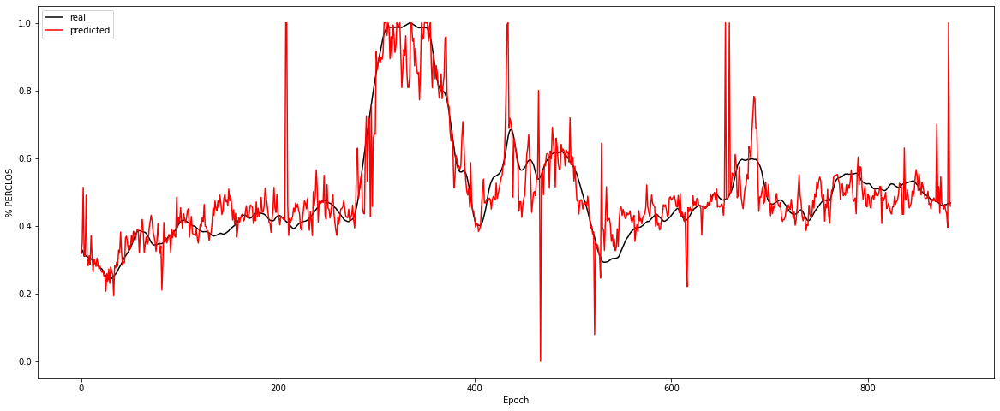

Experiment: 4_20151105_noon
Best Model:
	Score: -436.0942
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2569
	r^2: -0.6863


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in sqrt


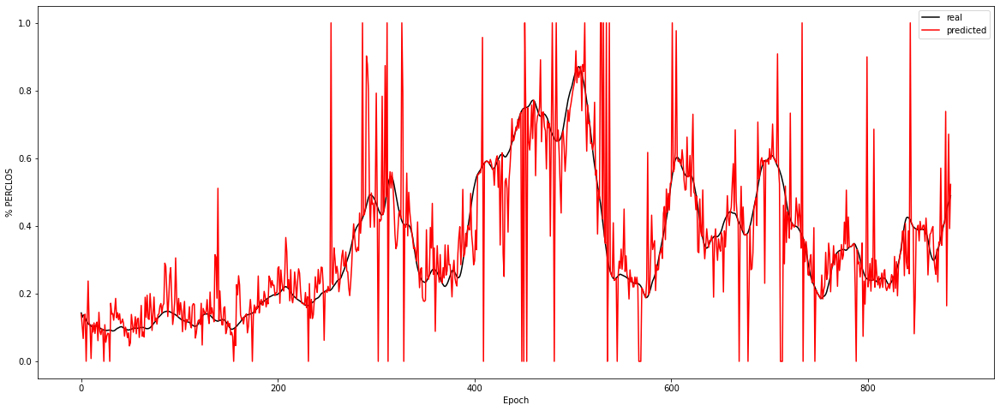

Experiment: 4_20151107_noon
Best Model:
	Score: -402.2940
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2746
	r^2: -0.2833


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in sqrt


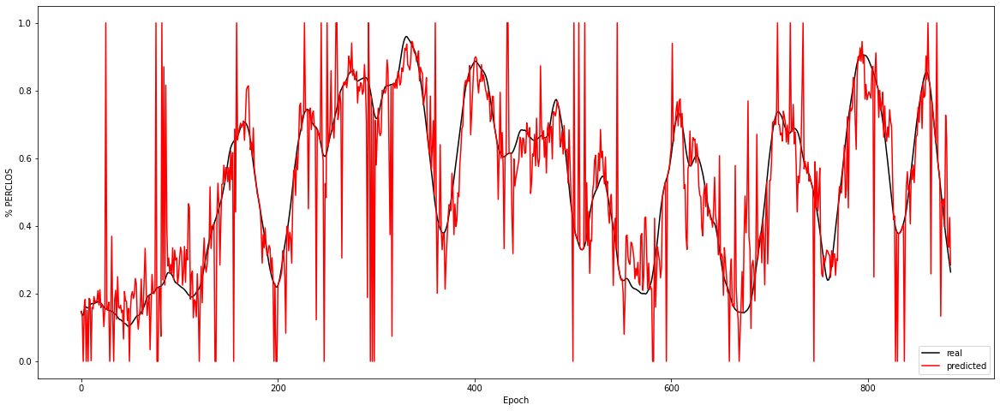

Experiment: 5_20141108_noon
Best Model:
	Score: -115.6749
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2152
	r^2: 0.5479


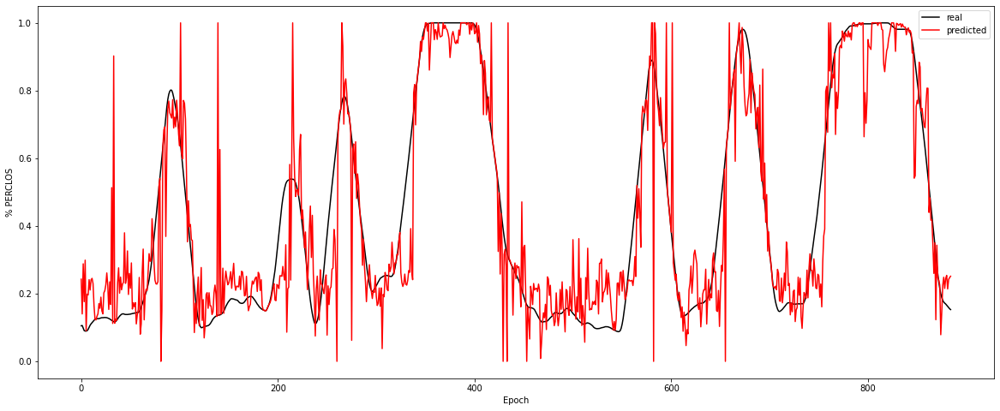

Experiment: 5_20151012_night
Best Model:
	Score: -106.8422
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1677
	r^2: 0.6274


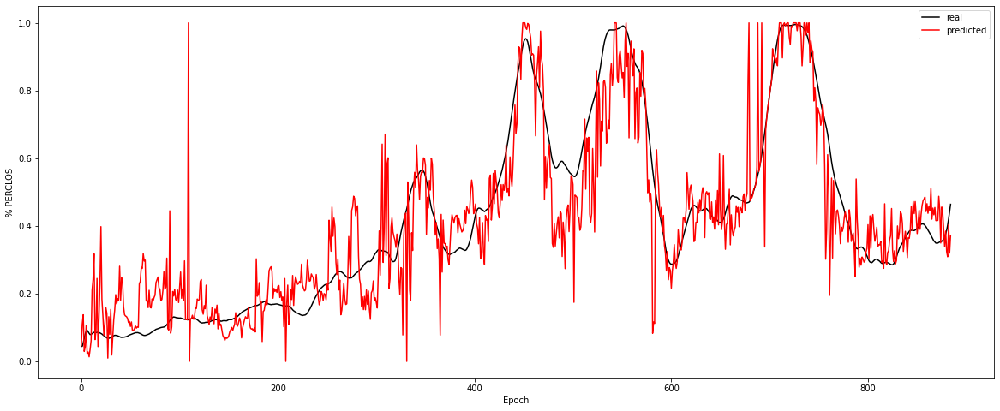

Experiment: 6_20151121_noon
Best Model:
	Score: -743.6167
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1554
	r^2: -0.4524


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in sqrt


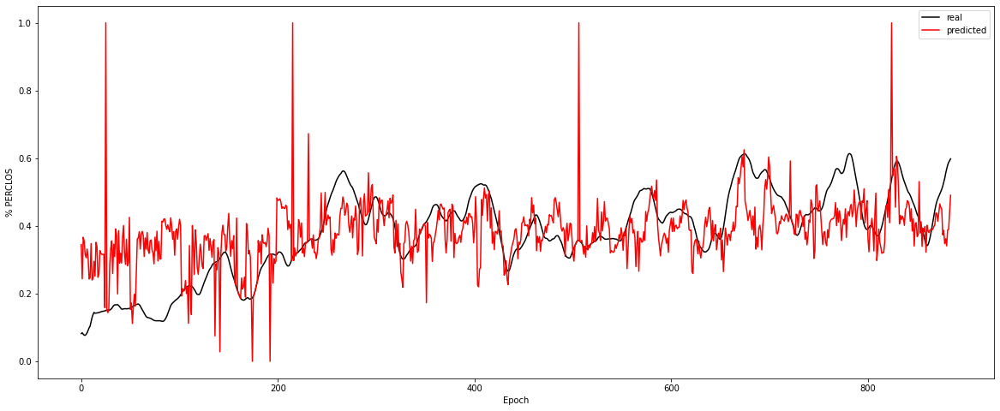

Experiment: 7_20151015_night
Best Model:
	Score: -317.3015
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1388
	r^2: -0.2030


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in sqrt


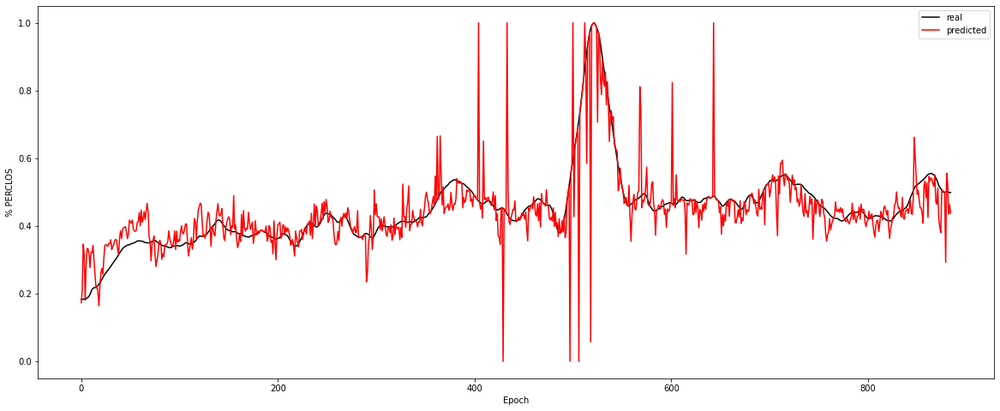

Experiment: 8_20151022_noon
Best Model:
	Score: -3063.3252
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2003
	r^2: 0.2241


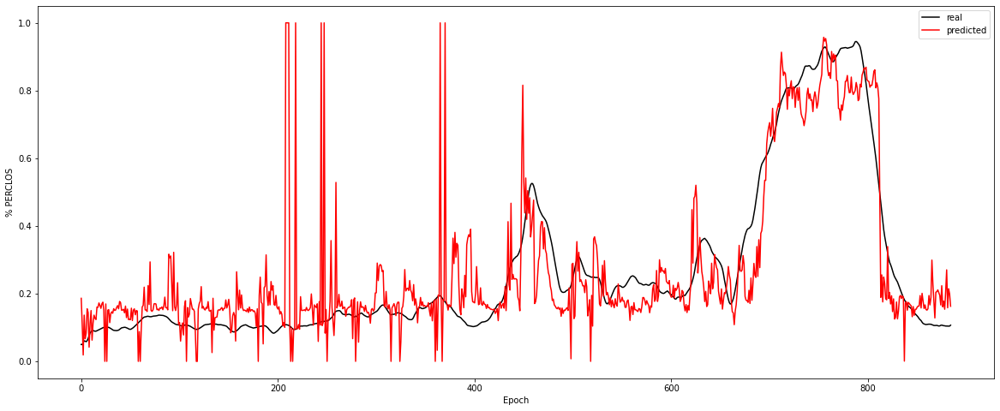

Experiment: 9_20151017_night
Best Model:
	Score: -739.0821
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1822
	r^2: -1.1154


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in sqrt


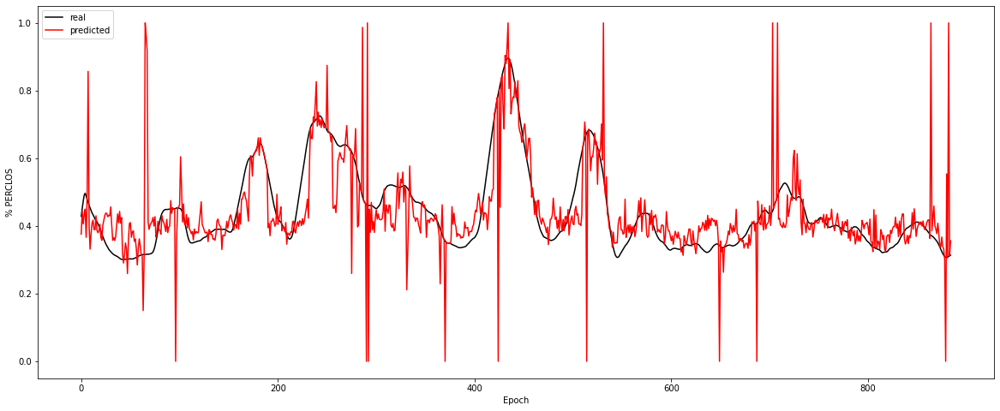

Experiment: 10_20151125_noon
Best Model:
	Score: -487.2990
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1250
	r^2: 0.2765


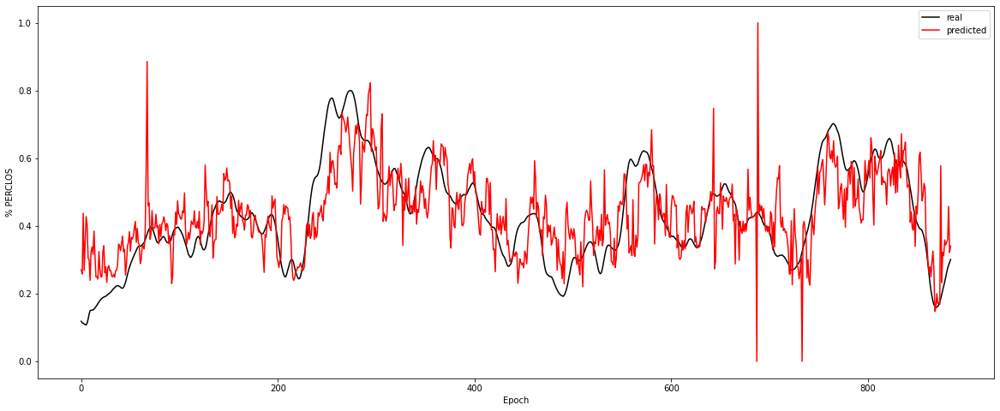

Experiment: 11_20151024_night
Best Model:
	Score: -2285.6607
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1402
	r^2: -0.1266


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in sqrt


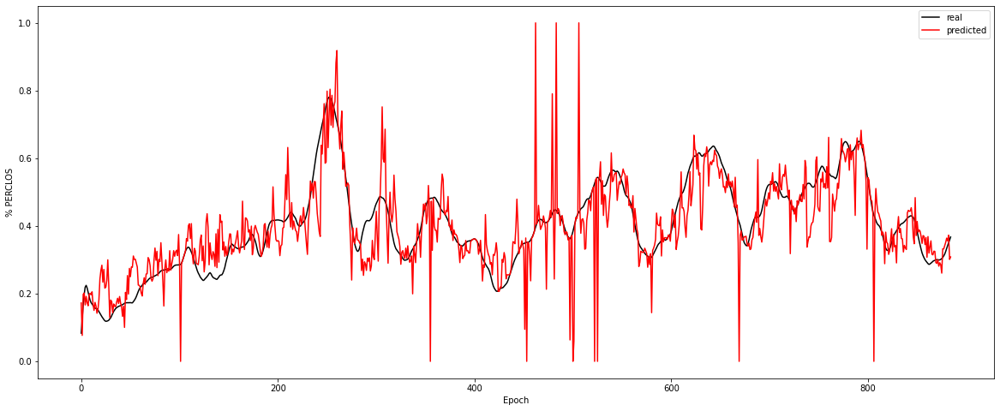

Experiment: 12_20150928_noon
Best Model:
	Score: -97.3703
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1865
	r^2: 0.7609


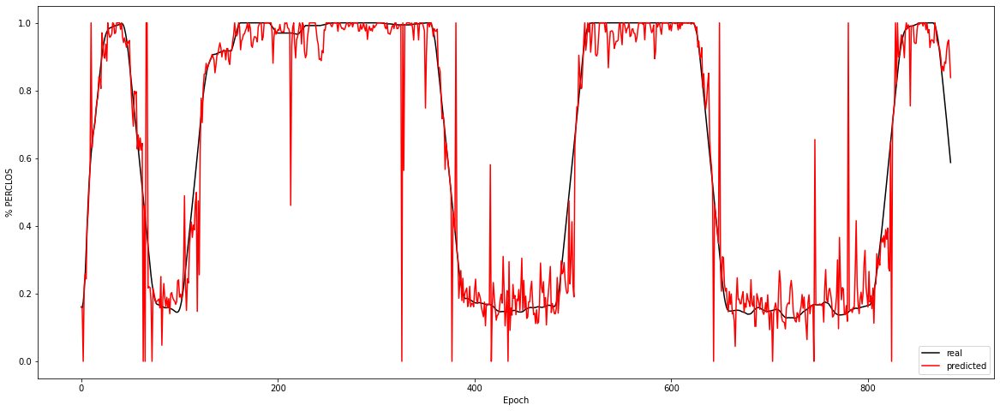

Experiment: 13_20150929_noon
Best Model:
	Score: -348.5762
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.0919
	r^2: 0.7888


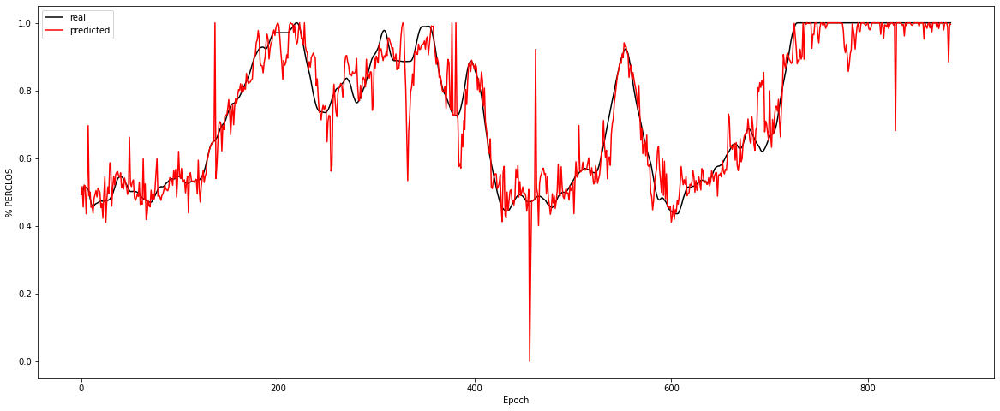

Experiment: 14_20151014_night
Best Model:
	Score: -2484.2264
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2405
	r^2: -0.0898


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in sqrt


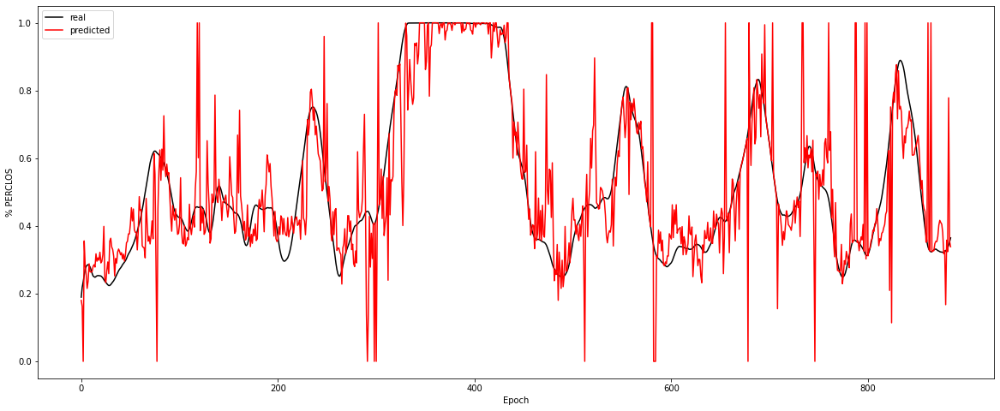

Experiment: 15_20151126_night
Best Model:
	Score: -339.3423
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.0956
	r^2: 0.6930


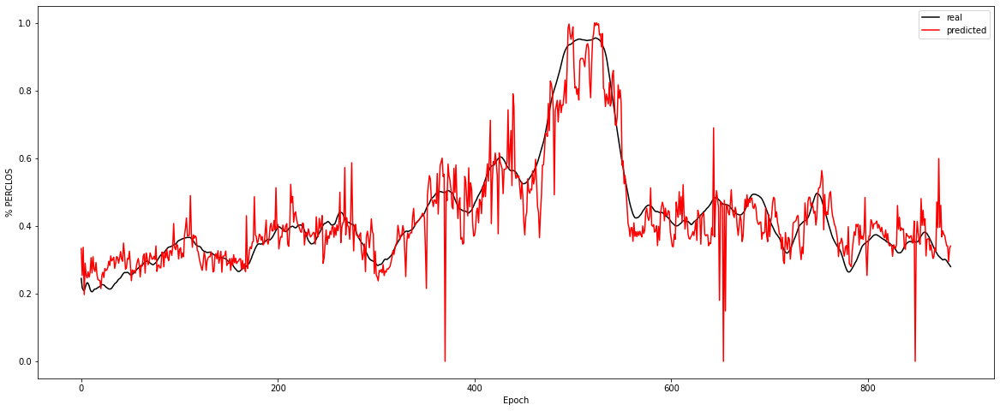

Experiment: 16_20151128_night
Best Model:
	Score: -31948.4702
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1366
	r^2: 0.8261


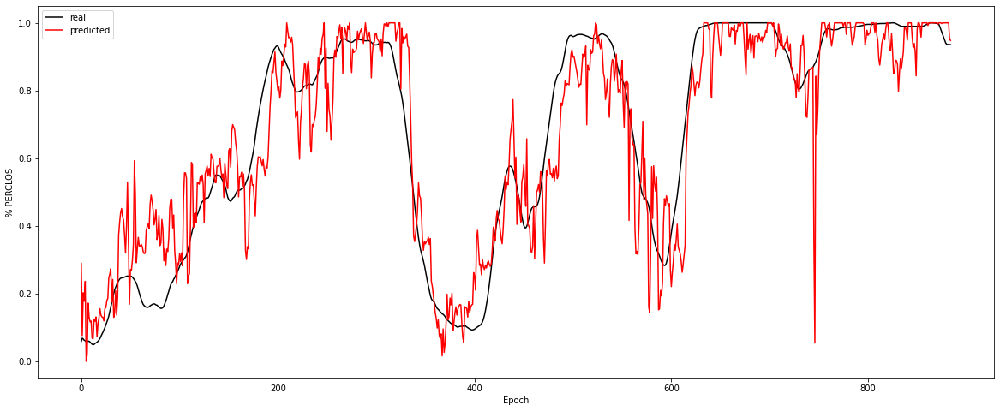

Experiment: 17_20150925_noon
Best Model:
	Score: -327.8057
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1681
	r^2: 0.2461


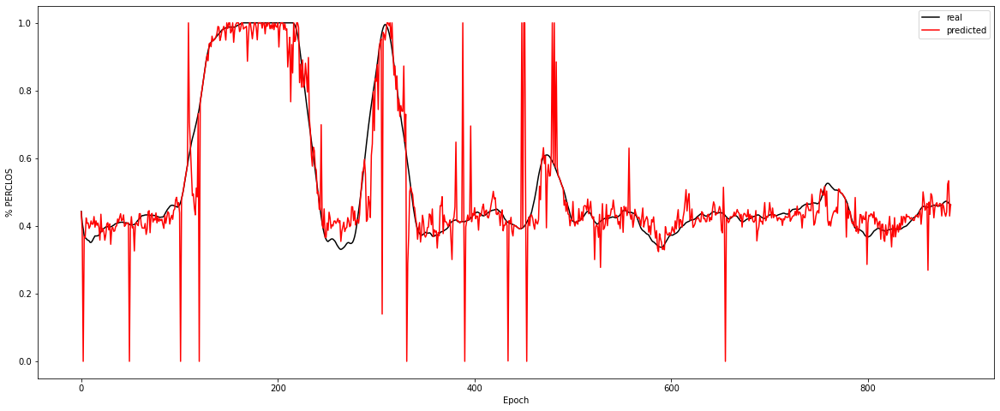

Experiment: 18_20150926_noon
Best Model:
	Score: -67237.3622
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1658
	r^2: 0.7747


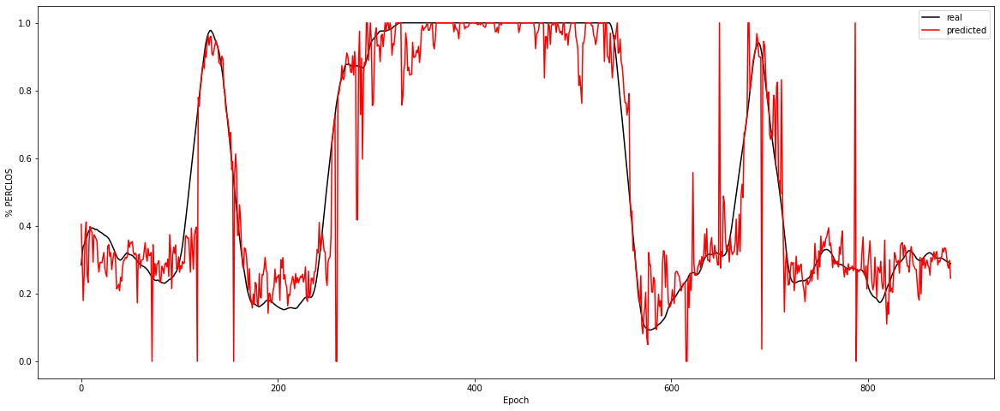

Experiment: 19_20151114_noon
Best Model:
	Score: -717.4262
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.0936
	r^2: 0.3501


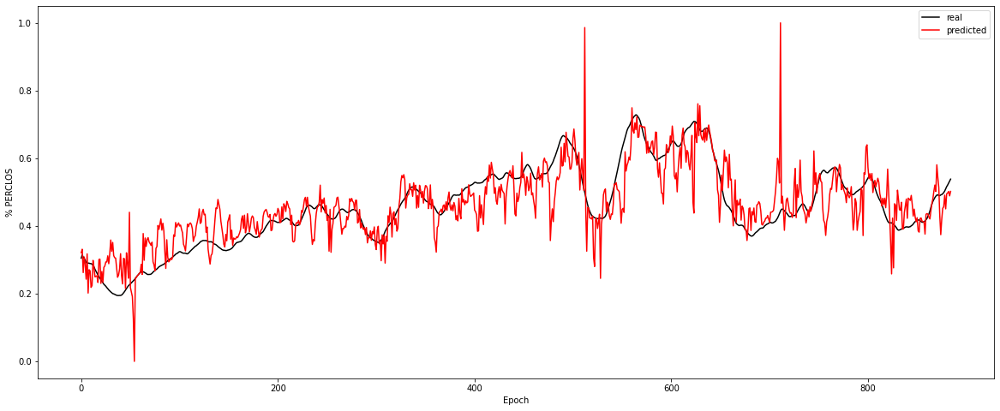

Experiment: 20_20151129_night
Best Model:
	Score: -423.1359
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.2221
	r^2: 0.6265


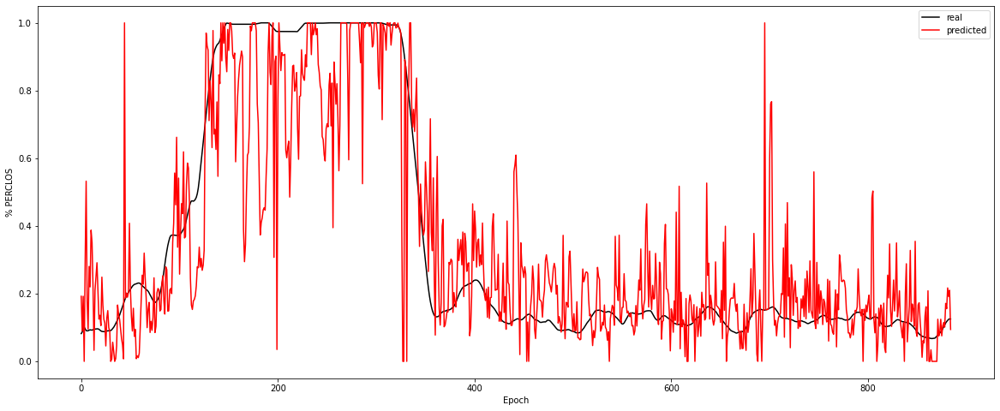

Experiment: 21_20151016_noon
Best Model:
	Score: -1782.8688
	Hyperparameters: {'n_restarts_optimizer': 6, 'optimizer': 'fmin_l_bfgs_b'}

Results with X_test:
	RMSE: 0.1586
	r^2: 0.7617


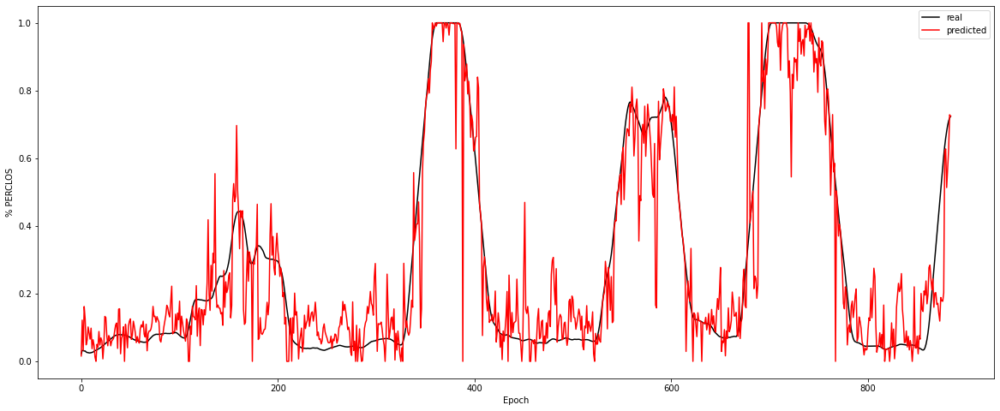

In [43]:
key = '21_20151016_noon'

csv_dict = {
    'sujeto': [],
    'rmse': [],
    'cc': [],
    "r2": []
}

for key in X_all:
    print(f"Experiment: {key}")
    model = GaussianProcessRegressor(random_state=42)

    space = dict()
    #space['alpha'] = uniform(5e-9, 5e-11) #[5e-8, 1e-9, 5e-9, 1e-10, 5e-10, 1e-11, 5e-11]
    space['optimizer'] = ["fmin_l_bfgs_b"]
    space['n_restarts_optimizer'] = randint(0, 10)

    best_model, rmse, r2 = find_and_test_best_model_reg(X_all_eog[key], y_all[key], model, space, cv=10,  n_iter=20)
    
    csv_dict['sujeto'].append(key)
    csv_dict['rmse'].append(rmse)
    csv_dict['cc'].append(np.sqrt(r2))
    csv_dict['r2'].append(r2)

    plot_results_reg(X_all_eog[key], y_all[key], best_model)
df = pd.DataFrame(csv_dict)
df.to_csv('./results_reg/GP-PSD+EOG.csv', index=False) 

# <a href="https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html">Random Forest</a>

In [6]:
from sklearn.ensemble import RandomForestRegressor

### Mean, STD, var, p05, ...

Experiment: 1_20151124_noon_2
Best Model:
	Score: 0.8422
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.1145
	r^2: 0.8314


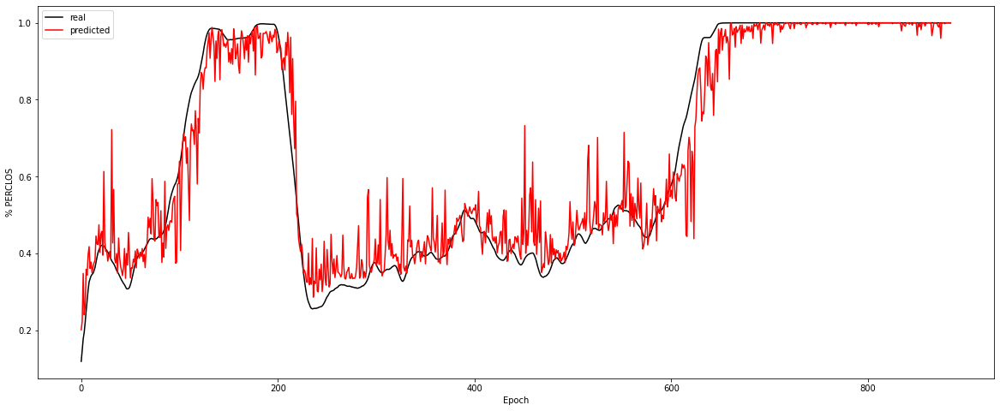

Experiment: 2_20151106_noon
Best Model:
	Score: 0.2817
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.1322
	r^2: 0.3546


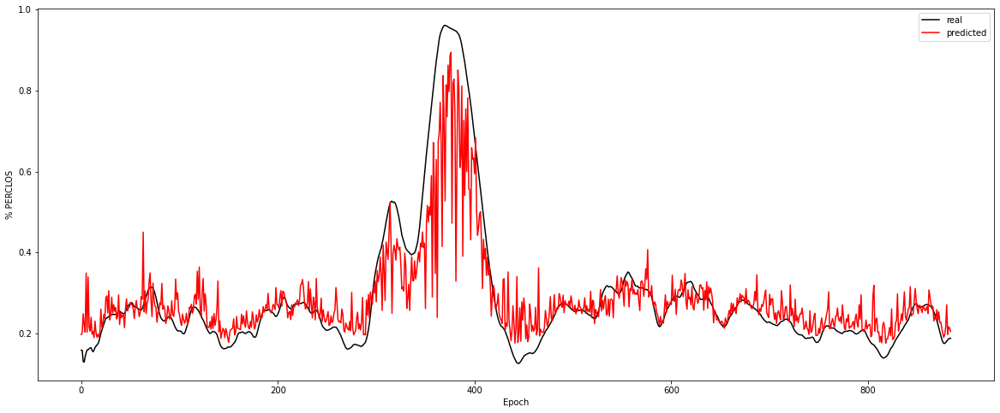

Experiment: 3_20151024_noon
Best Model:
	Score: 0.5470
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.1123
	r^2: 0.6100


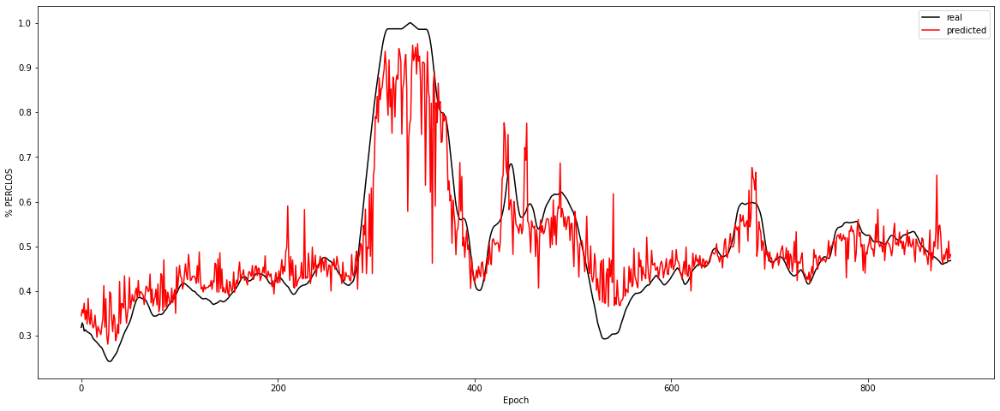

Experiment: 4_20151105_noon
Best Model:
	Score: 0.3189
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.1635
	r^2: 0.3173


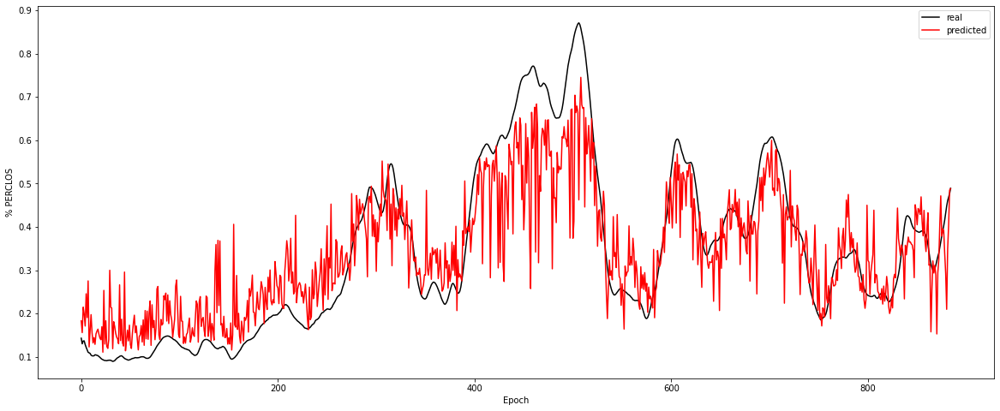

Experiment: 4_20151107_noon
Best Model:
	Score: 0.3987
	Hyperparameters: {'criterion': 'mse', 'max_depth': 92, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 3, 'n_estimators': 83, 'warm_start': False}

Results with X_test:
	RMSE: 0.1889
	r^2: 0.3925


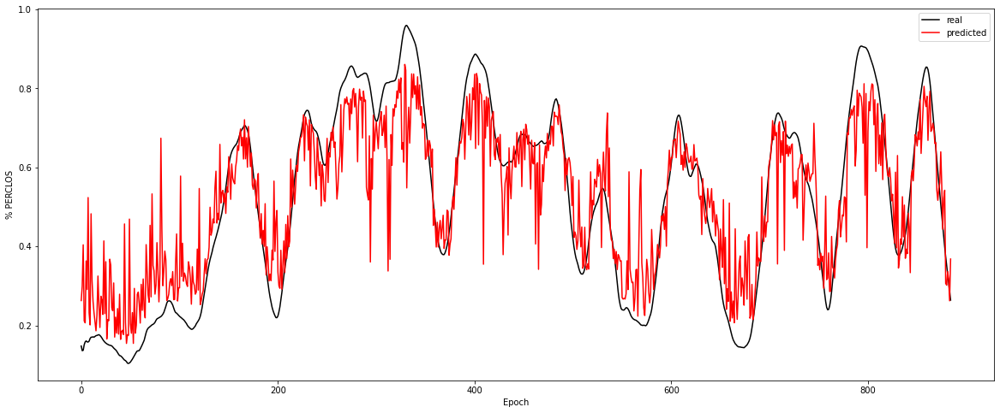

Experiment: 5_20141108_noon


KeyboardInterrupt: 

In [57]:
csv_dict = {
    'sujeto': [],
    'rmse': [],
    'cc': [],
    "r2": []
}

for file in features_files:
    
    X, y = read_features(f'./features/{file[:-4]}.csv')
    #X, y = read_features(file, features=[0, 1])

    scaler = MinMaxScaler(feature_range=(0, 1))
    X_minmax = scaler.fit_transform(X)

    scaler = StandardScaler()
    X_standar = scaler.fit_transform(X)

    key = file[:-4]
    print(f"Experiment: {key}")
    model = RandomForestRegressor(random_state=42)

    space = dict()
    space['n_estimators'] = randint(75, 200)
    space['criterion'] = ['mse', 'mae']
    space['max_depth'] = randint(75, 150)
    space['min_samples_split'] = randint(2, 10)
    space['min_samples_leaf'] = randint(1, 10)
    # space['min_weight_fraction_leaf'X_all_eogform(0, 0.5)
    space['max_features'] = ["auto", "sqrt", "log2"]
    #space['max_leaf_nodes'] = randint(1, 300)
    # space['min_impurity_decrease'] = uniform(0, 5)
    #space['bootstrap'] = [True, False]
    # space['oob_score'] = [True, False]
    space['warm_start'] = [True, False]
    # space['class_weight'] = ['balanced', 'balanced_subsample']
    #space['ccp_alpha'] = uniform(0, 5)
    #space['max_samples'] = uniform(0, 1)

    best_model, rmse, r2 = find_and_test_best_model_reg(X_minmax, y, model, space, cv=10,  n_iter=10)
    
    csv_dict['sujeto'].append(key)
    csv_dict['rmse'].append(rmse)
    csv_dict['cc'].append(np.sqrt(r2))
    csv_dict['r2'].append(r2)

    plot_results_reg(X_minmax, y, best_model)
    
df = pd.DataFrame(csv_dict)
df.to_csv('./results_reg/RF-EEG.csv', index=False)

### PSD

In [58]:
key = '21_20151016_noon'

csv_dict = {
    'sujeto': [],
    'rmse': [],
    'cc': [],
    "r2": []
}

for key in X_all:
    print(f"Experiment: {key}")
    model = RandomForestRegressor(random_state=42)

    space = dict()
    space['n_estimators'] = randint(75, 200)
    space['criterion'] = ['mse', 'mae']
    space['max_depth'] = randint(75, 150)
    space['min_samples_split'] = randint(2, 10)
    space['min_samples_leaf'] = randint(1, 10)
    # space['min_weight_fraction_leaf'X_all_eogform(0, 0.5)
    space['max_features'] = ["auto", "sqrt", "log2"]
    #space['max_leaf_nodes'] = randint(1, 300)
    # space['min_impurity_decrease'] = uniform(0, 5)
    #space['bootstrap'] = [True, False]
    # space['oob_score'] = [True, False]
    space['warm_start'] = [True, False]
    # space['class_weight'] = ['balanced', 'balanced_subsample']
    #space['ccp_alpha'] = uniform(0, 5)
    #space['max_samples'] = uniform(0, 1)

    best_model, rmse, r2 = find_and_test_best_model_reg(X_all[key], y_all[key], model, space, cv=10,  n_iter=20)
    
    csv_dict['sujeto'].append(key)
    csv_dict['rmse'].append(rmse)
    csv_dict['cc'].append(np.sqrt(r2))
    csv_dict['r2'].append(r2)

    #     plot_results_reg(X_all[key], y_all[key], best_model)
    
df = pd.DataFrame(csv_dict)
df.to_csv('./results_reg/RF-PSD.csv', index=False) 

Experiment: 1_20151124_noon_2
Best Model:
	Score: 0.9502
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.0647
	r^2: 0.9462
Experiment: 2_20151106_noon
Best Model:
	Score: 0.7269
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.0838
	r^2: 0.7404
Experiment: 3_20151024_noon
Best Model:
	Score: 0.7455
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.0757
	r^2: 0.8228
Experiment: 4_20151105_noon
Best Model:
	Score: 0.6795
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_spli

KeyboardInterrupt: 

In [7]:
key = '5_20141108_noon'
print(f"Experiment: {key}")
model = RandomForestRegressor(random_state=42)

space = dict()
space['n_estimators'] = randint(75, 200)
space['criterion'] = ['mse', 'mae']
space['max_depth'] = randint(75, 150)
space['min_samples_split'] = randint(2, 10)
space['min_samples_leaf'] = randint(1, 10)
# space['min_weight_fraction_leaf'X_all_eogform(0, 0.5)
space['max_features'] = ["auto", "sqrt", "log2"]
#space['max_leaf_nodes'] = randint(1, 300)
# space['min_impurity_decrease'] = uniform(0, 5)
#space['bootstrap'] = [True, False]
# space['oob_score'] = [True, False]
space['warm_start'] = [True, False]
# space['class_weight'] = ['balanced', 'balanced_subsample']
#space['ccp_alpha'] = uniform(0, 5)
#space['max_samples'] = uniform(0, 1)

best_model, rmse, r2 = find_and_test_best_model_reg(X_all_eog[key], y_all[key], model, space, cv=10,  n_iter=20)

Experiment: 5_20141108_noon
Best Model:
	Score: 0.8412
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.1390
	r^2: 0.8113


In [8]:
attribs = ['psd_delta', 'psd_theta', 'psd_alpha', 'psd_betha', 'psd_gamma', 'n_parpadeos']
importances = best_model.feature_importances_
importance_features = sorted(zip(importances, attribs), reverse=True)
for imp, attr in importance_features:
    print(f'{attr}: {imp:.4f}')

n_parpadeos: 0.3204
psd_alpha: 0.2544
psd_theta: 0.1538
psd_gamma: 0.0984
psd_delta: 0.0894
psd_betha: 0.0835


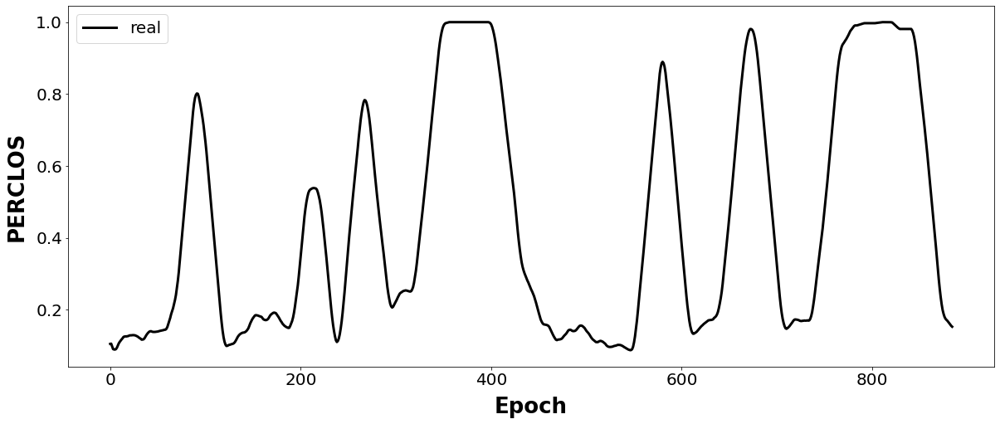

In [9]:
plt.figure(figsize=(20, 8))
plt.plot(y_all[key], color="black", label="real", zorder=0, linewidth=3)
predictions = best_model.predict(X_all_eog[key])
predictions = np.clip(predictions, 0, 1)
# plt.plot(predictions, color="red", label="predicted", linewidth=3)

size_label = 26; plt.xlabel('Epoch', fontweight ='bold', labelpad = 10,fontsize = size_label); plt.ylabel('PERCLOS', fontweight ='bold', labelpad = 10,fontsize = size_label);
size_ticks = 20; plt.xticks(fontsize=size_ticks); plt.yticks(fontsize=size_ticks);
size_legend = 20; plt.legend(loc='best', fontsize = size_legend)
plt.savefig("E:/UNIVERSIDAD/TFG/TRABAJO/Images-Test/NOMBRE.pdf", bbox_inches='tight')

plt.show()

### PSD + EOG

Experiment: 1_20151124_noon_2
Best Model:
	Score: 0.9489
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.0652
	r^2: 0.9453


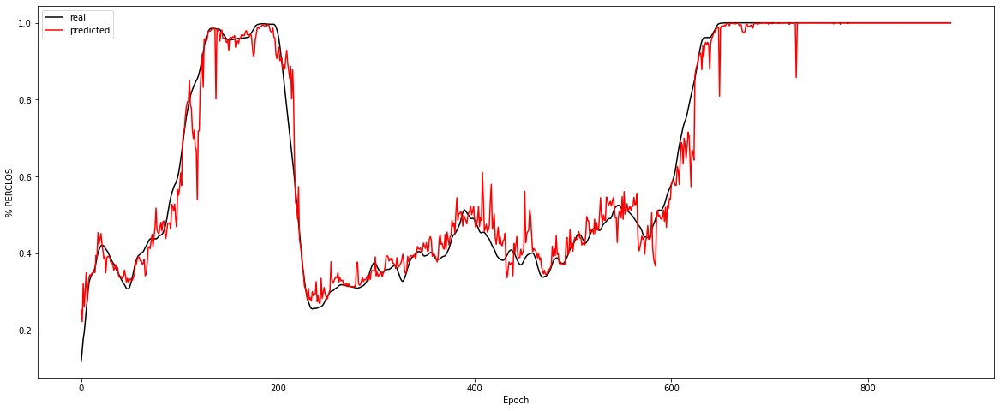

Experiment: 2_20151106_noon
Best Model:
	Score: 0.7288
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.0830
	r^2: 0.7456


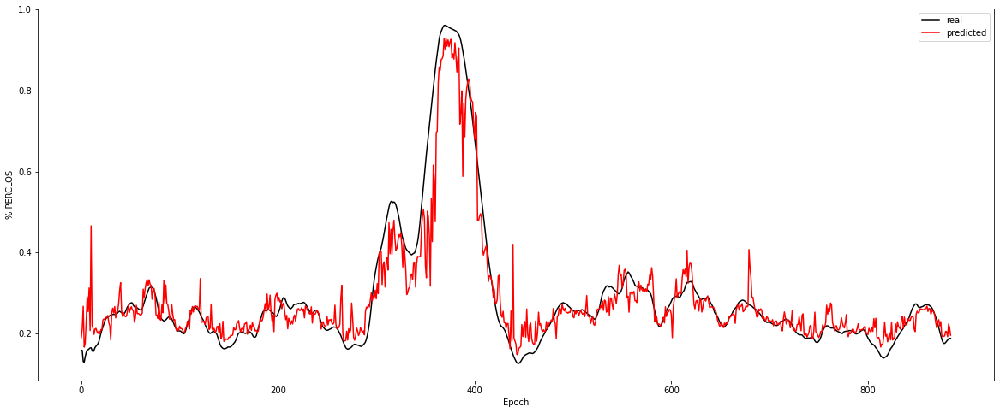

Experiment: 3_20151024_noon
Best Model:
	Score: 0.7594
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.0731
	r^2: 0.8346


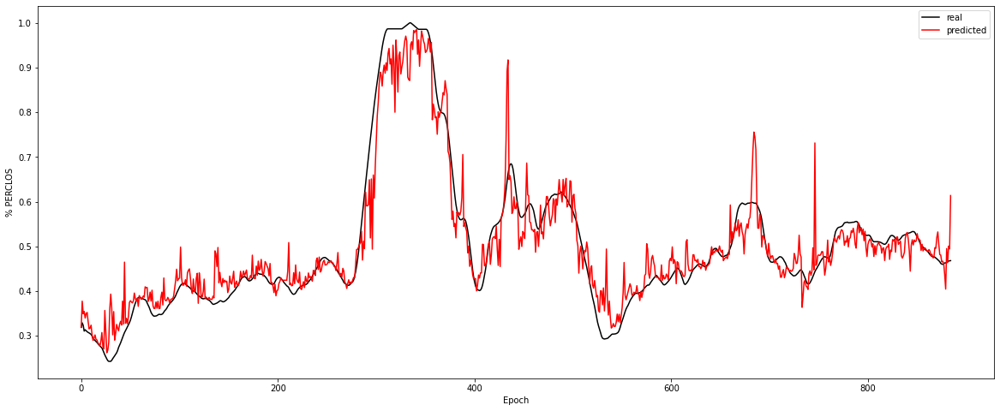

Experiment: 4_20151105_noon
Best Model:
	Score: 0.6703
	Hyperparameters: {'criterion': 'mse', 'max_depth': 92, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 3, 'n_estimators': 83, 'warm_start': False}

Results with X_test:
	RMSE: 0.0993
	r^2: 0.7480


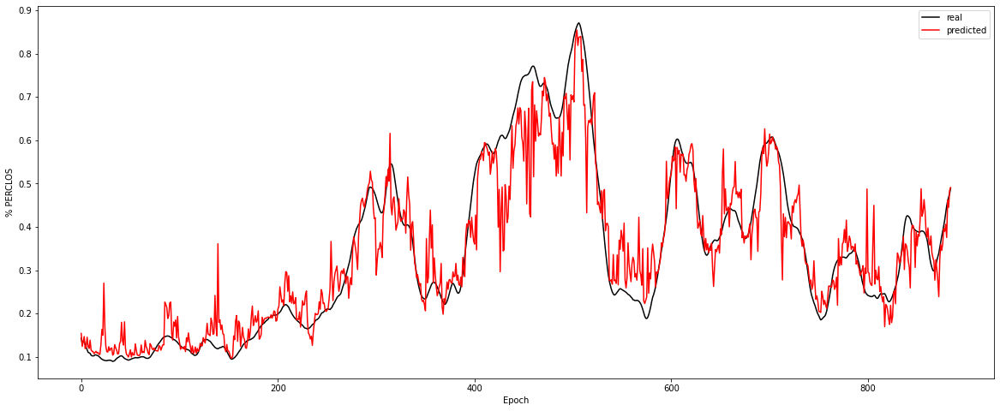

Experiment: 4_20151107_noon
Best Model:
	Score: 0.7348
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.1219
	r^2: 0.7472


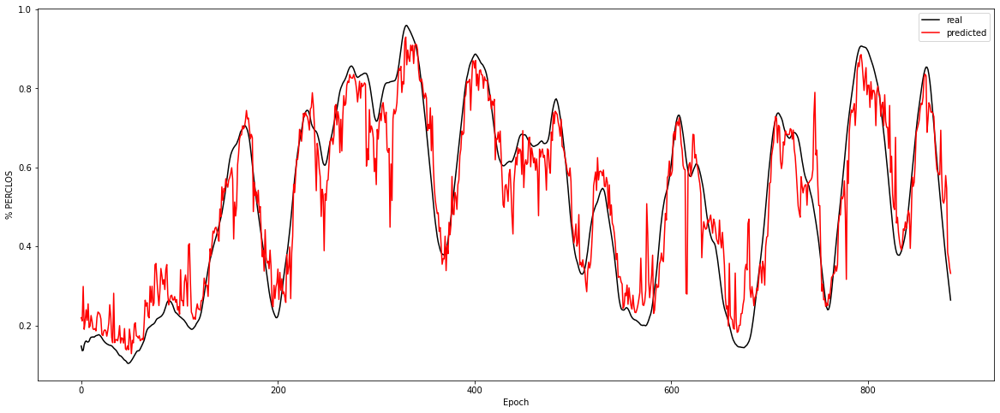

Experiment: 5_20141108_noon
Best Model:
	Score: 0.8412
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.1390
	r^2: 0.8113


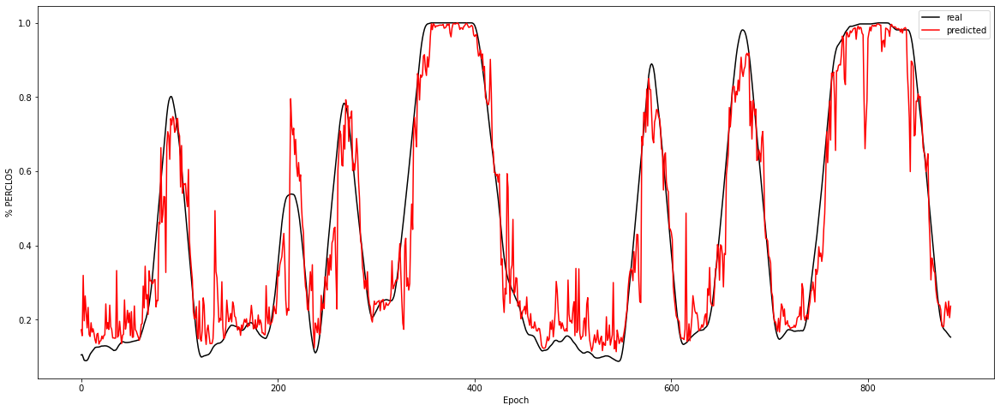

Experiment: 5_20151012_night
Best Model:
	Score: 0.8471
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.1027
	r^2: 0.8603


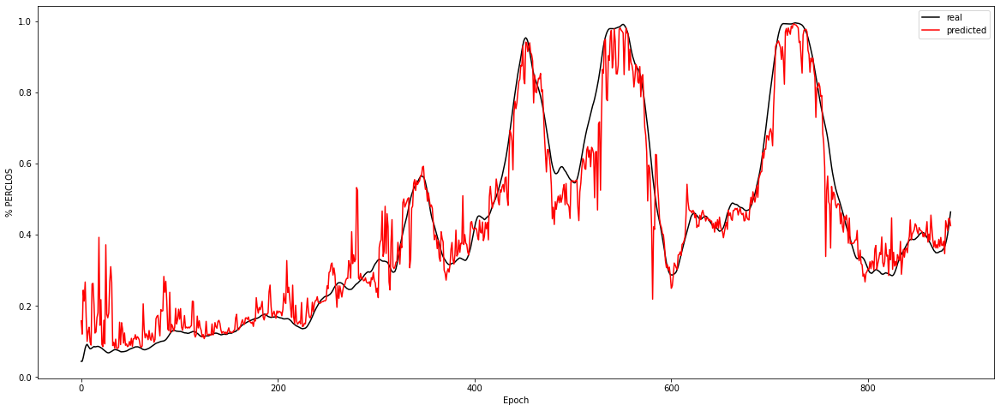

Experiment: 6_20151121_noon
Best Model:
	Score: 0.5640
	Hyperparameters: {'criterion': 'mse', 'max_depth': 92, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 3, 'n_estimators': 83, 'warm_start': False}

Results with X_test:
	RMSE: 0.0822
	r^2: 0.5937


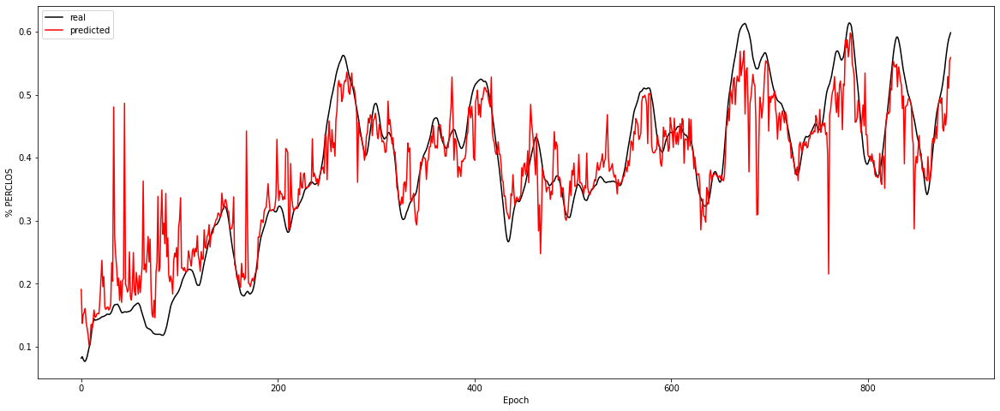

Experiment: 7_20151015_night
Best Model:
	Score: 0.7379
	Hyperparameters: {'criterion': 'mse', 'max_depth': 92, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 3, 'n_estimators': 83, 'warm_start': False}

Results with X_test:
	RMSE: 0.0512
	r^2: 0.8365


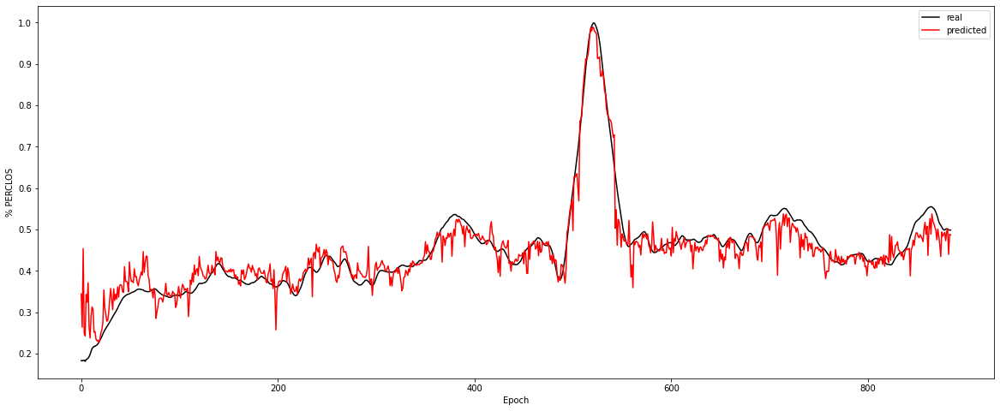

Experiment: 8_20151022_noon
Best Model:
	Score: 0.9338
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.0619
	r^2: 0.9259


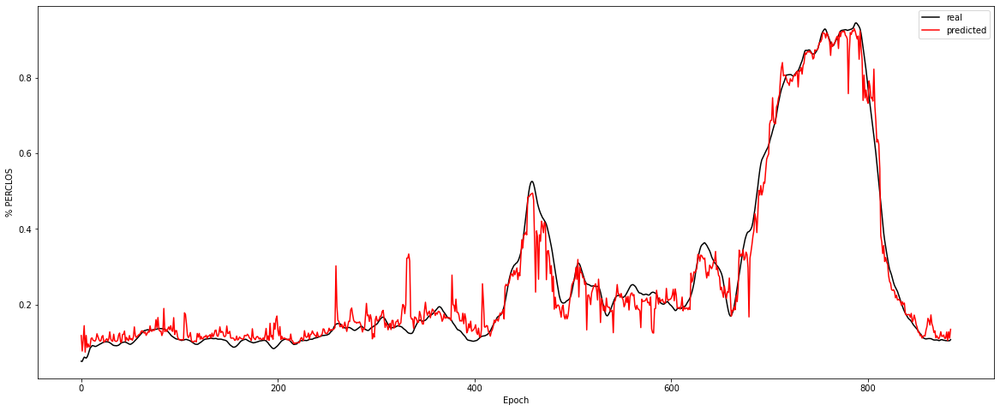

Experiment: 9_20151017_night
Best Model:
	Score: 0.6896
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.0658
	r^2: 0.7241


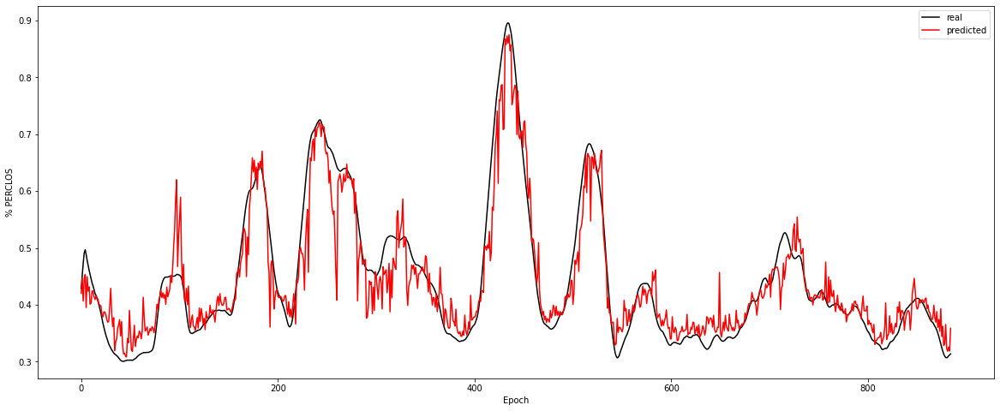

Experiment: 10_20151125_noon
Best Model:
	Score: 0.6484
	Hyperparameters: {'criterion': 'mse', 'max_depth': 92, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 3, 'n_estimators': 83, 'warm_start': False}

Results with X_test:
	RMSE: 0.0730
	r^2: 0.7532


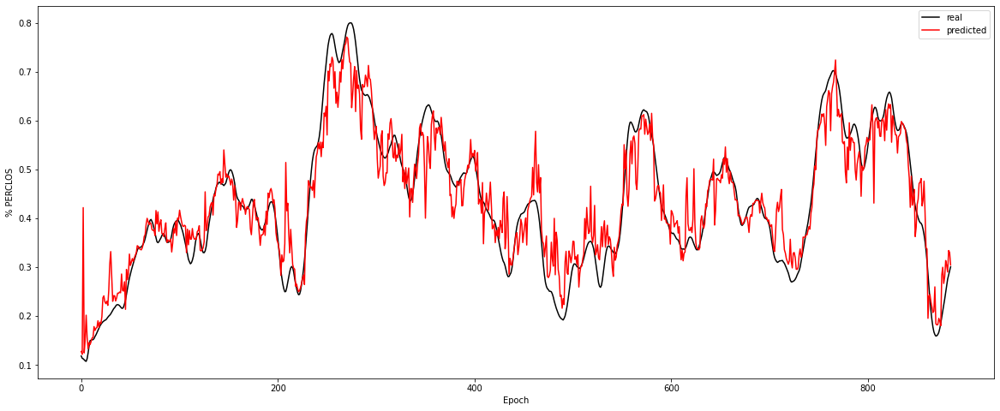

Experiment: 11_20151024_night
Best Model:
	Score: 0.6793
	Hyperparameters: {'criterion': 'mse', 'max_depth': 92, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 3, 'n_estimators': 83, 'warm_start': False}

Results with X_test:
	RMSE: 0.0668
	r^2: 0.7443


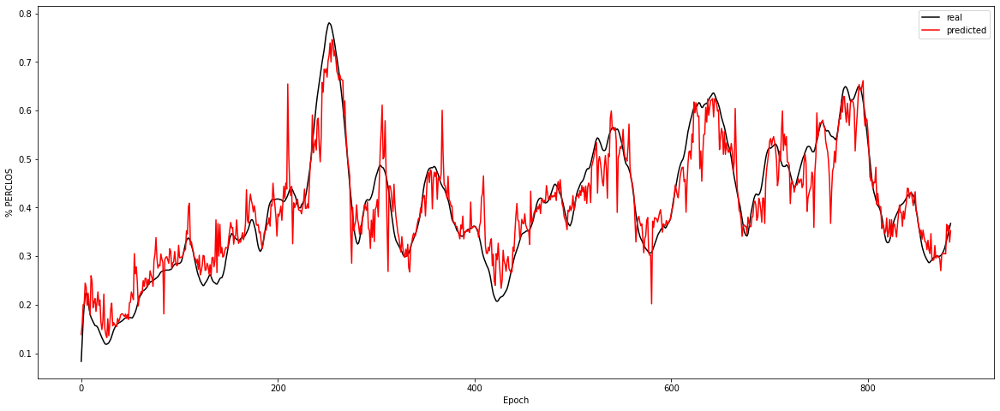

Experiment: 12_20150928_noon
Best Model:
	Score: 0.9408
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.0886
	r^2: 0.9460


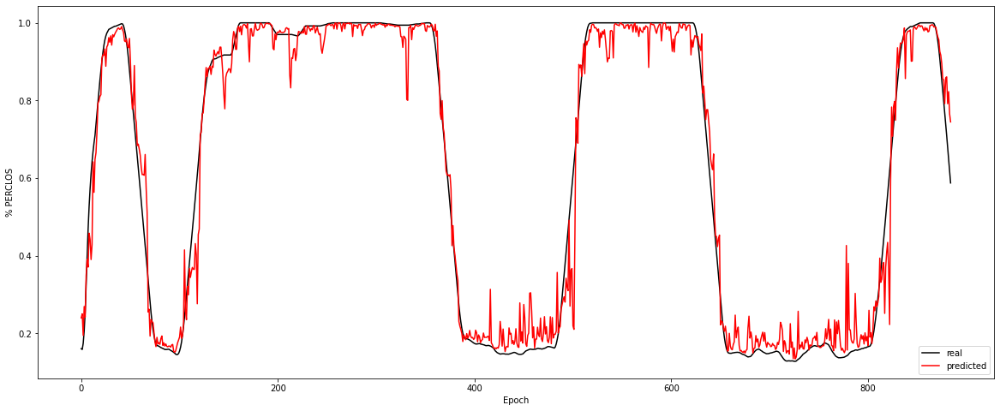

Experiment: 13_20150929_noon
Best Model:
	Score: 0.9116
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.0646
	r^2: 0.8956


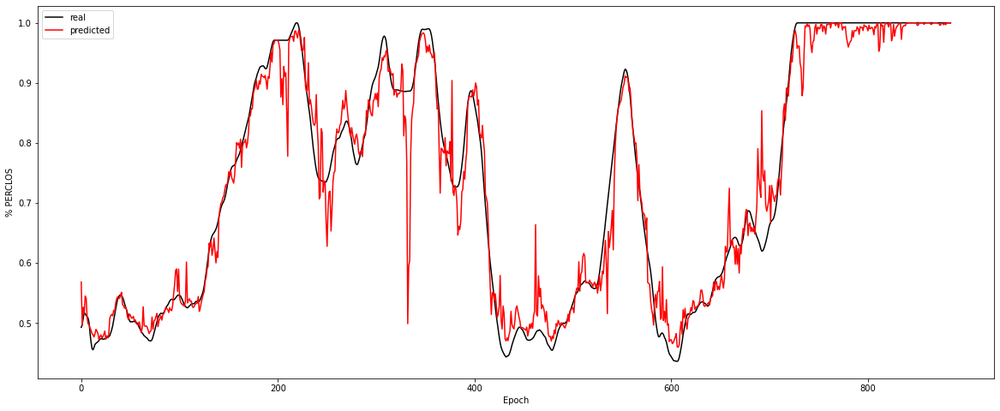

Experiment: 14_20151014_night
Best Model:
	Score: 0.7785
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.1025
	r^2: 0.8018


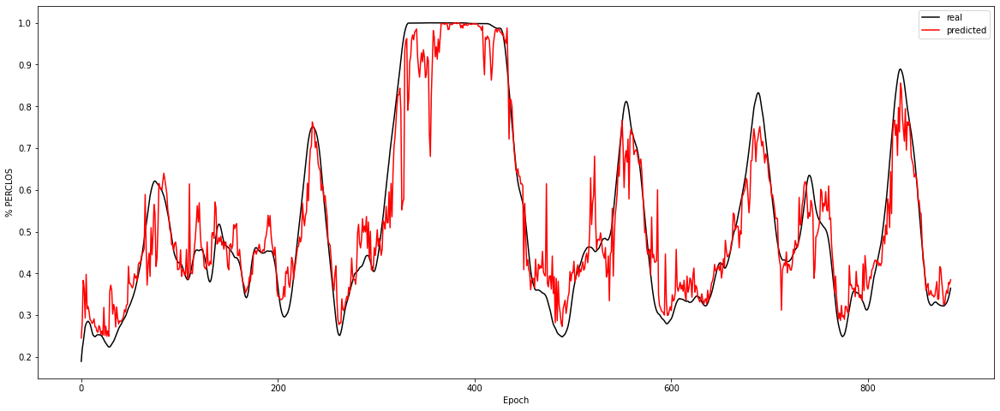

Experiment: 15_20151126_night
Best Model:
	Score: 0.8781
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.0609
	r^2: 0.8754


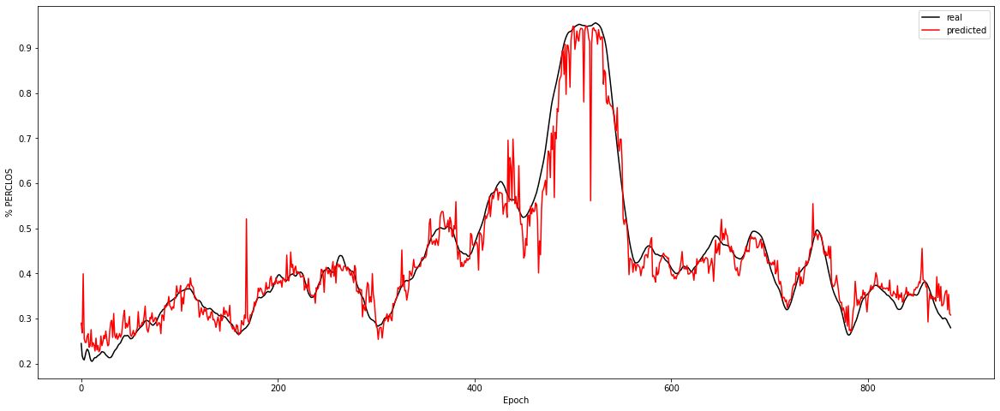

Experiment: 16_20151128_night
Best Model:
	Score: 0.9076
	Hyperparameters: {'criterion': 'mse', 'max_depth': 92, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 3, 'n_estimators': 83, 'warm_start': False}

Results with X_test:
	RMSE: 0.0854
	r^2: 0.9321


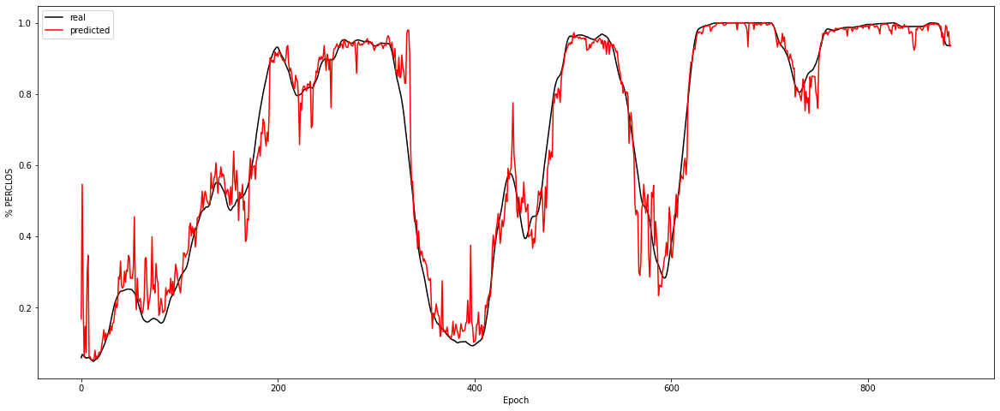

Experiment: 17_20150925_noon
Best Model:
	Score: 0.8908
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.0732
	r^2: 0.8570


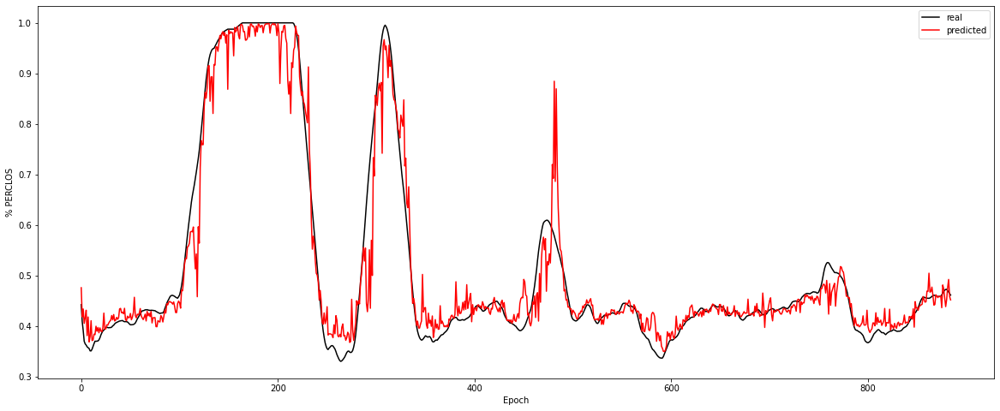

Experiment: 18_20150926_noon
Best Model:
	Score: 0.9401
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.0760
	r^2: 0.9527


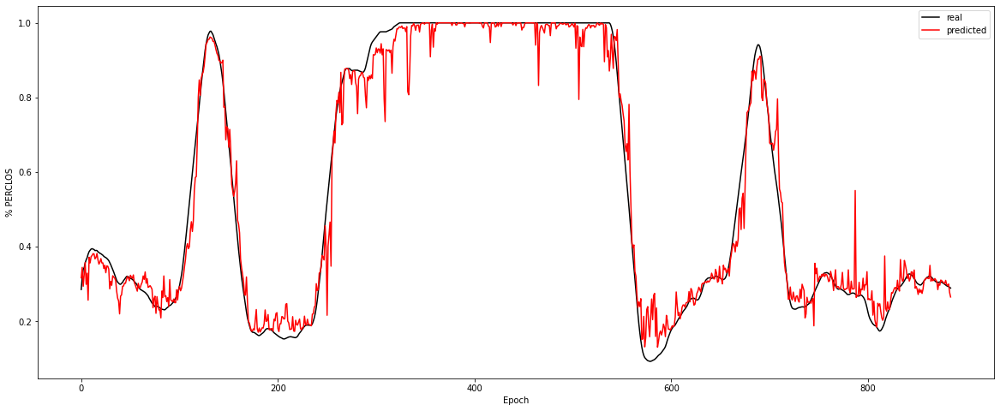

Experiment: 19_20151114_noon
Best Model:
	Score: 0.7460
	Hyperparameters: {'criterion': 'mse', 'max_depth': 92, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 3, 'n_estimators': 83, 'warm_start': False}

Results with X_test:
	RMSE: 0.0572
	r^2: 0.7572


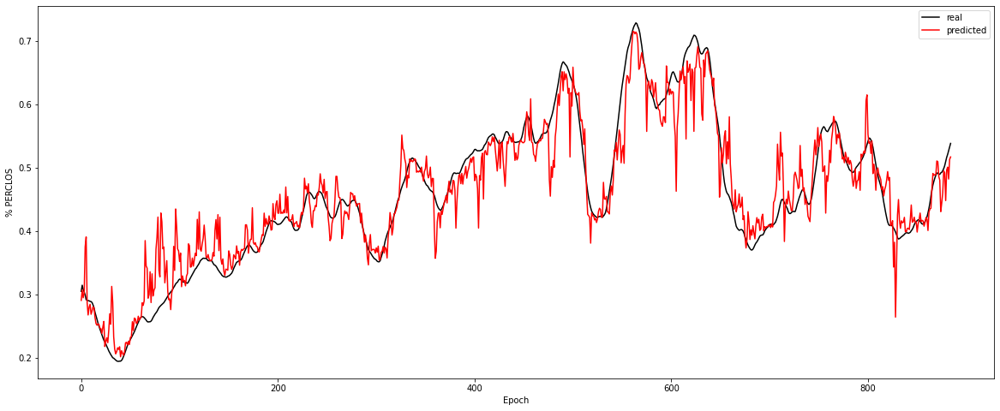

Experiment: 20_20151129_night
Best Model:
	Score: 0.7570
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.1341
	r^2: 0.8638


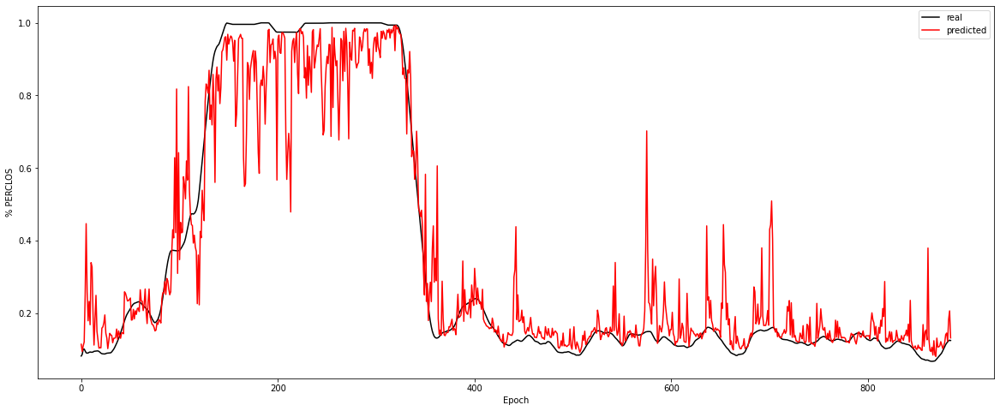

Experiment: 21_20151016_noon
Best Model:
	Score: 0.8440
	Hyperparameters: {'criterion': 'mse', 'max_depth': 109, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 124, 'warm_start': False}

Results with X_test:
	RMSE: 0.0981
	r^2: 0.9088


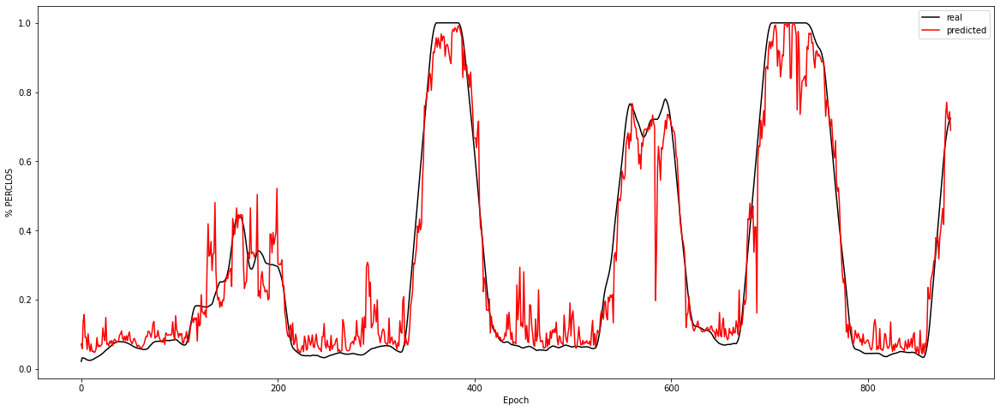

In [7]:
key = '21_20151016_noon'

csv_dict = {
    'sujeto': [],
    'rmse': [],
    'cc': [],
    "r2": []
}

for key in X_all:
    print(f"Experiment: {key}")
    model = RandomForestRegressor(random_state=42)

    space = dict()
    space['n_estimators'] = randint(75, 200)
    space['criterion'] = ['mse', 'mae']
    space['max_depth'] = randint(75, 150)
    space['min_samples_split'] = randint(2, 10)
    space['min_samples_leaf'] = randint(1, 10)
    # space['min_weight_fraction_leaf'X_all_eogform(0, 0.5)
    space['max_features'] = ["auto", "sqrt", "log2"]
    #space['max_leaf_nodes'] = randint(1, 300)
    # space['min_impurity_decrease'] = uniform(0, 5)
    #space['bootstrap'] = [True, False]
    # space['oob_score'] = [True, False]
    space['warm_start'] = [True, False]
    # space['class_weight'] = ['balanced', 'balanced_subsample']
    #space['ccp_alpha'] = uniform(0, 5)
    #space['max_samples'] = uniform(0, 1)

    best_model, rmse, r2 = find_and_test_best_model_reg(X_all_eog[key], y_all[key], model, space, cv=10,  n_iter=20)
    
    csv_dict['sujeto'].append(key)
    csv_dict['rmse'].append(rmse)
    csv_dict['cc'].append(np.sqrt(r2))
    csv_dict['r2'].append(r2)

    plot_results_reg(X_all_eog[key], y_all[key], best_model)
    
# df = pd.DataFrame(csv_dict)
# df.to_csv('./results_reg/RF-PSD+EOG.csv', index=False) 